# Import Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import plotly.express as px
from pandas_profiling import ProfileReport

pd.options.display.float_format = '{:.0f}'.format

In [2]:
startDate = '1992-01-01'

In [3]:
def formatDates(data, position):
    dates = []
    for index, row in data.iterrows():
        dates.append(str(row[position])[:8] + '01')
    return dates

def resampleMonthly(data, dateColumn, dateLocation, on, method):
    df = data.resample('M', on=on).mean().interpolate(method=method)
    df.reset_index(inplace=True)
    df[dateColumn] = formatDates(df, dateLocation)
    df[dateColumn] = pd.to_datetime(df[dateColumn])
    df.sort_values(dateColumn, inplace=True)
    df.set_index(dateColumn,inplace=True)
    return df

# All EU Dataset

In [4]:
EUdata = pd.read_csv('data/apro_mt_pwgtm_1_Data.csv')
EUdata = EUdata[EUdata['UNIT'] == 'Thousand tonnes']
EUdata = EUdata[['TIME', 'GEO', 'MEAT', 'Value']]
EUdata.columns = ['Date', 'Country', 'Meat', 'Value']
#EUdata = EUdata[(EUdata.Meat == 'Bovine meat') | (EUdata.Meat == 'Pigmeat')]
#EUdata = EUdata[EUdata.Meat == 'Bovine meat']

EUdata.Date = pd.to_datetime(EUdata.Date, format='%YM%m')
EUdata = EUdata[EUdata.Date >= startDate]

EUdata['Country'] = EUdata['Country'].str.slice(0,7)
EUdata = EUdata.replace([':'], 0, regex=True)
EUdata['Value'] = EUdata['Value'].astype(float)

EUdata.reset_index(inplace=True, drop=True)

EUdata

,Date,Country,Meat,Value
0,1992-01-01,Germany,Bovine meat,159
1,1992-01-01,Germany,Pigmeat,323
2,1992-01-01,Germany,Sheepmeat,3
3,1992-01-01,Germany,Poultry meat,0
4,1992-01-01,Ireland,Bovine meat,35
...,...,...,...,...
2899,2022-03-01,Germany,Poultry meat,0
2900,2022-03-01,Ireland,Bovine meat,53
2901,2022-03-01,Ireland,Pigmeat,31
2902,2022-03-01,Ireland,Sheepmeat,6


In [5]:
EUdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2904 entries, 0 to 2903
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Date     2904 non-null   datetime64[ns]
 1   Country  2904 non-null   object        
 2   Meat     2904 non-null   object        
 3   Value    2904 non-null   float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 90.9+ KB


# Ireland Slaughter Data

In [6]:
irelandData = EUdata[EUdata['Country'] == 'Ireland'].reset_index(drop=True)
irelandData = irelandData.pivot_table(index='Date', columns='Meat', values='Value')
irelandData.reset_index(inplace=True)
irelandData.set_index('Date',inplace=True)
irelandData.columns = ['Ireland Bovine Meat', 'Ireland Pig Meat', 'Ireland Poultry', 'Ireland Lamb Meat']
irelandData

,Ireland Bovine Meat,Ireland Pig Meat,Ireland Poultry,Ireland Lamb Meat
Date,,,,
1992-01-01,35,18,0,6
1992-02-01,32,15,0,5
1992-03-01,47,16,0,5
1992-04-01,40,16,0,6
1992-05-01,34,16,0,8
...,...,...,...,...
2021-11-01,56,31,13,6
2021-12-01,46,27,21,6
2022-01-01,47,28,13,5


## Ireland Data NaN Count

In [7]:
irelandData.isna().sum()

Ireland Bovine Meat    0
Ireland Pig Meat       0
Ireland Poultry        0
Ireland Lamb Meat      0
dtype: int64

## Ireland Data Box Plot

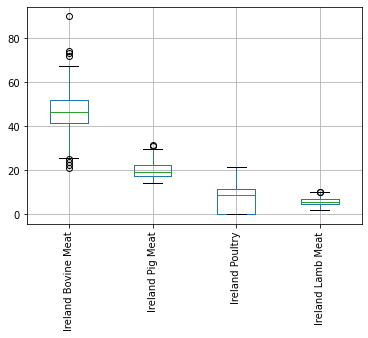

In [8]:
irelandData.boxplot(rot=90);

In [9]:
#https://plotly.com/python/box-plots/
fig = px.box(irelandData)
fig.show()

In [10]:
fig = px.box(irelandData, points='all')
fig.show()

## Ireland Slaughter Plot

In [11]:
fig = px.line(irelandData, labels={'value': 'Tonne in thousands',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Ireland', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

## Ireland Slaughter Growth Plot

In [12]:
irelandData.columns

Index(['Ireland Bovine Meat', 'Ireland Pig Meat', 'Ireland Poultry',
       'Ireland Lamb Meat'],
      dtype='object')

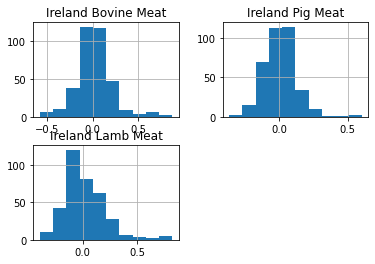

In [13]:
irelandData[['Ireland Bovine Meat', 'Ireland Pig Meat', 'Ireland Lamb Meat']].pct_change().hist();

In [14]:
fig = px.line(irelandData[['Ireland Bovine Meat', 'Ireland Pig Meat', 
                           'Ireland Lamb Meat']].pct_change(), 
              labels={'value': 'Tonne in thousands',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Ireland', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

In [15]:
fig = px.line(irelandData.pct_change().cumsum(),
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Growth Ireland', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

# Germany Slaughter Data

In [16]:
germanData = EUdata[EUdata['Country'] == 'Germany'].reset_index(drop=True)
germanData = germanData.pivot_table(index='Date', columns='Meat', values='Value')
germanData.reset_index(inplace=True)
germanData.set_index('Date',inplace=True)
germanData.columns = ['Germany Bovine Meat', 'Germany Pig Meat', 'Germany Poultry', 'Germany Lamb Meat']
germanData

,Germany Bovine Meat,Germany Pig Meat,Germany Poultry,Germany Lamb Meat
Date,,,,
1992-01-01,159,323,0,3
1992-02-01,140,285,0,3
1992-03-01,165,317,0,3
1992-04-01,156,297,0,4
1992-05-01,145,300,0,3
...,...,...,...,...
2021-11-01,104,421,137,2
2021-12-01,91,413,141,2
2022-01-01,77,384,129,2


## Germany NaN Count

In [17]:
germanData.isna().sum()

Germany Bovine Meat    0
Germany Pig Meat       0
Germany Poultry        0
Germany Lamb Meat      0
dtype: int64

## Germany Data Box Plot

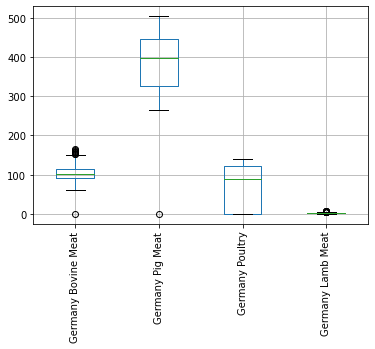

In [18]:
germanData.boxplot(rot=90);

In [19]:
#https://plotly.com/python/box-plots/
fig = px.box(germanData)
fig.show()

In [20]:
fig = px.box(germanData, points='all')
fig.show()

## Germany Slaughter Plot

In [21]:
fig = px.line(germanData, labels={'value': 'Tonne in thousands',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Germany', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

## Germany Slaughter Growth Plot

In [22]:
fig = px.line(germanData.pct_change().cumsum(),
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Growth Germany', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

# USA Slaughter Data

In [23]:
usaData = pd.read_excel('data/MeatStatsFullUSA.xlsx', sheet_name='SlaughterWeights-Full',
                   skiprows=2)
dates = usaData.iloc[:,0]

usaData = usaData.iloc[:, 13:]
usaData.insert(loc=0, column='Date', value=dates)
usaData.drop(usaData.head(2).index, inplace=True)
usaData.drop(usaData.tail(6).index, inplace=True)
usaData.Date = pd.to_datetime(usaData.Date, format='%b-%Y')
usaData = usaData[usaData.Date >= startDate].reset_index(drop=True)
usaData.index = usaData.Date
usaData.drop(columns='Date', inplace=True)

usaData['USA Bovine Meat'] = usaData['Cattle.2'] + usaData['Calves.2']
usaData['USA Pig Meat'] = usaData['Hogs.2']
usaData['USA Sheep Meat'] = usaData['Sheep and lambs.2']
usaData = usaData[['USA Bovine Meat', 'USA Pig Meat', 'USA Sheep Meat']]
usaData

,USA Bovine Meat,USA Pig Meat,USA Sheep Meat
Date,,,
2022-03-01,987,218,68
2022-02-01,981,218,67
2022-01-01,985,219,66
2021-12-01,977,218,64
2021-11-01,976,216,64
...,...,...,...
1992-05-01,934,183,65
1992-04-01,928,182,64
1992-03-01,927,181,66


In [24]:
#https://plotly.com/python/box-plots/
fig = px.box(usaData)
fig.show()

## Convert USA Data to Tonne

In [25]:
#usaData = (usaData * 1000) / 2204.6 
usaData = usaData / 0.453592
usaData

,USA Bovine Meat,USA Pig Meat,USA Sheep Meat
Date,,,
2022-03-01,2176,481,150
2022-02-01,2163,481,148
2022-01-01,2172,483,146
2021-12-01,2154,481,141
2021-11-01,2152,476,141
...,...,...,...
1992-05-01,2059,403,143
1992-04-01,2046,401,141
1992-03-01,2044,399,146


## USA Slaughter Plot

In [26]:
fig = px.line(usaData, labels={'value': 'Tonne in thousands',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings USA', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

## USA Slaughter Growth Plot

In [27]:
fig = px.line(usaData.pct_change().cumsum(),
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Growth USA', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

# Economic Data Import

## Population Data

### Ireland Population Data

In [28]:
irelandPop = pd.read_csv('data/POPTOTIEA647NWDB.csv', 
                         parse_dates=['DATE'])
irelandPop.columns = ['Date','Ireland Population']
irelandPop = irelandPop[irelandPop.Date >= startDate]

irelandPop = resampleMonthly(irelandPop, 'Date', 0, 'Date', 'linear')

### Germany Population Data

In [29]:
germanyPop = pd.read_csv('data/POPTOTDEA647NWDB.csv',
                    parse_dates=['DATE'])
germanyPop.columns = ['Date','German Population']
germanyPop = germanyPop[germanyPop.Date >= startDate]
germanyPop = resampleMonthly(germanyPop, 'Date', 0, 'Date', 'linear')
germanyPop

,German Population
Date,
1992-01-01,80624598
1992-02-01,80668912
1992-03-01,80713226
1992-04-01,80757539
1992-05-01,80801853
...,...
2019-09-01,83191337
2019-10-01,83203634
2019-11-01,83215931


### USA Population Data

In [30]:
usaPop = pd.read_csv('data/POPTOTUSA647NWDB.csv',
                    parse_dates=['DATE'])
usaPop.columns = ['Date','USA Population']
usaPop = usaPop[usaPop.Date >= startDate]
usaPop = resampleMonthly(usaPop, 'Date', 0, 'Date', 'linear')

## GDP

In [31]:
ecoData = pd.read_csv('data/worldBankData.csv', skiprows=4)
ecoData = ecoData[(ecoData['Indicator Name'] == 'GDP (constant LCU)') |
                 (ecoData['Indicator Name'] == 'GDP per capita (current LCU)')].reset_index(drop=True)
ecoData = ecoData.melt(id_vars=['Country Name', 'Indicator Name', 'Indicator Code', 'Country Code'],
                   var_name='Year', value_name='Total')
ecoData.Year = pd.to_datetime(ecoData.Year)
ecoData = ecoData[ecoData.Year >= startDate].reset_index(drop=True)
ecoData = ecoData[['Country Name', 'Indicator Name', 'Year', 'Total']]
ecoData

,Country Name,Indicator Name,Year,Total
0,Germany,GDP per capita (current LCU),1992-01-01,21111
1,Germany,GDP (constant LCU),1992-01-01,2261460000000
2,Ireland,GDP per capita (current LCU),1992-01-01,11728
3,Ireland,GDP (constant LCU),1992-01-01,76486482000
4,United States,GDP per capita (current LCU),1992-01-01,25419
...,...,...,...,...
175,Germany,GDP (constant LCU),2021-01-01,NaN
176,Ireland,GDP per capita (current LCU),2021-01-01,NaN
177,Ireland,GDP (constant LCU),2021-01-01,NaN
178,United States,GDP per capita (current LCU),2021-01-01,NaN


### Ireland GDP

In [32]:
irelandGDP = ecoData[ecoData['Country Name'] == 'Ireland']
irelandGDP = irelandGDP.pivot_table(index='Year', columns='Indicator Name', values='Total')
irelandGDP.columns = ['Ireland GDP', 'Ireland GDP Per Capita']
irelandGDP.reset_index(inplace=True)

irelandGDP = resampleMonthly(irelandGDP, 'Year', 0, 'Year', 'linear')
irelandGDP

,Ireland GDP,Ireland GDP Per Capita
Year,,
1992-01-01,76486482000,11728
1992-02-01,76658105500,11801
1992-03-01,76829729000,11874
1992-04-01,77001352500,11947
1992-05-01,77172976000,12020
...,...,...
2019-09-01,347254666667,73943
2019-10-01,348888500000,74155
2019-11-01,350522333333,74366


### Germany GDP

In [33]:
germanyGDP = ecoData[ecoData['Country Name'] == 'Germany']
germanyGDP = germanyGDP.pivot_table(index='Year', columns='Indicator Name', values='Total')
germanyGDP.columns = ['Germany GDP', 'Germany GDP Per Capita']
germanyGDP.reset_index(inplace=True)

germanyGDP = resampleMonthly(germanyGDP, 'Year', 0, 'Year', 'linear')
germanyGDP

,Germany GDP,Germany GDP Per Capita
Year,,
1992-01-01,2261460000000,21111
1992-02-01,2259619166667,21150
1992-03-01,2257778333333,21188
1992-04-01,2255937500000,21227
1992-05-01,2254096666667,21265
...,...,...
2019-09-01,3146116666667,40930
2019-10-01,3133760000000,40821
2019-11-01,3121403333333,40712


### USA GDP

In [34]:
usaGDP = ecoData[ecoData['Country Name'] == 'United States']
usaGDP = usaGDP.pivot_table(index='Year', columns='Indicator Name', values='Total')
usaGDP.columns = ['USA GDP', 'USA GDP Per Capita']
usaGDP.reset_index(inplace=True)

usaGDP = resampleMonthly(usaGDP, 'Year', 0, 'Year', 'linear')
usaGDP

,USA GDP,USA GDP Per Capita
Year,,
1992-01-01,10139200000000,25419
1992-02-01,10162450000000,25500
1992-03-01,10185700000000,25580
1992-04-01,10208950000000,25661
1992-05-01,10232200000000,25742
...,...,...
2019-09-01,19521166666667,63898
2019-10-01,19464500000000,63725
2019-11-01,19407833333333,63552


## Trade

In [35]:
trade = pd.read_csv('data/FAOSTAT_data_5-6-2022ImportsExports.csv')
trade = trade[['Area', 'Element', 'Item','Year','Unit', 'Value']]
trade = trade[(trade.Item == 'Meat, cattle') & (trade.Unit == 'tonnes')]

### Ireland Trade

In [36]:
irelandTrade = trade[trade.Area == 'Ireland']
irelandTrade = irelandTrade.pivot_table(index='Year', columns='Element', values='Value')
irelandTrade['Ireland Surplus'] = irelandTrade['Export Quantity'] - irelandTrade['Import Quantity']
irelandTrade.reset_index(inplace=True)
irelandTrade.Year = pd.to_datetime(irelandTrade.Year, format='%Y')
irelandTrade = resampleMonthly(irelandTrade, 'Year', 0, 'Year', 'linear')

### Germany Trade

In [37]:
germanyTrade = trade[trade.Area == 'Germany']
germanyTrade = germanyTrade.pivot_table(index='Year', columns='Element', values='Value')
germanyTrade['Germany Surplus'] = germanyTrade['Export Quantity'] - germanyTrade['Import Quantity']
germanyTrade = germanyTrade[['Germany Surplus']]
germanyTrade.reset_index(inplace=True)
germanyTrade.Year = pd.to_datetime(germanyTrade.Year, format='%Y')

germanyTrade = resampleMonthly(germanyTrade, 'Year', 0, 'Year', 'linear')

### USA Trade

In [38]:
usaTrade = trade[trade.Area == 'United States of America']
usaTrade = usaTrade.pivot_table(index='Year', columns='Element', values='Value')
usaTrade['USA Surplus'] = usaTrade['Export Quantity'] - usaTrade['Import Quantity']
usaTrade = usaTrade[['USA Surplus']]
usaTrade.reset_index(inplace=True)
usaTrade.Year = pd.to_datetime(usaTrade.Year, format='%Y')

usaTrade = resampleMonthly(usaTrade, 'Year', 0, 'Year', 'linear')

## Prices

In [39]:
prices = pd.read_csv('data/globalBeefPricesFred.csv')
prices.columns = ['Date','Price']
prices.Date = pd.to_datetime(prices.Date)
prices['Price'] = prices['Price'] / 0.453592
prices = resampleMonthly(prices, 'Date', 0, 'Date', 'linear')
prices

,Price
Date,
1990-01-01,258
1990-02-01,255
1990-03-01,252
1990-04-01,249
1990-05-01,254
...,...
2021-03-01,497
2021-04-01,523
2021-05-01,530


## Land Productivity

In [40]:
df = pd.read_csv('data/FAOSTAT_data_Land_Use_Per_Meat.csv')
df = df[['Area', 'Element', 'Year','Item', 'Unit','Value']]
df = df[df.Unit == 'hg/An']
df.Year = pd.to_datetime(df.Year, format='%Y')
df = df[df.Year >= startDate].reset_index(drop=True)
beefProduction = df[df.Item == 'Meat, cattle']
beefProduction

,Area,Element,Year,Item,Unit,Value
0,Germany,Yield/Carcass Weight,1992-01-01,"Meat, cattle",hg/An,2905
1,Germany,Yield/Carcass Weight,1993-01-01,"Meat, cattle",hg/An,2948
2,Germany,Yield/Carcass Weight,1994-01-01,"Meat, cattle",hg/An,2932
3,Germany,Yield/Carcass Weight,1995-01-01,"Meat, cattle",hg/An,2962
4,Germany,Yield/Carcass Weight,1996-01-01,"Meat, cattle",hg/An,2973
...,...,...,...,...,...,...
198,United States of America,Yield/Carcass Weight,2016-01-01,"Meat, cattle",hg/An,3678
199,United States of America,Yield/Carcass Weight,2017-01-01,"Meat, cattle",hg/An,3628
200,United States of America,Yield/Carcass Weight,2018-01-01,"Meat, cattle",hg/An,3626
201,United States of America,Yield/Carcass Weight,2019-01-01,"Meat, cattle",hg/An,3604


### Ireland Land Yield

In [41]:
irelandLand = beefProduction[beefProduction.Area == 'Ireland']
irelandLand = irelandLand[['Year', 'Value']].reset_index(drop=True)
irelandLand = resampleMonthly(irelandLand, 'Year', 0, 'Year', 'linear')
irelandLand.columns = ['Ireland Land Yield']

### Germany Land Yield

In [42]:
germanyLand = beefProduction[beefProduction.Area == 'Germany']
germanyLand = germanyLand[['Year', 'Value']].reset_index(drop=True)
germanyLand = resampleMonthly(germanyLand, 'Year', 0, 'Year', 'linear')
germanyLand.columns = ['Germany Land Yield']

### USA Land Yield

In [43]:
usaLand = beefProduction[beefProduction.Area == 'United States of America']
usaLand = usaLand[['Year', 'Value']].reset_index(drop=True)
usaLand = resampleMonthly(usaLand, 'Year', 0, 'Year', 'linear')
usaLand.columns = ['USA Land Yield']

# Merge Datasets

## Bovine Meat Production

In [44]:
allData = pd.concat([irelandData, usaData, germanData], axis=1)
allData.dropna(inplace=True)
allData

,Ireland Bovine Meat,Ireland Pig Meat,Ireland Poultry,Ireland Lamb Meat,USA Bovine Meat,USA Pig Meat,USA Sheep Meat,Germany Bovine Meat,Germany Pig Meat,Germany Poultry,Germany Lamb Meat
Date,,,,,,,,,,,
1992-01-01,35,18,0,6,2030,403,143,159,323,0,3
1992-02-01,32,15,0,5,2048,401,143,140,285,0,3
1992-03-01,47,16,0,5,2044,399,146,165,317,0,3
1992-04-01,40,16,0,6,2046,401,141,156,297,0,4
1992-05-01,34,16,0,8,2059,403,143,145,300,0,3
...,...,...,...,...,...,...,...,...,...,...,...
2021-11-01,56,31,13,6,2152,476,141,104,421,137,2
2021-12-01,46,27,21,6,2154,481,141,91,413,141,2
2022-01-01,47,28,13,5,2172,483,146,77,384,129,2


In [45]:
fig = px.line(allData,
             labels={'value': 'Tonne in thousands',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Growth Ireland USA & Germany', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

## All Data Growth Plot

In [46]:
fig = px.line(allData.pct_change().cumsum(),
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Growth Ireland, USA & Germany', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

## Population Data

In [47]:
allPopulationData = pd.concat([irelandPop, usaPop, germanyPop], axis=1)
allPopulationData

,Ireland Population,USA Population,German Population
Date,,,
1992-01-01,3558430,256514000,80624598
1992-02-01,3559916,256797750,80668912
1992-03-01,3561402,257081500,80713226
1992-04-01,3562888,257365250,80757539
1992-05-01,3564374,257649000,80801853
...,...,...,...
2019-09-01,4974596,329099400,83191337
2019-10-01,4979628,329195580,83203634
2019-11-01,4984660,329291761,83215931


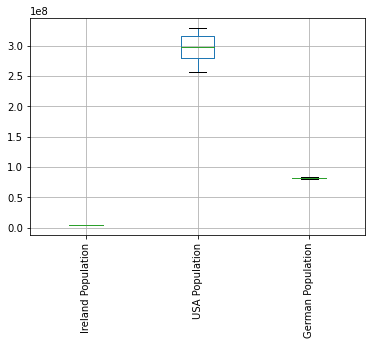

In [48]:
allPopulationData.boxplot(rot=90);

In [49]:
fig = px.line(allPopulationData[['Ireland Population', 'USA Population', 'German Population']].pct_change().cumsum(),
             labels={'value': 'Percentage Population Growth',
                    'Date':'Date'})
fig.update_layout(title_text='Population Percentage Growth Ireland, Germany & USA', 
                  title_x=0.5, legend_title='Population')
fig.show()

## Production Per Capita

In [50]:
bovineMeat = allData.copy()
bovineMeat.drop(bovineMeat.tail(len(allData) - len(irelandPop)).index, inplace=True)

bovineMeatData = pd.DataFrame()
bovineMeatData['Ireland Per Capita Bovine Meat Production'] = bovineMeat['Ireland Bovine Meat'].values / irelandPop['Ireland Population'].values * 1000000
bovineMeatData['USA Per Capita Bovine Meat Production'] = bovineMeat['USA Bovine Meat'].values / usaPop['USA Population'].values * 1000000
bovineMeatData['Germany Per Capita Bovine Meat Production'] = bovineMeat['Germany Bovine Meat'].values / germanyPop['German Population'].values * 1000000

In [51]:
fig = px.line(bovineMeatData.pct_change().cumsum(),
             labels={'value': 'Percentage Cattle Slaughter Growth',
                    'Date':'Date'})
fig.update_layout(title_text='Bovine Meat Percentage Growth Per Capita in Ireland, Germany & USA', 
                  title_x=0.5, legend_title='Per Capita Production')
fig.show()

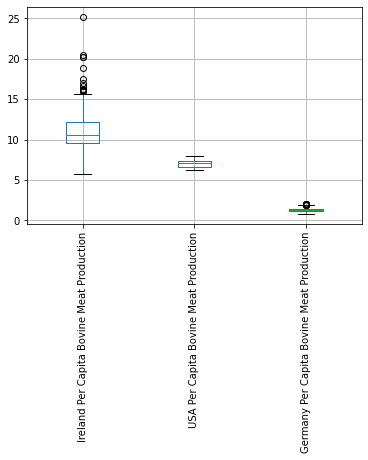

In [52]:
bovineMeatData.boxplot(rot=90);

## Trade

In [53]:
allTrade = pd.concat([irelandTrade, germanyTrade, usaTrade], axis=1)
allTrade

Element,Export Quantity,Import Quantity,Ireland Surplus,Germany Surplus,USA Surplus
Year,,,,,
1992-01-01,71485,6630,64855,359471,18592
1992-02-01,72090,6511,65579,351320,15481
1992-03-01,72695,6393,66302,343170,12370
1992-04-01,73300,6274,67026,335019,9259
1992-05-01,73905,6156,67750,326869,6148
...,...,...,...,...,...
2019-09-01,35891,6804,29087,15933,1815
2019-10-01,35511,6884,28627,15174,233
2019-11-01,35130,6963,28167,14414,-1348


In [54]:
fig = px.line(allTrade,
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})

fig.show()

In [55]:
fig = px.line(allTrade.pct_change().cumsum(),
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})

fig.show()

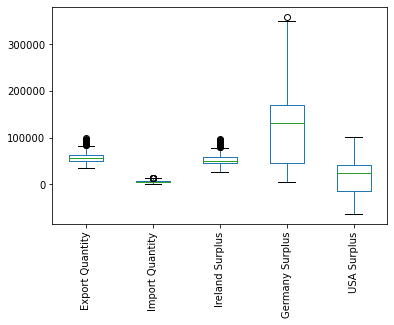

In [56]:
allTrade.plot(kind='box', rot=90);

## Land Productivity Per Meat Annual Data

In [57]:
beefProduction = pd.concat([irelandLand, germanyLand, usaLand], axis=1)

fig = px.line(beefProduction.pct_change().cumsum())

fig.show()

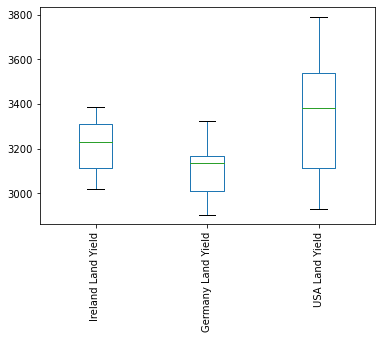

In [58]:
beefProduction.plot(kind='box', rot=90);

## For Machine Learning Model

### Ireland

In [59]:
irelandAllData = pd.concat([irelandGDP, irelandLand, irelandPop, 
                            irelandTrade, prices, irelandData], axis=1).dropna()
irelandAllData

,Ireland GDP,Ireland GDP Per Capita,Ireland Land Yield,Ireland Population,Export Quantity,Import Quantity,Ireland Surplus,Price,Ireland Bovine Meat,Ireland Pig Meat,Ireland Poultry,Ireland Lamb Meat
1992-01-01,76486482000,11728,3309,3558430,71485,6630,64855,252,35,18,0,6
1992-02-01,76658105500,11801,3308,3559916,72090,6511,65579,247,32,15,0,5
1992-03-01,76829729000,11874,3308,3561402,72695,6393,66302,242,47,16,0,5
1992-04-01,77001352500,11947,3308,3562888,73300,6274,67026,237,40,16,0,6
1992-05-01,77172976000,12020,3307,3564374,73905,6156,67750,238,34,16,0,8
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-09-01,347254666667,73943,3359,4974596,35891,6804,29087,504,33,24,13,5
2019-10-01,348888500000,74155,3361,4979628,35511,6884,28627,530,62,26,16,7
2019-11-01,350522333333,74366,3363,4984660,35130,6963,28167,503,60,26,14,6
2019-12-01,352156166667,74577,3364,4989692,34750,7043,27707,476,48,24,17,6


In [60]:
irelandAllData.describe()

,Ireland GDP,Ireland GDP Per Capita,Ireland Land Yield,Ireland Population,Export Quantity,Import Quantity,Ireland Surplus,Price,Ireland Bovine Meat,Ireland Pig Meat,Ireland Poultry,Ireland Lamb Meat
count,337,337,337,337,337,337,337,337,337,337,337,337
mean,183252997914,37539,3215,4230366,58341,6074,52268,294,46,20,6,6
std,71261498532,16454,112,464416,11742,2677,12831,102,9,3,6,2
min,76486482000,11728,3018,3558430,34370,97,27247,166,21,14,0,2
25%,130485000000,24713,3112,3754786,50600,4485,44733,202,41,17,0,5
50%,187426333333,37709,3230,4273591,56909,6093,50424,260,46,19,7,6
75%,202103000000,43652,3309,4623816,63288,7778,58111,400,52,22,11,7
max,353790000000,74788,3388,4994724,98538,13568,96894,564,90,30,21,10


In [61]:
#ProfileReport(irelandAllData)

### Germany

In [62]:
germanyAllData = pd.concat([germanyGDP, germanyLand, germanyPop, 
                            germanyTrade, prices, germanData], axis=1).dropna()
germanyAllData

,Germany GDP,Germany GDP Per Capita,Germany Land Yield,German Population,Germany Surplus,Price,Germany Bovine Meat,Germany Pig Meat,Germany Poultry,Germany Lamb Meat
1992-01-01,2261460000000,21111,2905,80624598,359471,252,159,323,0,3
1992-02-01,2259619166667,21150,2909,80668912,351320,247,140,285,0,3
1992-03-01,2257778333333,21188,2912,80713226,343170,242,165,317,0,3
1992-04-01,2255937500000,21227,2916,80757539,335019,237,156,297,0,4
1992-05-01,2254096666667,21265,2919,80801853,326869,238,145,300,0,3
...,...,...,...,...,...,...,...,...,...,...
2019-09-01,3146116666667,40930,3301,83191337,15933,504,93,440,130,2
2019-10-01,3133760000000,40821,3307,83203634,15174,530,103,468,137,2
2019-11-01,3121403333333,40712,3313,83215931,14414,503,111,460,132,2
2019-12-01,3109046666667,40603,3319,83228228,13655,476,89,414,128,2


In [63]:
germanyAllData.describe()

,Germany GDP,Germany GDP Per Capita,Germany Land Yield,German Population,Germany Surplus,Price,Germany Bovine Meat,Germany Pig Meat,Germany Poultry,Germany Lamb Meat
count,337,337,337,337,337,337,337,337,337,337
mean,2714755771513,30110,3097,81940129,122119,294,106,386,74,3
std,291356466367,6046,101,723564,73854,102,18,66,51,1
min,2239370000000,21111,2905,80274983,5268,166,60,265,0,1
25%,2483280000000,25085,3012,81526606,46622,202,93,324,0,2
50%,2691383333333,28953,3135,82075465,131788,260,103,383,85,3
75%,2917240000000,34861,3166,82453927,169629,400,116,446,121,4
max,3244970000000,41801,3325,83240525,359471,564,165,504,139,8


In [64]:
#ProfileReport(germanyAllData)

### USA

In [65]:
usaAllData = pd.concat([usaGDP, usaLand, usaPop, 
                            usaTrade, prices, usaData], axis=1).dropna()
usaAllData

,USA GDP,USA GDP Per Capita,USA Land Yield,USA Population,USA Surplus,Price,USA Bovine Meat,USA Pig Meat,USA Sheep Meat
1992-01-01,10139200000000,25419,3014,256514000,18592,252,2030,403,143
1992-02-01,10162450000000,25500,3014,256797750,15481,247,2048,401,143
1992-03-01,10185700000000,25580,3014,257081500,12370,242,2044,399,146
1992-04-01,10208950000000,25661,3014,257365250,9259,237,2046,401,141
1992-05-01,10232200000000,25742,3014,257649000,6148,238,2059,403,143
...,...,...,...,...,...,...,...,...,...
2019-09-01,19521166666667,63898,3671,329099400,1815,504,2083,463,139
2019-10-01,19464500000000,63725,3679,329195580,233,530,2094,467,141
2019-11-01,19407833333333,63552,3687,329291761,-1348,503,2121,474,141
2019-12-01,19351166666667,63379,3696,329387942,-2930,476,2112,474,139


In [66]:
usaAllData.describe()

,USA GDP,USA GDP Per Capita,USA Land Yield,USA Population,USA Surplus,Price,USA Bovine Meat,USA Pig Meat,USA Sheep Meat
count,337,337,337,337,337,337,337,337,337
mean,15289187685460,44425,3352,296997587,14705,294,2083,440,150
std,2784128131669,11526,245,21612764,36285,102,61,22,7
min,10139200000000,25419,2929,256514000,-64484,166,1967,397,130
25%,13193600000000,34514,3112,279040000,-14452,202,2044,421,143
50%,15946616666667,46299,3383,298379912,25189,260,2070,441,150
75%,17258200000000,53107,3539,316059947,41028,400,2112,459,154
max,19974500000000,65280,3791,329484123,102163,564,2275,476,174


In [67]:
#ProfileReport(usaAllData)

# Statistics

https://www.statology.org/python-guides/


In [68]:
import matplotlib.pyplot as plt
import statistics as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy import stats
import scipy as scipy

#Homogeinity of variance: Levene's test
from scipy.stats import levene

## QQ Plots

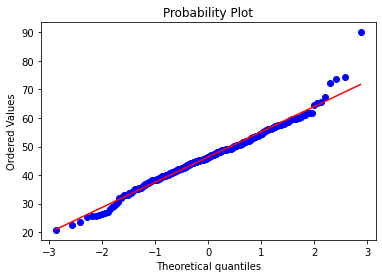

<Figure size 432x288 with 0 Axes>

In [69]:
#Normality plot. Our variable is "charges"
stats.probplot(irelandAllData['Ireland Bovine Meat'], plot=plt)
plt.figure();

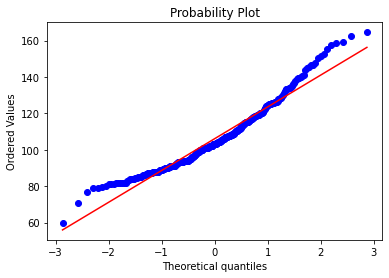

<Figure size 432x288 with 0 Axes>

In [70]:
#Normality plot. Our variable is "charges"
stats.probplot(germanyAllData['Germany Bovine Meat'], plot=plt)
plt.figure();

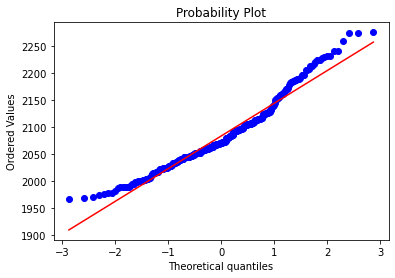

<Figure size 432x288 with 0 Axes>

In [71]:
#Normality plot. Our variable is "charges"
stats.probplot(usaAllData['USA Bovine Meat'], plot=plt)
plt.figure();

## Shapiro Wilk Test

In [72]:
#Shapiro wilk test
stats.shapiro(irelandAllData['Ireland Bovine Meat'])

ShapiroResult(statistic=0.980545699596405, pvalue=0.00015911944501567632)

In [73]:
# Normal Distribution Test
stat, p = stats.normaltest(irelandAllData['Ireland Bovine Meat'])
print('stat=%.3f, p=%3f\n' % (stat,p))

stat=21.897, p=0.000018



In [74]:
result = stats.anderson(irelandAllData['Ireland Bovine Meat'])
print('stat=%.3f' % result.statistic)
for i in range(len(result.critical_values)):
    sig_lev, crit_val = result.significance_level[i], result.critical_values[i]
    if result.statistic < crit_val:
        print('Proboably Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))
    else:
        print('Proboably not Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))

stat=0.912
Proboably not Guassian : 0.569 critical value at 15.0 level of signficance
Proboably not Guassian : 0.648 critical value at 10.0 level of signficance
Proboably not Guassian : 0.778 critical value at 5.0 level of signficance
Proboably not Guassian : 0.907 critical value at 2.5 level of signficance
Proboably Guassian : 1.079 critical value at 1.0 level of signficance


In [75]:
# Chi-Square Normaility Test
statistic, pvalue = stats.chisquare(irelandAllData['Ireland Bovine Meat'])
print('statistic=%.3f, p=%.3f\n' % (statistic, pvalue))

statistic=571.314, p=0.000



In [76]:
#Shapiro wilk test
stats.shapiro(germanyAllData['Germany Bovine Meat'])

ShapiroResult(statistic=0.9548953771591187, pvalue=1.1692160128973228e-08)

In [77]:
# Normal Distribution Test
stat, p = stats.normaltest(germanyAllData['Germany Bovine Meat'])
print('stat=%.3f, p=%3f\n' % (stat,p))

stat=33.696, p=0.000000



In [78]:
result = stats.anderson(germanyAllData['Germany Bovine Meat'])
print('stat=%.3f' % result.statistic)
for i in range(len(result.critical_values)):
    sig_lev, crit_val = result.significance_level[i], result.critical_values[i]
    if result.statistic < crit_val:
        print('Proboably Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))
    else:
        print('Proboably not Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))

stat=4.153
Proboably not Guassian : 0.569 critical value at 15.0 level of signficance
Proboably not Guassian : 0.648 critical value at 10.0 level of signficance
Proboably not Guassian : 0.778 critical value at 5.0 level of signficance
Proboably not Guassian : 0.907 critical value at 2.5 level of signficance
Proboably not Guassian : 1.079 critical value at 1.0 level of signficance


In [79]:
# Chi-Square Normaility Test
statistic, pvalue = stats.chisquare(germanyAllData['Germany Bovine Meat'])
print('statistic=%.3f, p=%.3f\n' % (statistic, pvalue))

statistic=1001.031, p=0.000



In [80]:
#Shapiro wilk test
stats.shapiro(usaAllData['USA Bovine Meat'])

ShapiroResult(statistic=0.9577063322067261, pvalue=2.770600460166861e-08)

In [81]:
# Normal Distribution Test
stat, p = stats.normaltest(usaAllData['USA Bovine Meat'])
print('stat=%.3f, p=%3f\n' % (stat,p))

stat=29.666, p=0.000000



In [82]:
result = stats.anderson(usaAllData['USA Bovine Meat'])
print('stat=%.3f' % result.statistic)
for i in range(len(result.critical_values)):
    sig_lev, crit_val = result.significance_level[i], result.critical_values[i]
    if result.statistic < crit_val:
        print('Proboably Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))
    else:
        print('Proboably not Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))

stat=4.217
Proboably not Guassian : 0.569 critical value at 15.0 level of signficance
Proboably not Guassian : 0.648 critical value at 10.0 level of signficance
Proboably not Guassian : 0.778 critical value at 5.0 level of signficance
Proboably not Guassian : 0.907 critical value at 2.5 level of signficance
Proboably not Guassian : 1.079 critical value at 1.0 level of signficance


In [83]:
# Chi-Square Normaility Test
statistic, pvalue = stats.chisquare(usaAllData['USA Bovine Meat'])
print('statistic=%.3f, p=%.3f\n' % (statistic, pvalue))

statistic=609.334, p=0.000



In [84]:
levene(irelandAllData['Ireland Bovine Meat'],
       germanyAllData['Germany Bovine Meat'],
       usaAllData['USA Bovine Meat'], 
       center = 'mean')

LeveneResult(statistic=302.22289896043605, pvalue=1.4845857018439324e-103)

In [85]:
#perform one-way ANOVA
stats.f_oneway(irelandAllData['Ireland Bovine Meat'],
       germanyAllData['Germany Bovine Meat'],
       usaAllData['USA Bovine Meat'])

F_onewayResult(statistic=325503.5807404495, pvalue=0.0)

In [86]:
#perform Mann-Kendall Trend Test
import pymannkendall as mk

mk.original_test(irelandAllData['Ireland Bovine Meat'])

Mann_Kendall_Test(trend='increasing', h=True, p=1.6705501758584873e-05, z=4.304908168911338, Tau=0.15716405256464602, s=8898.0, var_s=4271293.333333333, slope=0.02166666666666656, intercept=42.65000000000002)

In [87]:
mk.original_test(germanyAllData['Germany Bovine Meat'])

Mann_Kendall_Test(trend='decreasing', h=True, p=0.0, z=-13.826207982864648, Tau=-0.5047159813480289, s=-28575.0, var_s=4271062.333333333, slope=-0.12112033138666302, intercept=123.34821567295938)

In [88]:
mk.original_test(usaAllData['USA Bovine Meat'])

Mann_Kendall_Test(trend='increasing', h=True, p=0.0, z=9.015737816134482, Tau=0.3290765861240639, s=18631.0, var_s=4269953.666666667, slope=0.2738663876004681, intercept=2024.1327774356887)

## Mann-Whitney U test

In [89]:
#perform the Mann-Whitney U test
stats.mannwhitneyu(irelandAllData['Ireland Bovine Meat'], 
                   germanyAllData['Germany Bovine Meat'], 
                   alternative='two-sided')

MannwhitneyuResult(statistic=77.5, pvalue=1.7569631292776826e-111)

In [90]:
#perform the Mann-Whitney U test
stats.mannwhitneyu(irelandAllData['Ireland Bovine Meat'], 
                   usaAllData['USA Bovine Meat'], 
                   alternative='two-sided')

MannwhitneyuResult(statistic=0.0, pvalue=8.753468717400352e-112)

In [91]:
#perform the Mann-Whitney U test
stats.mannwhitneyu(germanyAllData['Germany Bovine Meat'], 
                   usaAllData['USA Bovine Meat'], 
                   alternative='two-sided')

MannwhitneyuResult(statistic=0.0, pvalue=8.740854439028161e-112)

## Regions Two Way Anova

In [92]:
cols = ['GDP', 'GDPPerCapita', 'LandYield', 'Population', 
        'Surplus', 'Price', 'PigMeat', 'LambMeat', 'BovineMeat']
region1 = irelandAllData[['Ireland GDP', 'Ireland GDP Per Capita', 'Ireland Land Yield',
       'Ireland Population', 'Ireland Surplus', 'Price', 'Ireland Pig Meat',
        'Ireland Lamb Meat', 'Ireland Bovine Meat']].reset_index(drop=True)
region1.columns = cols
region1['Region'] = 'Ireland'

region2 = germanyAllData[['Germany GDP', 'Germany GDP Per Capita', 'Germany Land Yield',
       'German Population', 'Germany Surplus', 'Price', 'Germany Bovine Meat',
       'Germany Pig Meat', 'Germany Lamb Meat']].reset_index(drop=True)
region2.columns = cols
region2['Region'] = 'Germany'

region3 = usaAllData[['USA GDP', 'USA GDP Per Capita', 'USA Land Yield', 'USA Population',
       'USA Surplus', 'Price', 'USA Bovine Meat', 'USA Pig Meat',
       'USA Sheep Meat']].reset_index(drop=True)
region3.columns = cols
region3['Region'] = 'USA'

regions = pd.concat([region1, region2, region3], axis=0)
regions.reset_index(inplace=True, drop=True)
regions

,GDP,GDPPerCapita,LandYield,Population,Surplus,Price,PigMeat,LambMeat,BovineMeat,Region
0,76486482000,11728,3309,3558430,64855,252,18,6,35,Ireland
1,76658105500,11801,3308,3559916,65579,247,15,5,32,Ireland
2,76829729000,11874,3308,3561402,66302,242,16,5,47,Ireland
3,77001352500,11947,3308,3562888,67026,237,16,6,40,Ireland
4,77172976000,12020,3307,3564374,67750,238,16,8,34,Ireland
...,...,...,...,...,...,...,...,...,...,...
1006,19521166666667,63898,3671,329099400,1815,504,2083,463,139,USA
1007,19464500000000,63725,3679,329195580,233,530,2094,467,141,USA
1008,19407833333333,63552,3687,329291761,-1348,503,2121,474,141,USA
1009,19351166666667,63379,3696,329387942,-2930,476,2112,474,139,USA


In [93]:
#ONE-WAY ANOVA
model = ols('BovineMeat~Region', data = regions).fit()
aov = sm.stats.anova_lm(model, type=2)
print(aov)

           df  sum_sq  mean_sq     F  PR(>F)
Region      2 3827525  1913762 42164       0
Residual 1008   45752       45   NaN     NaN


In [94]:
#ANOVA TWO WAYS
model2 = ols('BovineMeat~Region+LandYield', data = regions).fit()
aov2 = sm.stats.anova_lm(model2, type=2)
print(aov2)

            df  sum_sq  mean_sq     F  PR(>F)
Region       2 3827525  1913762 45721       0
LandYield    1    3601     3601    86       0
Residual  1007   42150       42   NaN     NaN


In [95]:
#ANOVA TWO WAYS
model3 = ols('BovineMeat~Region+Surplus', data = regions).fit()
aov3 = sm.stats.anova_lm(model3, type=2)
print(aov3)

           df  sum_sq  mean_sq     F  PR(>F)
Region      2 3827525  1913762 43642       0
Surplus     1    1593     1593    36       0
Residual 1007   44158       44   NaN     NaN


# Data PreProcessing

In [118]:
class dataProcessing():
    def __init__(self, data, target, rollingDays):
        self.data = data
        self.target = target
        self.targetData = None
        self.rollingDays = rollingDays
        
    def targetIntoLast(self):
        # Put target into last column
        self.targetData = self.data[self.target]
        self.data.drop(columns=[self.target], inplace=True)
        self.data[self.target] = self.targetData
        return self.data

    def movingAverage(self):
        if 'MovingAverage' not in self.data.columns:
            # Add moving Average if not in dataset
            self.data.insert(loc=self.data.shape[1] - 2, column='MovingAverage',
                            value=self.data[self.target].rolling(self.rollingDays).mean())
            #self.data.fillna(method='bfill', inplace=True)
        else:
            # Change moving average
            self.data['MovingAverage'] = self.data[self.target].rolling(self.rollingDays).mean()
            #self.data.fillna(method='bfill', inplace=True)
        return self.data
    
    def highLow(self):
        if 'High' not in self.data.columns and 'Low' not in self.data.columns:
            # Add High and Low if not in dataset
            self.data.insert(loc=self.data.shape[1] - 2, column='High',
                            value=self.data[self.target].rolling(self.rollingDays).max())
            
            self.data.insert(loc=self.data.shape[1] - 2, column='Low',
                            value=self.data[self.target].rolling(self.rollingDays).min())
            #self.data.fillna(method='bfill', inplace=True)
        else:
            # Change High and Low 
            self.data['High'] = self.data[self.target].rolling(self.rollingDays).max()
            
            self.data['Low'] = self.data[self.target].rolling(self.rollingDays).min()
            
            #self.data.fillna(method='bfill', inplace=True)
        return self.data
        
        
    def addMonth(self):
        # Add month
        if 'Month' not in self.data.columns:
            self.data.insert(loc=0, column='Month', value=self.data.index.month)
            self.data.Month = self.data.Month.astype(str)
        return self.data

In [119]:
data = dataProcessing(irelandAllData.copy(), 'Ireland Bovine Meat', 12)
data.targetIntoLast()
data.addMonth()
data.highLow()
data.movingAverage()
data.data

,Month,Ireland GDP,Ireland GDP Per Capita,Ireland Land Yield,Ireland Population,Export Quantity,Import Quantity,Ireland Surplus,Price,Ireland Pig Meat,Ireland Poultry,High,Low,MovingAverage,Ireland Lamb Meat,Ireland Bovine Meat
1992-01-01,1,76486482000,11728,3309,3558430,71485,6630,64855,252,18,0,NaN,NaN,NaN,6,35
1992-02-01,2,76658105500,11801,3308,3559916,72090,6511,65579,247,15,0,NaN,NaN,NaN,5,32
1992-03-01,3,76829729000,11874,3308,3561402,72695,6393,66302,242,16,0,NaN,NaN,NaN,5,47
1992-04-01,4,77001352500,11947,3308,3562888,73300,6274,67026,237,16,0,NaN,NaN,NaN,6,40
1992-05-01,5,77172976000,12020,3307,3564374,73905,6156,67750,238,16,0,NaN,NaN,NaN,8,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-09-01,9,347254666667,73943,3359,4974596,35891,6804,29087,504,24,13,61,33,51,5,33
2019-10-01,10,348888500000,74155,3361,4979628,35511,6884,28627,530,26,16,62,33,51,7,62
2019-11-01,11,350522333333,74366,3363,4984660,35130,6963,28167,503,26,14,62,33,51,6,60
2019-12-01,12,352156166667,74577,3364,4989692,34750,7043,27707,476,24,17,62,33,52,6,48


# Machine Learning Models

## Import Regression Models

In [98]:
from catboost import CatBoostRegressor, Pool
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR

## Import Classification Models

In [99]:
from sklearn. neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

## SKLearn Libraries

In [100]:
from sklearn.model_selection import train_test_split

from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline

from sklearn.model_selection import GridSearchCV

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [152]:
regressors = {'Ridge': Ridge, 'Lasso': Lasso, 
              'RandomForestRegressor': RandomForestRegressor,
              'XGBRegressor': XGBRegressor, 
              'KNeighborsRegressor': KNeighborsRegressor, 
              'PolynomialFeatures': PolynomialFeatures}

parameters = {'Ridge': {'gridParams': 
                    {'ridge__normalize': [True, False],
                    'ridge__alpha' : [10.0, 1.0, 0.1, 0.001, 0.0001]}},
             'Lasso': {'gridParams': 
                    {'lasso__normalize': [True, False],
                    'lasso__alpha' : [10.0, 1.0, 0.1, 0.001, 0.0001]}},
             'RandomForestRegressor':{'gridParams': 
                    {'randomforestregressor__n_estimators': [100, 200, 300, 500],
                    'randomforestregressor__max_depth': [10, 50, 70, 100],
                    'randomforestregressor__bootstrap': [True, False]}},
             'KNeighborsRegressor': {'gridParams': 
                    {'kneighborsregressor__n_neighbors': [2, 3, 4, 5, 6, 7, 10, 15, 20, 30,100],
                    'kneighborsregressor__p': [1, 2]}},
             'XGBRegressor': {'gridParams': 
                    {'xgbregressor__max_depth': [2, 4, 6],
                    'xgbregressor__n_estimators': [50, 100, 200, 400, 500, 1000],
                    'xgbregressor__gamma': [0.01, 0.1, 1.0],
                    'xgbregressor__learning_rate': [0.001, 0.01, 0.1]}}, 
             'PolynomialFeatures': {'gridParams': 
                    {'polynomialfeatures__degree': [1, 2, 3]}}}

In [120]:
X, y = data.data.iloc[:, :-1], data.data.iloc[:, -1]

In [121]:
#X.drop(X.tail(1).index, inplace=True)
#y = y.iloc[1:]


In [142]:

# get the categorical and numeric column names
num_cols = X.select_dtypes(exclude=['object']).columns.tolist()
cat_cols = X.select_dtypes(include=['object']).columns.tolist()

# pipeline for numerical columns
num_pipe = make_pipeline(KNNImputer(n_neighbors=4), StandardScaler())

# pipeline for categorical columns
cat_pipe = make_pipeline(OneHotEncoder(handle_unknown='ignore', sparse=False))

# combine both the pipelines
full_pipe = ColumnTransformer([('cat', cat_pipe, cat_cols),
                             ('num', num_pipe, num_cols)])

## Regression Models

In [159]:
regressionScores = []
regressionModels = []

# https://lifewithdata.com/2022/03/09/onehotencoder-how-to-do-one-hot-encoding-in-sklearn/
num_pipe = make_pipeline(KNNImputer(n_neighbors=4), StandardScaler())

for j, k in regressors.items():
    if j != 'PolynomialFeatures':
        pipe = make_pipeline(ColumnTransformer([('cat', 
                    OneHotEncoder(handle_unknown='ignore'), cat_cols),
                    ('num', num_pipe, num_cols)]), KMeans(n_clusters=4),
                             k())
        
        grid = GridSearchCV(pipe, param_grid=parameters[j]['gridParams'], cv=5)
        grid.fit(X, y)
        regressionModels.append(j)
        regressionScores.append(grid.score(X,y))
        
    elif j == 'PolynomialFeatures':
        if 'ridge__alpha' in parameters[j]['gridParams']:
            pipe = make_pipeline(ColumnTransformer([('cat', 
                    OneHotEncoder(handle_unknown='ignore'), cat_cols),
                    ('num', num_pipe, num_cols)]), KMeans(n_clusters=4), k(), Ridge())
            params = parameters[j]['gridParams']
            params['ridge__normalize'] = [True, False]
            params['ridge__alpha']= [10.0, 1.0, 0.1, 0.001, 0.0001]
            grid = GridSearchCV(pipe, param_grid=params, cv=5)
            grid.fit(X, y)
            regressionModels.append(j + ' Ridge')
            regressionScores.append(grid.score(X,y))
            
        elif 'lasso__alpha' in parameters[j]['gridParams']:
            pipe = make_pipeline(ColumnTransformer([('cat', 
                    OneHotEncoder(handle_unknown='ignore'), cat_cols),
                    ('num', num_pipe, num_cols)]), KMeans(n_clusters=4), k(), Lasso())
            params = parameters[j]['gridParams']
            params['lasso__normalize'] = [True, False]
            params['lasso__alpha']= [10.0, 1.0, 0.1, 0.001, 0.0001]
            grid = GridSearchCV(pipe, param_grid=params, cv=5)
            grid.fit(X, y)
            regressionModels.append(j + ' Lasso')
            regressionScores.append(grid.score(X,y))

In [160]:
regressionScores

[0.017635802135467782,
 0.0,
 0.882048545677865,
 0.344319681513904,
 0.2860060396328702]

In [161]:
regressionModels

['Ridge',
 'Lasso',
 'RandomForestRegressor',
 'XGBRegressor',
 'KNeighborsRegressor']

In [111]:
#XTransformed = pd.get_dummies(X)
#XTransformed.iloc[:,:X.shape[1]-1] = StandardScaler().fit_transform(XTransformed.iloc[:,:X.shape[1]-1])

enc =OneHotEncoder()
encoded = pd.DataFrame(data=enc.fit_transform(X[['Month']]).toarray(), columns=enc.categories_)
scaled = pd.DataFrame(data=StandardScaler().fit_transform(X.drop(columns="Month")), 
                                                columns=X.drop(columns='Month').columns)
XTransformed = pd.concat([scaled, encoded], axis=1)

paramGrid = {'depth': [4, 6, 10],
            'learning_rate': [0.03, 0.1, 1]}

model = CatBoostRegressor()

randomized_search_result = model.randomized_search(paramGrid,
                                                   X=XTransformed,
                                                   y=y, cv=5,
                                                   shuffle=False,
                                                   plot=True)
regressionModels.append('CatBoostRegressor Using Randomized Model Search')
RegressionScores.append(model.score(XTransformed, y))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 45.0951055	test: 49.0490960	best: 49.0490960 (0)	total: 28.9ms	remaining: 28.9s
1:	learn: 43.8917515	test: 47.7566033	best: 47.7566033 (1)	total: 29.8ms	remaining: 14.9s
2:	learn: 42.7075095	test: 47.4204399	best: 47.4204399 (2)	total: 30.6ms	remaining: 10.2s
3:	learn: 41.5630797	test: 46.2909991	best: 46.2909991 (3)	total: 31.4ms	remaining: 7.82s
4:	learn: 40.4332159	test: 45.2190917	best: 45.2190917 (4)	total: 32.1ms	remaining: 6.39s
5:	learn: 39.3674031	test: 44.2713100	best: 44.2713100 (5)	total: 32.9ms	remaining: 5.45s
6:	learn: 38.2741202	test: 43.1431269	best: 43.1431269 (6)	total: 33.3ms	remaining: 4.72s
7:	learn: 37.2823778	test: 42.3388237	best: 42.3388237 (7)	total: 34ms	remaining: 4.21s
8:	learn: 36.3167606	test: 41.4323700	best: 41.4323700 (8)	total: 35.1ms	remaining: 3.86s
9:	learn: 35.3677789	test: 40.4357058	best: 40.4357058 (9)	total: 35.8ms	remaining: 3.54s
10:	learn: 34.5052148	test: 39.5679887	best: 39.5679887 (10)	total: 36.5ms	remaining: 3.29s
11:	learn:

190:	learn: 5.5073823	test: 11.6656881	best: 11.6243049 (187)	total: 192ms	remaining: 814ms
191:	learn: 5.4928976	test: 11.6595639	best: 11.6243049 (187)	total: 193ms	remaining: 813ms
192:	learn: 5.4768306	test: 11.6471070	best: 11.6243049 (187)	total: 195ms	remaining: 813ms
193:	learn: 5.4556817	test: 11.6393818	best: 11.6243049 (187)	total: 195ms	remaining: 812ms
194:	learn: 5.4417964	test: 11.6262475	best: 11.6243049 (187)	total: 196ms	remaining: 811ms
195:	learn: 5.4267038	test: 11.6126875	best: 11.6126875 (195)	total: 197ms	remaining: 810ms
196:	learn: 5.4110040	test: 11.6051723	best: 11.6051723 (196)	total: 198ms	remaining: 808ms
197:	learn: 5.3953977	test: 11.5890926	best: 11.5890926 (197)	total: 199ms	remaining: 807ms
198:	learn: 5.3762760	test: 11.5829345	best: 11.5829345 (198)	total: 200ms	remaining: 805ms
199:	learn: 5.3606059	test: 11.6270044	best: 11.5829345 (198)	total: 201ms	remaining: 803ms
200:	learn: 5.3505630	test: 11.6063351	best: 11.5829345 (198)	total: 202ms	remai

403:	learn: 3.5390340	test: 10.3150346	best: 10.2237853 (358)	total: 359ms	remaining: 529ms
404:	learn: 3.5338415	test: 10.3295621	best: 10.2237853 (358)	total: 360ms	remaining: 528ms
405:	learn: 3.5243018	test: 10.3338900	best: 10.2237853 (358)	total: 360ms	remaining: 527ms
406:	learn: 3.5194403	test: 10.3247188	best: 10.2237853 (358)	total: 361ms	remaining: 526ms
407:	learn: 3.5070704	test: 10.3269031	best: 10.2237853 (358)	total: 362ms	remaining: 525ms
408:	learn: 3.5019223	test: 10.3138997	best: 10.2237853 (358)	total: 362ms	remaining: 524ms
409:	learn: 3.4955591	test: 10.3141508	best: 10.2237853 (358)	total: 363ms	remaining: 522ms
410:	learn: 3.4874861	test: 10.3026506	best: 10.2237853 (358)	total: 364ms	remaining: 521ms
411:	learn: 3.4809851	test: 10.3037054	best: 10.2237853 (358)	total: 365ms	remaining: 521ms
412:	learn: 3.4740602	test: 10.3045058	best: 10.2237853 (358)	total: 366ms	remaining: 520ms
413:	learn: 3.4670920	test: 10.3019199	best: 10.2237853 (358)	total: 366ms	remai

614:	learn: 2.6020627	test: 9.9461919	best: 9.9461919 (614)	total: 527ms	remaining: 330ms
615:	learn: 2.5989209	test: 9.9479951	best: 9.9461919 (614)	total: 528ms	remaining: 329ms
616:	learn: 2.5953926	test: 9.9378714	best: 9.9378714 (616)	total: 529ms	remaining: 328ms
617:	learn: 2.5921385	test: 9.9398038	best: 9.9378714 (616)	total: 530ms	remaining: 327ms
618:	learn: 2.5890589	test: 9.9304092	best: 9.9304092 (618)	total: 530ms	remaining: 326ms
619:	learn: 2.5863099	test: 9.9304930	best: 9.9304092 (618)	total: 531ms	remaining: 325ms
620:	learn: 2.5815306	test: 9.9298352	best: 9.9298352 (620)	total: 532ms	remaining: 325ms
621:	learn: 2.5778023	test: 9.9292614	best: 9.9292614 (621)	total: 532ms	remaining: 324ms
622:	learn: 2.5761052	test: 9.9199628	best: 9.9199628 (622)	total: 533ms	remaining: 323ms
623:	learn: 2.5720300	test: 9.9210856	best: 9.9199628 (622)	total: 534ms	remaining: 322ms
624:	learn: 2.5685779	test: 9.9342558	best: 9.9199628 (622)	total: 534ms	remaining: 321ms
625:	learn

812:	learn: 2.0692283	test: 9.5319677	best: 9.5307477 (811)	total: 696ms	remaining: 160ms
813:	learn: 2.0669308	test: 9.5424877	best: 9.5307477 (811)	total: 697ms	remaining: 159ms
814:	learn: 2.0644037	test: 9.5408036	best: 9.5307477 (811)	total: 698ms	remaining: 158ms
815:	learn: 2.0602788	test: 9.5301828	best: 9.5301828 (815)	total: 699ms	remaining: 158ms
816:	learn: 2.0565432	test: 9.5122966	best: 9.5122966 (816)	total: 700ms	remaining: 157ms
817:	learn: 2.0542259	test: 9.5161042	best: 9.5122966 (816)	total: 701ms	remaining: 156ms
818:	learn: 2.0511988	test: 9.5100174	best: 9.5100174 (818)	total: 702ms	remaining: 155ms
819:	learn: 2.0495556	test: 9.5099136	best: 9.5099136 (819)	total: 702ms	remaining: 154ms
820:	learn: 2.0476871	test: 9.5069741	best: 9.5069741 (820)	total: 703ms	remaining: 153ms
821:	learn: 2.0470764	test: 9.5018585	best: 9.5018585 (821)	total: 704ms	remaining: 152ms
822:	learn: 2.0440631	test: 9.4960707	best: 9.4960707 (822)	total: 705ms	remaining: 152ms
823:	learn

0:	learn: 42.1088567	test: 45.9795053	best: 45.9795053 (0)	total: 30.8ms	remaining: 30.8s
1:	learn: 38.3908813	test: 41.9662633	best: 41.9662633 (1)	total: 32.7ms	remaining: 16.3s
2:	learn: 34.9941523	test: 41.0276040	best: 41.0276040 (2)	total: 33.5ms	remaining: 11.1s
3:	learn: 31.9403355	test: 37.9583171	best: 37.9583171 (3)	total: 34.3ms	remaining: 8.54s
4:	learn: 29.1451072	test: 35.3221301	best: 35.3221301 (4)	total: 35.2ms	remaining: 7s
5:	learn: 26.7010140	test: 33.1332352	best: 33.1332352 (5)	total: 36ms	remaining: 5.96s
6:	learn: 24.3930467	test: 30.6807121	best: 30.6807121 (6)	total: 36.4ms	remaining: 5.16s
7:	learn: 22.4690912	test: 29.0845226	best: 29.0845226 (7)	total: 37.1ms	remaining: 4.6s
8:	learn: 20.7429218	test: 27.3388436	best: 27.3388436 (8)	total: 37.8ms	remaining: 4.17s
9:	learn: 19.1728965	test: 25.5965955	best: 25.5965955 (9)	total: 38.6ms	remaining: 3.82s
10:	learn: 17.8431830	test: 24.0965434	best: 24.0965434 (10)	total: 39.3ms	remaining: 3.53s
11:	learn: 16.

194:	learn: 2.4470689	test: 8.3965116	best: 8.3817674 (191)	total: 194ms	remaining: 802ms
195:	learn: 2.4331681	test: 8.4114663	best: 8.3817674 (191)	total: 195ms	remaining: 802ms
196:	learn: 2.4236369	test: 8.4087567	best: 8.3817674 (191)	total: 196ms	remaining: 800ms
197:	learn: 2.4143526	test: 8.4131701	best: 8.3817674 (191)	total: 197ms	remaining: 798ms
198:	learn: 2.4084491	test: 8.4204629	best: 8.3817674 (191)	total: 198ms	remaining: 796ms
199:	learn: 2.3921319	test: 8.5050615	best: 8.3817674 (191)	total: 199ms	remaining: 794ms
200:	learn: 2.3856214	test: 8.5212100	best: 8.3817674 (191)	total: 200ms	remaining: 794ms
201:	learn: 2.3774394	test: 8.5232761	best: 8.3817674 (191)	total: 201ms	remaining: 792ms
202:	learn: 2.3731065	test: 8.5184431	best: 8.3817674 (191)	total: 201ms	remaining: 790ms
203:	learn: 2.3577844	test: 8.4794818	best: 8.3817674 (191)	total: 202ms	remaining: 788ms
204:	learn: 2.3545578	test: 8.4791518	best: 8.3817674 (191)	total: 202ms	remaining: 785ms
205:	learn

411:	learn: 1.0819058	test: 8.1368734	best: 8.1308963 (409)	total: 364ms	remaining: 519ms
412:	learn: 1.0788088	test: 8.1398905	best: 8.1308963 (409)	total: 365ms	remaining: 519ms
413:	learn: 1.0744812	test: 8.1394673	best: 8.1308963 (409)	total: 366ms	remaining: 518ms
414:	learn: 1.0698932	test: 8.1325181	best: 8.1308963 (409)	total: 367ms	remaining: 517ms
415:	learn: 1.0688702	test: 8.1306738	best: 8.1306738 (415)	total: 367ms	remaining: 516ms
416:	learn: 1.0639081	test: 8.1358041	best: 8.1306738 (415)	total: 368ms	remaining: 515ms
417:	learn: 1.0582347	test: 8.1249948	best: 8.1249948 (417)	total: 369ms	remaining: 513ms
418:	learn: 1.0553861	test: 8.1243480	best: 8.1243480 (418)	total: 370ms	remaining: 512ms
419:	learn: 1.0525930	test: 8.1330059	best: 8.1243480 (418)	total: 370ms	remaining: 512ms
420:	learn: 1.0486981	test: 8.1322312	best: 8.1243480 (418)	total: 371ms	remaining: 510ms
421:	learn: 1.0419227	test: 8.1369583	best: 8.1243480 (418)	total: 372ms	remaining: 509ms
422:	learn

616:	learn: 0.5822530	test: 7.9171385	best: 7.9144362 (613)	total: 547ms	remaining: 339ms
617:	learn: 0.5802462	test: 7.8969483	best: 7.8969483 (617)	total: 548ms	remaining: 339ms
618:	learn: 0.5778617	test: 7.8930256	best: 7.8930256 (618)	total: 549ms	remaining: 338ms
619:	learn: 0.5751117	test: 7.8977374	best: 7.8930256 (618)	total: 550ms	remaining: 337ms
620:	learn: 0.5734986	test: 7.8960722	best: 7.8930256 (618)	total: 550ms	remaining: 336ms
621:	learn: 0.5725035	test: 7.8968186	best: 7.8930256 (618)	total: 551ms	remaining: 335ms
622:	learn: 0.5719024	test: 7.8988838	best: 7.8930256 (618)	total: 552ms	remaining: 334ms
623:	learn: 0.5693410	test: 7.9000982	best: 7.8930256 (618)	total: 553ms	remaining: 333ms
624:	learn: 0.5671826	test: 7.9154147	best: 7.8930256 (618)	total: 554ms	remaining: 332ms
625:	learn: 0.5651444	test: 7.9173886	best: 7.8930256 (618)	total: 554ms	remaining: 331ms
626:	learn: 0.5627728	test: 7.9217044	best: 7.8930256 (618)	total: 555ms	remaining: 330ms
627:	learn

811:	learn: 0.3457827	test: 7.9163122	best: 7.8847259 (652)	total: 707ms	remaining: 164ms
812:	learn: 0.3449011	test: 7.9157685	best: 7.8847259 (652)	total: 707ms	remaining: 163ms
813:	learn: 0.3439186	test: 7.9145519	best: 7.8847259 (652)	total: 708ms	remaining: 162ms
814:	learn: 0.3429364	test: 7.9137750	best: 7.8847259 (652)	total: 709ms	remaining: 161ms
815:	learn: 0.3428037	test: 7.9137946	best: 7.8847259 (652)	total: 710ms	remaining: 160ms
816:	learn: 0.3417070	test: 7.9129923	best: 7.8847259 (652)	total: 711ms	remaining: 159ms
817:	learn: 0.3405795	test: 7.9139053	best: 7.8847259 (652)	total: 711ms	remaining: 158ms
818:	learn: 0.3395281	test: 7.9144769	best: 7.8847259 (652)	total: 712ms	remaining: 157ms
819:	learn: 0.3378876	test: 7.9208843	best: 7.8847259 (652)	total: 714ms	remaining: 157ms
820:	learn: 0.3371256	test: 7.9194285	best: 7.8847259 (652)	total: 715ms	remaining: 156ms
821:	learn: 0.3368023	test: 7.9228174	best: 7.8847259 (652)	total: 716ms	remaining: 155ms
822:	learn

997:	learn: 0.2183994	test: 7.9374974	best: 7.8847259 (652)	total: 877ms	remaining: 1.76ms
998:	learn: 0.2182403	test: 7.9383020	best: 7.8847259 (652)	total: 879ms	remaining: 879us
999:	learn: 0.2175949	test: 7.9381815	best: 7.8847259 (652)	total: 879ms	remaining: 0us

bestTest = 7.884725916
bestIteration = 652

1:	loss: 7.8847259	best: 7.8847259 (1)	total: 1.94s	remaining: 6.78s
0:	learn: 9.6859223	test: 7.7839307	best: 7.7839307 (0)	total: 5.33ms	remaining: 5.33s
1:	learn: 7.9482256	test: 4.7581883	best: 4.7581883 (1)	total: 6.17ms	remaining: 3.08s
2:	learn: 7.2353364	test: 4.2011192	best: 4.2011192 (2)	total: 7.06ms	remaining: 2.35s
3:	learn: 6.7202503	test: 3.8221712	best: 3.8221712 (3)	total: 7.73ms	remaining: 1.92s
4:	learn: 6.0781564	test: 4.5729804	best: 3.8221712 (3)	total: 8.53ms	remaining: 1.7s
5:	learn: 5.7488559	test: 4.9030616	best: 3.8221712 (3)	total: 9.25ms	remaining: 1.53s
6:	learn: 5.4253783	test: 4.6281720	best: 3.8221712 (3)	total: 10.1ms	remaining: 1.44s
7:	learn:

200:	learn: 0.0228098	test: 5.8530041	best: 3.8221712 (3)	total: 180ms	remaining: 715ms
201:	learn: 0.0223507	test: 5.8519519	best: 3.8221712 (3)	total: 181ms	remaining: 714ms
202:	learn: 0.0215618	test: 5.8531840	best: 3.8221712 (3)	total: 182ms	remaining: 714ms
203:	learn: 0.0211617	test: 5.8536132	best: 3.8221712 (3)	total: 183ms	remaining: 712ms
204:	learn: 0.0198623	test: 5.8541632	best: 3.8221712 (3)	total: 183ms	remaining: 711ms
205:	learn: 0.0194708	test: 5.8542236	best: 3.8221712 (3)	total: 184ms	remaining: 710ms
206:	learn: 0.0190520	test: 5.8540405	best: 3.8221712 (3)	total: 185ms	remaining: 709ms
207:	learn: 0.0189840	test: 5.8538693	best: 3.8221712 (3)	total: 186ms	remaining: 708ms
208:	learn: 0.0188431	test: 5.8533014	best: 3.8221712 (3)	total: 187ms	remaining: 706ms
209:	learn: 0.0183526	test: 5.8532557	best: 3.8221712 (3)	total: 188ms	remaining: 705ms
210:	learn: 0.0180389	test: 5.8539281	best: 3.8221712 (3)	total: 188ms	remaining: 704ms
211:	learn: 0.0176811	test: 5.85

416:	learn: 0.0001404	test: 5.8554696	best: 3.8221712 (3)	total: 331ms	remaining: 463ms
417:	learn: 0.0001356	test: 5.8554705	best: 3.8221712 (3)	total: 332ms	remaining: 463ms
418:	learn: 0.0001312	test: 5.8554622	best: 3.8221712 (3)	total: 333ms	remaining: 462ms
419:	learn: 0.0001262	test: 5.8554616	best: 3.8221712 (3)	total: 334ms	remaining: 461ms
420:	learn: 0.0001251	test: 5.8554605	best: 3.8221712 (3)	total: 334ms	remaining: 460ms
421:	learn: 0.0001243	test: 5.8554607	best: 3.8221712 (3)	total: 335ms	remaining: 459ms
422:	learn: 0.0001238	test: 5.8554618	best: 3.8221712 (3)	total: 336ms	remaining: 458ms
423:	learn: 0.0001210	test: 5.8554760	best: 3.8221712 (3)	total: 336ms	remaining: 457ms
424:	learn: 0.0001169	test: 5.8554776	best: 3.8221712 (3)	total: 337ms	remaining: 456ms
425:	learn: 0.0001164	test: 5.8554760	best: 3.8221712 (3)	total: 338ms	remaining: 455ms
426:	learn: 0.0001159	test: 5.8554814	best: 3.8221712 (3)	total: 338ms	remaining: 454ms
427:	learn: 0.0001141	test: 5.85

654:	learn: 0.0000009	test: 5.8554731	best: 3.8221712 (3)	total: 499ms	remaining: 263ms
655:	learn: 0.0000009	test: 5.8554731	best: 3.8221712 (3)	total: 500ms	remaining: 262ms
656:	learn: 0.0000009	test: 5.8554731	best: 3.8221712 (3)	total: 501ms	remaining: 261ms
657:	learn: 0.0000008	test: 5.8554731	best: 3.8221712 (3)	total: 502ms	remaining: 261ms
658:	learn: 0.0000008	test: 5.8554731	best: 3.8221712 (3)	total: 502ms	remaining: 260ms
659:	learn: 0.0000008	test: 5.8554731	best: 3.8221712 (3)	total: 503ms	remaining: 259ms
660:	learn: 0.0000008	test: 5.8554731	best: 3.8221712 (3)	total: 504ms	remaining: 258ms
661:	learn: 0.0000008	test: 5.8554731	best: 3.8221712 (3)	total: 504ms	remaining: 258ms
662:	learn: 0.0000008	test: 5.8554731	best: 3.8221712 (3)	total: 505ms	remaining: 257ms
663:	learn: 0.0000007	test: 5.8554731	best: 3.8221712 (3)	total: 506ms	remaining: 256ms
664:	learn: 0.0000007	test: 5.8554731	best: 3.8221712 (3)	total: 506ms	remaining: 255ms
665:	learn: 0.0000007	test: 5.85

903:	learn: 0.0000000	test: 5.8554732	best: 3.8221712 (3)	total: 665ms	remaining: 70.6ms
904:	learn: 0.0000000	test: 5.8554732	best: 3.8221712 (3)	total: 666ms	remaining: 69.9ms
905:	learn: 0.0000000	test: 5.8554732	best: 3.8221712 (3)	total: 666ms	remaining: 69.1ms
906:	learn: 0.0000000	test: 5.8554732	best: 3.8221712 (3)	total: 667ms	remaining: 68.4ms
907:	learn: 0.0000000	test: 5.8554732	best: 3.8221712 (3)	total: 668ms	remaining: 67.7ms
908:	learn: 0.0000000	test: 5.8554732	best: 3.8221712 (3)	total: 669ms	remaining: 66.9ms
909:	learn: 0.0000000	test: 5.8554732	best: 3.8221712 (3)	total: 669ms	remaining: 66.2ms
910:	learn: 0.0000000	test: 5.8554732	best: 3.8221712 (3)	total: 670ms	remaining: 65.5ms
911:	learn: 0.0000000	test: 5.8554732	best: 3.8221712 (3)	total: 671ms	remaining: 64.7ms
912:	learn: 0.0000000	test: 5.8554732	best: 3.8221712 (3)	total: 672ms	remaining: 64ms
913:	learn: 0.0000000	test: 5.8554732	best: 3.8221712 (3)	total: 672ms	remaining: 63.3ms
914:	learn: 0.0000000	t

75:	learn: 9.7876039	test: 22.1131448	best: 22.1131448 (75)	total: 92.3ms	remaining: 1.12s
76:	learn: 9.6868740	test: 21.9499320	best: 21.9499320 (76)	total: 92.8ms	remaining: 1.11s
77:	learn: 9.5956340	test: 21.8620326	best: 21.8620326 (77)	total: 94.4ms	remaining: 1.12s
78:	learn: 9.4971430	test: 21.7471103	best: 21.7471103 (78)	total: 96ms	remaining: 1.12s
79:	learn: 9.4085798	test: 21.5966734	best: 21.5966734 (79)	total: 96.4ms	remaining: 1.11s
80:	learn: 9.3033387	test: 21.4470462	best: 21.4470462 (80)	total: 96.9ms	remaining: 1.1s
81:	learn: 9.2167783	test: 21.3065213	best: 21.3065213 (81)	total: 97.8ms	remaining: 1.09s
82:	learn: 9.1232965	test: 21.2334671	best: 21.2334671 (82)	total: 99.3ms	remaining: 1.1s
83:	learn: 9.0501958	test: 21.1031328	best: 21.1031328 (83)	total: 101ms	remaining: 1.1s
84:	learn: 8.9713482	test: 20.9895279	best: 20.9895279 (84)	total: 103ms	remaining: 1.1s
85:	learn: 8.9034245	test: 20.8619143	best: 20.8619143 (85)	total: 103ms	remaining: 1.09s
86:	lear

207:	learn: 4.6009122	test: 16.7507030	best: 16.7507030 (207)	total: 267ms	remaining: 1.01s
208:	learn: 4.5808366	test: 16.7418049	best: 16.7418049 (208)	total: 268ms	remaining: 1.01s
209:	learn: 4.5625198	test: 16.7477610	best: 16.7418049 (208)	total: 270ms	remaining: 1.01s
210:	learn: 4.5401715	test: 16.7651031	best: 16.7418049 (208)	total: 271ms	remaining: 1.01s
211:	learn: 4.5215747	test: 16.7354760	best: 16.7354760 (211)	total: 273ms	remaining: 1.01s
212:	learn: 4.5081475	test: 16.7192101	best: 16.7192101 (212)	total: 275ms	remaining: 1.01s
213:	learn: 4.4944008	test: 16.7066148	best: 16.7066148 (213)	total: 277ms	remaining: 1.01s
214:	learn: 4.4778460	test: 16.7045394	best: 16.7045394 (214)	total: 279ms	remaining: 1.02s
215:	learn: 4.4571484	test: 16.6959950	best: 16.6959950 (215)	total: 280ms	remaining: 1.02s
216:	learn: 4.4452712	test: 16.6841262	best: 16.6841262 (216)	total: 282ms	remaining: 1.02s
217:	learn: 4.4284076	test: 16.6615368	best: 16.6615368 (217)	total: 284ms	remai

329:	learn: 3.1068650	test: 15.9116988	best: 15.9116988 (329)	total: 444ms	remaining: 902ms
330:	learn: 3.1016968	test: 15.9110806	best: 15.9110806 (330)	total: 446ms	remaining: 901ms
331:	learn: 3.0962001	test: 15.8959774	best: 15.8959774 (331)	total: 447ms	remaining: 900ms
332:	learn: 3.0900780	test: 15.8596648	best: 15.8596648 (332)	total: 449ms	remaining: 899ms
333:	learn: 3.0854060	test: 15.8421764	best: 15.8421764 (333)	total: 450ms	remaining: 898ms
334:	learn: 3.0769633	test: 15.8401168	best: 15.8401168 (334)	total: 452ms	remaining: 896ms
335:	learn: 3.0677255	test: 15.8361509	best: 15.8361509 (335)	total: 453ms	remaining: 896ms
336:	learn: 3.0614107	test: 15.8275162	best: 15.8275162 (336)	total: 455ms	remaining: 895ms
337:	learn: 3.0510450	test: 15.8182112	best: 15.8182112 (337)	total: 456ms	remaining: 893ms
338:	learn: 3.0429870	test: 15.8134521	best: 15.8134521 (338)	total: 457ms	remaining: 892ms
339:	learn: 3.0373065	test: 15.8131169	best: 15.8131169 (339)	total: 459ms	remai

461:	learn: 2.2399445	test: 15.3400280	best: 15.3388392 (460)	total: 619ms	remaining: 721ms
462:	learn: 2.2355979	test: 15.3396934	best: 15.3388392 (460)	total: 621ms	remaining: 720ms
463:	learn: 2.2297236	test: 15.3403093	best: 15.3388392 (460)	total: 622ms	remaining: 719ms
464:	learn: 2.2211506	test: 15.3394215	best: 15.3388392 (460)	total: 624ms	remaining: 717ms
465:	learn: 2.2184674	test: 15.3402101	best: 15.3388392 (460)	total: 625ms	remaining: 716ms
466:	learn: 2.2157210	test: 15.3327171	best: 15.3327171 (466)	total: 626ms	remaining: 715ms
467:	learn: 2.2081551	test: 15.3303087	best: 15.3303087 (467)	total: 628ms	remaining: 714ms
468:	learn: 2.2022801	test: 15.3330406	best: 15.3303087 (467)	total: 629ms	remaining: 712ms
469:	learn: 2.1990549	test: 15.3350188	best: 15.3303087 (467)	total: 631ms	remaining: 711ms
470:	learn: 2.1963451	test: 15.3353289	best: 15.3303087 (467)	total: 633ms	remaining: 710ms
471:	learn: 2.1911098	test: 15.3304908	best: 15.3303087 (467)	total: 634ms	remai

572:	learn: 1.7646780	test: 15.1485215	best: 15.1460192 (569)	total: 795ms	remaining: 592ms
573:	learn: 1.7622976	test: 15.1490389	best: 15.1460192 (569)	total: 796ms	remaining: 591ms
574:	learn: 1.7593134	test: 15.1513571	best: 15.1460192 (569)	total: 798ms	remaining: 590ms
575:	learn: 1.7555139	test: 15.1494960	best: 15.1460192 (569)	total: 799ms	remaining: 588ms
576:	learn: 1.7514842	test: 15.1523994	best: 15.1460192 (569)	total: 800ms	remaining: 587ms
577:	learn: 1.7474786	test: 15.1524215	best: 15.1460192 (569)	total: 802ms	remaining: 585ms
578:	learn: 1.7435898	test: 15.1617920	best: 15.1460192 (569)	total: 803ms	remaining: 584ms
579:	learn: 1.7396485	test: 15.1610655	best: 15.1460192 (569)	total: 804ms	remaining: 583ms
580:	learn: 1.7362696	test: 15.1494121	best: 15.1460192 (569)	total: 806ms	remaining: 581ms
581:	learn: 1.7313510	test: 15.1508173	best: 15.1460192 (569)	total: 807ms	remaining: 580ms
582:	learn: 1.7268543	test: 15.1520551	best: 15.1460192 (569)	total: 809ms	remai

691:	learn: 1.3983920	test: 14.9095544	best: 14.9095544 (691)	total: 971ms	remaining: 432ms
692:	learn: 1.3967449	test: 14.9152767	best: 14.9095544 (691)	total: 973ms	remaining: 431ms
693:	learn: 1.3945343	test: 14.9151719	best: 14.9095544 (691)	total: 975ms	remaining: 430ms
694:	learn: 1.3914393	test: 14.9133976	best: 14.9095544 (691)	total: 976ms	remaining: 428ms
695:	learn: 1.3866160	test: 14.9087992	best: 14.9087992 (695)	total: 977ms	remaining: 427ms
696:	learn: 1.3824860	test: 14.9099873	best: 14.9087992 (695)	total: 979ms	remaining: 426ms
697:	learn: 1.3765985	test: 14.9130027	best: 14.9087992 (695)	total: 981ms	remaining: 424ms
698:	learn: 1.3739437	test: 14.9103895	best: 14.9087992 (695)	total: 982ms	remaining: 423ms
699:	learn: 1.3728465	test: 14.9100775	best: 14.9087992 (695)	total: 984ms	remaining: 422ms
700:	learn: 1.3696178	test: 14.9085362	best: 14.9085362 (700)	total: 986ms	remaining: 421ms
701:	learn: 1.3662722	test: 14.9062668	best: 14.9062668 (701)	total: 988ms	remai

808:	learn: 1.1161549	test: 14.7738348	best: 14.7738348 (808)	total: 1.15s	remaining: 271ms
809:	learn: 1.1138113	test: 14.7714011	best: 14.7714011 (809)	total: 1.15s	remaining: 270ms
810:	learn: 1.1127253	test: 14.7694489	best: 14.7694489 (810)	total: 1.15s	remaining: 268ms
811:	learn: 1.1100849	test: 14.7675565	best: 14.7675565 (811)	total: 1.15s	remaining: 267ms
812:	learn: 1.1072636	test: 14.7678558	best: 14.7675565 (811)	total: 1.15s	remaining: 265ms
813:	learn: 1.1048246	test: 14.7666146	best: 14.7666146 (813)	total: 1.16s	remaining: 264ms
814:	learn: 1.1044787	test: 14.7630263	best: 14.7630263 (814)	total: 1.16s	remaining: 263ms
815:	learn: 1.1018346	test: 14.7626127	best: 14.7626127 (815)	total: 1.16s	remaining: 261ms
816:	learn: 1.0998866	test: 14.7613541	best: 14.7613541 (816)	total: 1.16s	remaining: 260ms
817:	learn: 1.0989697	test: 14.7611124	best: 14.7611124 (817)	total: 1.16s	remaining: 258ms
818:	learn: 1.0978613	test: 14.7658484	best: 14.7611124 (817)	total: 1.16s	remai

936:	learn: 0.8951841	test: 14.6815650	best: 14.6767827 (911)	total: 1.33s	remaining: 89.3ms
937:	learn: 0.8938378	test: 14.6815864	best: 14.6767827 (911)	total: 1.33s	remaining: 87.9ms
938:	learn: 0.8911329	test: 14.6810736	best: 14.6767827 (911)	total: 1.33s	remaining: 86.5ms
939:	learn: 0.8895321	test: 14.6752892	best: 14.6752892 (939)	total: 1.33s	remaining: 85.1ms
940:	learn: 0.8886793	test: 14.6751840	best: 14.6751840 (940)	total: 1.33s	remaining: 83.7ms
941:	learn: 0.8861756	test: 14.6747549	best: 14.6747549 (941)	total: 1.33s	remaining: 82.2ms
942:	learn: 0.8856791	test: 14.6740022	best: 14.6740022 (942)	total: 1.34s	remaining: 80.8ms
943:	learn: 0.8849771	test: 14.6728608	best: 14.6728608 (943)	total: 1.34s	remaining: 79.4ms
944:	learn: 0.8830235	test: 14.6707509	best: 14.6707509 (944)	total: 1.34s	remaining: 78ms
945:	learn: 0.8810272	test: 14.6671916	best: 14.6671916 (945)	total: 1.34s	remaining: 76.6ms
946:	learn: 0.8803627	test: 14.6633173	best: 14.6633173 (946)	total: 1.3

56:	learn: 4.8589744	test: 16.4845135	best: 16.4749651 (55)	total: 83.7ms	remaining: 1.38s
57:	learn: 4.8094623	test: 16.4741535	best: 16.4741535 (57)	total: 93.7ms	remaining: 1.52s
58:	learn: 4.7373024	test: 16.4345657	best: 16.4345657 (58)	total: 95.3ms	remaining: 1.52s
59:	learn: 4.6902045	test: 16.3901582	best: 16.3901582 (59)	total: 96.8ms	remaining: 1.52s
60:	learn: 4.6208914	test: 16.3857641	best: 16.3857641 (60)	total: 98.8ms	remaining: 1.52s
61:	learn: 4.5713569	test: 16.3595557	best: 16.3595557 (61)	total: 100ms	remaining: 1.51s
62:	learn: 4.5152996	test: 16.3270139	best: 16.3270139 (62)	total: 102ms	remaining: 1.51s
63:	learn: 4.4706172	test: 16.3245781	best: 16.3245781 (63)	total: 103ms	remaining: 1.5s
64:	learn: 4.4198568	test: 16.2943146	best: 16.2943146 (64)	total: 104ms	remaining: 1.5s
65:	learn: 4.3563854	test: 16.2669893	best: 16.2669893 (65)	total: 106ms	remaining: 1.5s
66:	learn: 4.3149358	test: 16.2529806	best: 16.2529806 (66)	total: 107ms	remaining: 1.49s
67:	lear

173:	learn: 1.7172421	test: 15.5374539	best: 15.5374539 (173)	total: 260ms	remaining: 1.23s
174:	learn: 1.7085849	test: 15.5345000	best: 15.5345000 (174)	total: 261ms	remaining: 1.23s
175:	learn: 1.6985932	test: 15.5355148	best: 15.5345000 (174)	total: 263ms	remaining: 1.23s
176:	learn: 1.6899417	test: 15.5131315	best: 15.5131315 (176)	total: 264ms	remaining: 1.23s
177:	learn: 1.6829548	test: 15.5195372	best: 15.5131315 (176)	total: 266ms	remaining: 1.23s
178:	learn: 1.6674635	test: 15.5207721	best: 15.5131315 (176)	total: 267ms	remaining: 1.22s
179:	learn: 1.6594660	test: 15.5034850	best: 15.5034850 (179)	total: 269ms	remaining: 1.22s
180:	learn: 1.6430957	test: 15.5071089	best: 15.5034850 (179)	total: 270ms	remaining: 1.22s
181:	learn: 1.6331819	test: 15.4982563	best: 15.4982563 (181)	total: 272ms	remaining: 1.22s
182:	learn: 1.6236291	test: 15.4981267	best: 15.4981267 (182)	total: 273ms	remaining: 1.22s
183:	learn: 1.6082596	test: 15.4873653	best: 15.4873653 (183)	total: 274ms	remai

295:	learn: 0.8089587	test: 15.3093114	best: 15.2719877 (237)	total: 437ms	remaining: 1.04s
296:	learn: 0.8080672	test: 15.3073910	best: 15.2719877 (237)	total: 438ms	remaining: 1.04s
297:	learn: 0.8029503	test: 15.2988517	best: 15.2719877 (237)	total: 440ms	remaining: 1.04s
298:	learn: 0.7980478	test: 15.2983123	best: 15.2719877 (237)	total: 442ms	remaining: 1.03s
299:	learn: 0.7929156	test: 15.2989835	best: 15.2719877 (237)	total: 443ms	remaining: 1.03s
300:	learn: 0.7864738	test: 15.2966287	best: 15.2719877 (237)	total: 444ms	remaining: 1.03s
301:	learn: 0.7821172	test: 15.3078882	best: 15.2719877 (237)	total: 446ms	remaining: 1.03s
302:	learn: 0.7815353	test: 15.3049684	best: 15.2719877 (237)	total: 448ms	remaining: 1.03s
303:	learn: 0.7785469	test: 15.2972920	best: 15.2719877 (237)	total: 449ms	remaining: 1.03s
304:	learn: 0.7719727	test: 15.2937945	best: 15.2719877 (237)	total: 451ms	remaining: 1.03s
305:	learn: 0.7656582	test: 15.2819622	best: 15.2719877 (237)	total: 452ms	remai

408:	learn: 0.4415776	test: 15.1374146	best: 15.1026563 (379)	total: 612ms	remaining: 884ms
409:	learn: 0.4388704	test: 15.1350246	best: 15.1026563 (379)	total: 614ms	remaining: 883ms
410:	learn: 0.4384661	test: 15.1349592	best: 15.1026563 (379)	total: 615ms	remaining: 881ms
411:	learn: 0.4380990	test: 15.1346877	best: 15.1026563 (379)	total: 617ms	remaining: 880ms
412:	learn: 0.4348904	test: 15.1375915	best: 15.1026563 (379)	total: 618ms	remaining: 878ms
413:	learn: 0.4334570	test: 15.1439311	best: 15.1026563 (379)	total: 620ms	remaining: 877ms
414:	learn: 0.4307247	test: 15.1373859	best: 15.1026563 (379)	total: 621ms	remaining: 876ms
415:	learn: 0.4293158	test: 15.1380133	best: 15.1026563 (379)	total: 622ms	remaining: 874ms
416:	learn: 0.4266957	test: 15.1350945	best: 15.1026563 (379)	total: 624ms	remaining: 872ms
417:	learn: 0.4252201	test: 15.1401314	best: 15.1026563 (379)	total: 625ms	remaining: 871ms
418:	learn: 0.4248677	test: 15.1395736	best: 15.1026563 (379)	total: 627ms	remai

524:	learn: 0.2480532	test: 15.0932038	best: 15.0871002 (522)	total: 790ms	remaining: 714ms
525:	learn: 0.2465866	test: 15.0911479	best: 15.0871002 (522)	total: 791ms	remaining: 713ms
526:	learn: 0.2464238	test: 15.0910212	best: 15.0871002 (522)	total: 792ms	remaining: 711ms
527:	learn: 0.2460126	test: 15.0904971	best: 15.0871002 (522)	total: 794ms	remaining: 710ms
528:	learn: 0.2448368	test: 15.0894760	best: 15.0871002 (522)	total: 795ms	remaining: 708ms
529:	learn: 0.2439055	test: 15.0901026	best: 15.0871002 (522)	total: 797ms	remaining: 706ms
530:	learn: 0.2425832	test: 15.0841851	best: 15.0841851 (530)	total: 798ms	remaining: 705ms
531:	learn: 0.2419595	test: 15.0831551	best: 15.0831551 (531)	total: 800ms	remaining: 704ms
532:	learn: 0.2400354	test: 15.0815039	best: 15.0815039 (532)	total: 801ms	remaining: 702ms
533:	learn: 0.2390604	test: 15.0744721	best: 15.0744721 (533)	total: 803ms	remaining: 701ms
534:	learn: 0.2388280	test: 15.0745426	best: 15.0744721 (533)	total: 804ms	remai

648:	learn: 0.1381941	test: 15.0588239	best: 15.0588239 (648)	total: 965ms	remaining: 522ms
649:	learn: 0.1372759	test: 15.0605631	best: 15.0588239 (648)	total: 967ms	remaining: 521ms
650:	learn: 0.1365706	test: 15.0612077	best: 15.0588239 (648)	total: 968ms	remaining: 519ms
651:	learn: 0.1359730	test: 15.0591800	best: 15.0588239 (648)	total: 970ms	remaining: 518ms
652:	learn: 0.1356674	test: 15.0583076	best: 15.0583076 (652)	total: 972ms	remaining: 516ms
653:	learn: 0.1343029	test: 15.0579497	best: 15.0579497 (653)	total: 973ms	remaining: 515ms
654:	learn: 0.1337061	test: 15.0573794	best: 15.0573794 (654)	total: 975ms	remaining: 514ms
655:	learn: 0.1329634	test: 15.0598614	best: 15.0573794 (654)	total: 977ms	remaining: 512ms
656:	learn: 0.1328249	test: 15.0597677	best: 15.0573794 (654)	total: 978ms	remaining: 511ms
657:	learn: 0.1327077	test: 15.0583528	best: 15.0573794 (654)	total: 980ms	remaining: 509ms
658:	learn: 0.1325023	test: 15.0580943	best: 15.0573794 (654)	total: 988ms	remai

762:	learn: 0.0853623	test: 15.0181974	best: 15.0181974 (762)	total: 1.14s	remaining: 354ms
763:	learn: 0.0849319	test: 15.0181402	best: 15.0181402 (763)	total: 1.14s	remaining: 353ms
764:	learn: 0.0846606	test: 15.0167579	best: 15.0167579 (764)	total: 1.14s	remaining: 351ms
765:	learn: 0.0843680	test: 15.0165937	best: 15.0165937 (765)	total: 1.15s	remaining: 350ms
766:	learn: 0.0838779	test: 15.0168699	best: 15.0165937 (765)	total: 1.15s	remaining: 348ms
767:	learn: 0.0834585	test: 15.0160383	best: 15.0160383 (767)	total: 1.15s	remaining: 347ms
768:	learn: 0.0831552	test: 15.0165436	best: 15.0160383 (767)	total: 1.15s	remaining: 345ms
769:	learn: 0.0827759	test: 15.0165327	best: 15.0160383 (767)	total: 1.15s	remaining: 344ms
770:	learn: 0.0822809	test: 15.0161607	best: 15.0160383 (767)	total: 1.15s	remaining: 342ms
771:	learn: 0.0818578	test: 15.0157441	best: 15.0157441 (771)	total: 1.15s	remaining: 341ms
772:	learn: 0.0815447	test: 15.0158848	best: 15.0157441 (771)	total: 1.16s	remai

892:	learn: 0.0499024	test: 15.0010897	best: 15.0010464 (891)	total: 1.31s	remaining: 158ms
893:	learn: 0.0497629	test: 15.0012343	best: 15.0010464 (891)	total: 1.32s	remaining: 156ms
894:	learn: 0.0494348	test: 15.0010244	best: 15.0010244 (894)	total: 1.32s	remaining: 155ms
895:	learn: 0.0492191	test: 15.0022647	best: 15.0010244 (894)	total: 1.32s	remaining: 153ms
896:	learn: 0.0488478	test: 15.0024119	best: 15.0010244 (894)	total: 1.32s	remaining: 152ms
897:	learn: 0.0486633	test: 15.0025634	best: 15.0010244 (894)	total: 1.32s	remaining: 150ms
898:	learn: 0.0484105	test: 15.0025501	best: 15.0010244 (894)	total: 1.32s	remaining: 149ms
899:	learn: 0.0480842	test: 15.0025493	best: 15.0010244 (894)	total: 1.32s	remaining: 147ms
900:	learn: 0.0476996	test: 15.0022015	best: 15.0010244 (894)	total: 1.33s	remaining: 146ms
901:	learn: 0.0474135	test: 15.0020604	best: 15.0010244 (894)	total: 1.33s	remaining: 144ms
902:	learn: 0.0473767	test: 15.0020785	best: 15.0010244 (894)	total: 1.33s	remai

1:	learn: 7.8282772	test: 5.7354561	best: 5.7354561 (1)	total: 16.6ms	remaining: 8.29s
2:	learn: 6.3088747	test: 5.4645364	best: 5.4645364 (2)	total: 18.2ms	remaining: 6.04s
3:	learn: 5.2350238	test: 5.2810122	best: 5.2810122 (3)	total: 19.7ms	remaining: 4.92s
4:	learn: 4.7036383	test: 5.0680897	best: 5.0680897 (4)	total: 21.6ms	remaining: 4.29s
5:	learn: 4.3364994	test: 5.2125088	best: 5.0680897 (4)	total: 23.3ms	remaining: 3.85s
6:	learn: 3.9952808	test: 5.2496395	best: 5.0680897 (4)	total: 24.9ms	remaining: 3.54s
7:	learn: 3.6018487	test: 5.3347984	best: 5.0680897 (4)	total: 26.4ms	remaining: 3.27s
8:	learn: 3.1974775	test: 5.4815721	best: 5.0680897 (4)	total: 28ms	remaining: 3.08s
9:	learn: 2.9937650	test: 5.4420079	best: 5.0680897 (4)	total: 30.1ms	remaining: 2.98s
10:	learn: 2.6900003	test: 5.3510992	best: 5.0680897 (4)	total: 31.4ms	remaining: 2.83s
11:	learn: 2.4795163	test: 5.0402529	best: 5.0402529 (11)	total: 32.9ms	remaining: 2.71s
12:	learn: 2.3059744	test: 5.0215313	best:

109:	learn: 0.0191804	test: 5.5238766	best: 5.0004437 (17)	total: 193ms	remaining: 1.56s
110:	learn: 0.0180793	test: 5.5249742	best: 5.0004437 (17)	total: 195ms	remaining: 1.56s
111:	learn: 0.0178086	test: 5.5260522	best: 5.0004437 (17)	total: 198ms	remaining: 1.57s
112:	learn: 0.0174816	test: 5.5282762	best: 5.0004437 (17)	total: 199ms	remaining: 1.56s
113:	learn: 0.0166355	test: 5.5283279	best: 5.0004437 (17)	total: 201ms	remaining: 1.56s
114:	learn: 0.0159253	test: 5.5270689	best: 5.0004437 (17)	total: 204ms	remaining: 1.57s
115:	learn: 0.0150463	test: 5.5271273	best: 5.0004437 (17)	total: 206ms	remaining: 1.57s
116:	learn: 0.0138530	test: 5.5265616	best: 5.0004437 (17)	total: 208ms	remaining: 1.57s
117:	learn: 0.0132333	test: 5.5274807	best: 5.0004437 (17)	total: 210ms	remaining: 1.57s
118:	learn: 0.0127431	test: 5.5276624	best: 5.0004437 (17)	total: 212ms	remaining: 1.57s
119:	learn: 0.0119517	test: 5.5270972	best: 5.0004437 (17)	total: 213ms	remaining: 1.56s
120:	learn: 0.0116752

221:	learn: 0.0002544	test: 5.5260889	best: 5.0004437 (17)	total: 367ms	remaining: 1.28s
222:	learn: 0.0002445	test: 5.5260551	best: 5.0004437 (17)	total: 369ms	remaining: 1.28s
223:	learn: 0.0002296	test: 5.5260350	best: 5.0004437 (17)	total: 370ms	remaining: 1.28s
224:	learn: 0.0002220	test: 5.5260489	best: 5.0004437 (17)	total: 373ms	remaining: 1.28s
225:	learn: 0.0002088	test: 5.5260636	best: 5.0004437 (17)	total: 374ms	remaining: 1.28s
226:	learn: 0.0001987	test: 5.5260311	best: 5.0004437 (17)	total: 376ms	remaining: 1.28s
227:	learn: 0.0001880	test: 5.5260383	best: 5.0004437 (17)	total: 377ms	remaining: 1.28s
228:	learn: 0.0001792	test: 5.5260087	best: 5.0004437 (17)	total: 379ms	remaining: 1.27s
229:	learn: 0.0001720	test: 5.5260087	best: 5.0004437 (17)	total: 381ms	remaining: 1.27s
230:	learn: 0.0001658	test: 5.5260006	best: 5.0004437 (17)	total: 382ms	remaining: 1.27s
231:	learn: 0.0001570	test: 5.5260067	best: 5.0004437 (17)	total: 383ms	remaining: 1.27s
232:	learn: 0.0001468

349:	learn: 0.0000011	test: 5.5259732	best: 5.0004437 (17)	total: 542ms	remaining: 1.01s
350:	learn: 0.0000011	test: 5.5259732	best: 5.0004437 (17)	total: 544ms	remaining: 1.01s
351:	learn: 0.0000010	test: 5.5259733	best: 5.0004437 (17)	total: 546ms	remaining: 1s
352:	learn: 0.0000010	test: 5.5259732	best: 5.0004437 (17)	total: 547ms	remaining: 1s
353:	learn: 0.0000009	test: 5.5259732	best: 5.0004437 (17)	total: 549ms	remaining: 1s
354:	learn: 0.0000009	test: 5.5259732	best: 5.0004437 (17)	total: 550ms	remaining: 999ms
355:	learn: 0.0000008	test: 5.5259732	best: 5.0004437 (17)	total: 551ms	remaining: 998ms
356:	learn: 0.0000008	test: 5.5259732	best: 5.0004437 (17)	total: 553ms	remaining: 996ms
357:	learn: 0.0000008	test: 5.5259732	best: 5.0004437 (17)	total: 554ms	remaining: 994ms
358:	learn: 0.0000008	test: 5.5259732	best: 5.0004437 (17)	total: 556ms	remaining: 993ms
359:	learn: 0.0000007	test: 5.5259732	best: 5.0004437 (17)	total: 558ms	remaining: 991ms
360:	learn: 0.0000007	test: 5.

467:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 717ms	remaining: 815ms
468:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 719ms	remaining: 814ms
469:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 720ms	remaining: 812ms
470:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 722ms	remaining: 811ms
471:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 723ms	remaining: 809ms
472:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 725ms	remaining: 808ms
473:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 727ms	remaining: 806ms
474:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 729ms	remaining: 805ms
475:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 730ms	remaining: 804ms
476:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 732ms	remaining: 802ms
477:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 733ms	remaining: 801ms
478:	learn: 0.0000000

593:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 896ms	remaining: 612ms
594:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 898ms	remaining: 611ms
595:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 900ms	remaining: 610ms
596:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 902ms	remaining: 609ms
597:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 903ms	remaining: 607ms
598:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 905ms	remaining: 606ms
599:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 907ms	remaining: 604ms
600:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 908ms	remaining: 603ms
601:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 910ms	remaining: 601ms
602:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 911ms	remaining: 600ms
603:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 912ms	remaining: 598ms
604:	learn: 0.0000000

704:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.07s	remaining: 448ms
705:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.07s	remaining: 446ms
706:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.07s	remaining: 445ms
707:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.07s	remaining: 443ms
708:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.08s	remaining: 442ms
709:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.08s	remaining: 440ms
710:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.08s	remaining: 439ms
711:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.08s	remaining: 437ms
712:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.08s	remaining: 436ms
713:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.08s	remaining: 435ms
714:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.09s	remaining: 433ms
715:	learn: 0.0000000

810:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.25s	remaining: 290ms
811:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.25s	remaining: 289ms
812:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.25s	remaining: 287ms
813:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.25s	remaining: 286ms
814:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.25s	remaining: 284ms
815:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.25s	remaining: 283ms
816:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.25s	remaining: 281ms
817:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.26s	remaining: 280ms
818:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.26s	remaining: 278ms
819:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.26s	remaining: 276ms
820:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.26s	remaining: 275ms
821:	learn: 0.0000000

945:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.42s	remaining: 81ms
946:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.42s	remaining: 79.5ms
947:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.42s	remaining: 78ms
948:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.42s	remaining: 76.6ms
949:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.43s	remaining: 75.1ms
950:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.43s	remaining: 73.6ms
951:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.43s	remaining: 72ms
952:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.43s	remaining: 70.6ms
953:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.43s	remaining: 69.1ms
954:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.43s	remaining: 67.6ms
955:	learn: 0.0000000	test: 5.5259737	best: 5.0004437 (17)	total: 1.44s	remaining: 66.1ms
956:	learn: 0.00

58:	learn: 12.7427533	test: 29.2748814	best: 29.2748814 (58)	total: 559ms	remaining: 8.91s
59:	learn: 12.5257383	test: 28.9976170	best: 28.9976170 (59)	total: 559ms	remaining: 8.76s
60:	learn: 12.3028495	test: 28.7272911	best: 28.7272911 (60)	total: 559ms	remaining: 8.61s
61:	learn: 12.1333738	test: 28.6943960	best: 28.6943960 (61)	total: 571ms	remaining: 8.64s
62:	learn: 11.9557381	test: 28.6156678	best: 28.6156678 (62)	total: 576ms	remaining: 8.57s
63:	learn: 11.7757635	test: 28.4642195	best: 28.4642195 (63)	total: 580ms	remaining: 8.48s
64:	learn: 11.6069074	test: 28.3711732	best: 28.3711732 (64)	total: 601ms	remaining: 8.64s
65:	learn: 11.4360151	test: 28.1916031	best: 28.1916031 (65)	total: 603ms	remaining: 8.53s
66:	learn: 11.2881480	test: 28.1626628	best: 28.1626628 (66)	total: 622ms	remaining: 8.66s
67:	learn: 11.1435998	test: 28.1000644	best: 28.1000644 (67)	total: 648ms	remaining: 8.88s
68:	learn: 10.9835130	test: 27.9159553	best: 27.9159553 (68)	total: 654ms	remaining: 8.83s

156:	learn: 5.2608423	test: 23.8446361	best: 23.8446361 (156)	total: 2.21s	remaining: 11.8s
157:	learn: 5.2282113	test: 23.8119559	best: 23.8119559 (157)	total: 2.23s	remaining: 11.9s
158:	learn: 5.1945064	test: 23.7866324	best: 23.7866324 (158)	total: 2.25s	remaining: 11.9s
159:	learn: 5.1623224	test: 23.7720297	best: 23.7720297 (159)	total: 2.27s	remaining: 11.9s
160:	learn: 5.1390553	test: 23.7298127	best: 23.7298127 (160)	total: 2.27s	remaining: 11.8s
161:	learn: 5.1123631	test: 23.7179400	best: 23.7179400 (161)	total: 2.27s	remaining: 11.8s
162:	learn: 5.0814311	test: 23.7082555	best: 23.7082555 (162)	total: 2.29s	remaining: 11.8s
163:	learn: 5.0534321	test: 23.6705368	best: 23.6705368 (163)	total: 2.31s	remaining: 11.8s
164:	learn: 5.0238413	test: 23.6501501	best: 23.6501501 (164)	total: 2.33s	remaining: 11.8s
165:	learn: 4.9868954	test: 23.6413438	best: 23.6413438 (165)	total: 2.35s	remaining: 11.8s
166:	learn: 4.9531257	test: 23.6363263	best: 23.6363263 (166)	total: 2.37s	remai

253:	learn: 2.9591982	test: 22.8370513	best: 22.8370513 (253)	total: 4.3s	remaining: 12.6s
254:	learn: 2.9445506	test: 22.8174368	best: 22.8174368 (254)	total: 4.32s	remaining: 12.6s
255:	learn: 2.9279309	test: 22.8066030	best: 22.8066030 (255)	total: 4.34s	remaining: 12.6s
256:	learn: 2.9138775	test: 22.8089081	best: 22.8066030 (255)	total: 4.37s	remaining: 12.6s
257:	learn: 2.8971098	test: 22.8047313	best: 22.8047313 (257)	total: 4.39s	remaining: 12.6s
258:	learn: 2.8776054	test: 22.7881591	best: 22.7881591 (258)	total: 4.41s	remaining: 12.6s
259:	learn: 2.8658940	test: 22.7871535	best: 22.7871535 (259)	total: 4.43s	remaining: 12.6s
260:	learn: 2.8521529	test: 22.7849090	best: 22.7849090 (260)	total: 4.45s	remaining: 12.6s
261:	learn: 2.8400042	test: 22.7684586	best: 22.7684586 (261)	total: 4.47s	remaining: 12.6s
262:	learn: 2.8241308	test: 22.7501853	best: 22.7501853 (262)	total: 4.49s	remaining: 12.6s
263:	learn: 2.8117521	test: 22.7458202	best: 22.7458202 (263)	total: 4.51s	remain

343:	learn: 1.9007446	test: 22.2601264	best: 22.2592339 (342)	total: 6.43s	remaining: 12.3s
344:	learn: 1.8902794	test: 22.2652100	best: 22.2592339 (342)	total: 6.45s	remaining: 12.3s
345:	learn: 1.8789440	test: 22.2576772	best: 22.2576772 (345)	total: 6.47s	remaining: 12.2s
346:	learn: 1.8710073	test: 22.2480498	best: 22.2480498 (346)	total: 6.5s	remaining: 12.2s
347:	learn: 1.8667669	test: 22.2435371	best: 22.2435371 (347)	total: 6.52s	remaining: 12.2s
348:	learn: 1.8598222	test: 22.2434661	best: 22.2434661 (348)	total: 6.54s	remaining: 12.2s
349:	learn: 1.8506502	test: 22.2313528	best: 22.2313528 (349)	total: 6.56s	remaining: 12.2s
350:	learn: 1.8436360	test: 22.2285573	best: 22.2285573 (350)	total: 6.58s	remaining: 12.2s
351:	learn: 1.8316598	test: 22.2211260	best: 22.2211260 (351)	total: 6.61s	remaining: 12.2s
352:	learn: 1.8216561	test: 22.2161825	best: 22.2161825 (352)	total: 6.63s	remaining: 12.2s
353:	learn: 1.8113368	test: 22.2117639	best: 22.2117639 (353)	total: 6.65s	remain

439:	learn: 1.2352467	test: 21.9811039	best: 21.9811039 (439)	total: 8.57s	remaining: 10.9s
440:	learn: 1.2290908	test: 21.9842822	best: 21.9811039 (439)	total: 8.59s	remaining: 10.9s
441:	learn: 1.2230005	test: 21.9819870	best: 21.9811039 (439)	total: 8.62s	remaining: 10.9s
442:	learn: 1.2162309	test: 21.9748633	best: 21.9748633 (442)	total: 8.64s	remaining: 10.9s
443:	learn: 1.2086135	test: 21.9650014	best: 21.9650014 (443)	total: 8.66s	remaining: 10.8s
444:	learn: 1.2027314	test: 21.9648062	best: 21.9648062 (444)	total: 8.68s	remaining: 10.8s
445:	learn: 1.1975133	test: 21.9637615	best: 21.9637615 (445)	total: 8.71s	remaining: 10.8s
446:	learn: 1.1907705	test: 21.9582168	best: 21.9582168 (446)	total: 8.73s	remaining: 10.8s
447:	learn: 1.1852718	test: 21.9544292	best: 21.9544292 (447)	total: 8.75s	remaining: 10.8s
448:	learn: 1.1807269	test: 21.9562760	best: 21.9544292 (447)	total: 8.77s	remaining: 10.8s
449:	learn: 1.1761004	test: 21.9661296	best: 21.9544292 (447)	total: 8.79s	remai

534:	learn: 0.8418545	test: 21.7991611	best: 21.7991611 (534)	total: 10.7s	remaining: 9.34s
535:	learn: 0.8382378	test: 21.7976495	best: 21.7976495 (535)	total: 10.8s	remaining: 9.32s
536:	learn: 0.8352059	test: 21.7953623	best: 21.7953623 (536)	total: 10.8s	remaining: 9.31s
537:	learn: 0.8325061	test: 21.7954220	best: 21.7953623 (536)	total: 10.8s	remaining: 9.29s
538:	learn: 0.8292913	test: 21.7956458	best: 21.7953623 (536)	total: 10.8s	remaining: 9.27s
539:	learn: 0.8258776	test: 21.7962167	best: 21.7953623 (536)	total: 10.9s	remaining: 9.26s
540:	learn: 0.8239141	test: 21.7964336	best: 21.7953623 (536)	total: 10.9s	remaining: 9.24s
541:	learn: 0.8203921	test: 21.7954887	best: 21.7953623 (536)	total: 10.9s	remaining: 9.23s
542:	learn: 0.8191778	test: 21.7936391	best: 21.7936391 (542)	total: 10.9s	remaining: 9.21s
543:	learn: 0.8169919	test: 21.7930955	best: 21.7930955 (543)	total: 11s	remaining: 9.2s
544:	learn: 0.8128120	test: 21.7898184	best: 21.7898184 (544)	total: 11s	remaining:

631:	learn: 0.6043839	test: 21.7396442	best: 21.7345981 (629)	total: 12.9s	remaining: 7.5s
632:	learn: 0.6037533	test: 21.7387349	best: 21.7345981 (629)	total: 12.9s	remaining: 7.48s
633:	learn: 0.6013422	test: 21.7370299	best: 21.7345981 (629)	total: 12.9s	remaining: 7.46s
634:	learn: 0.5991814	test: 21.7360507	best: 21.7345981 (629)	total: 12.9s	remaining: 7.44s
635:	learn: 0.5961783	test: 21.7339551	best: 21.7339551 (635)	total: 13s	remaining: 7.42s
636:	learn: 0.5940745	test: 21.7342131	best: 21.7339551 (635)	total: 13s	remaining: 7.4s
637:	learn: 0.5923824	test: 21.7343714	best: 21.7339551 (635)	total: 13s	remaining: 7.38s
638:	learn: 0.5893644	test: 21.7329056	best: 21.7329056 (638)	total: 13s	remaining: 7.36s
639:	learn: 0.5868432	test: 21.7329337	best: 21.7329056 (638)	total: 13.1s	remaining: 7.34s
640:	learn: 0.5850486	test: 21.7332922	best: 21.7329056 (638)	total: 13.1s	remaining: 7.33s
641:	learn: 0.5830941	test: 21.7333745	best: 21.7329056 (638)	total: 13.1s	remaining: 7.31

725:	learn: 0.4505107	test: 21.6897524	best: 21.6897524 (725)	total: 14.8s	remaining: 5.6s
726:	learn: 0.4501934	test: 21.6903199	best: 21.6897524 (725)	total: 14.9s	remaining: 5.58s
727:	learn: 0.4479907	test: 21.6898612	best: 21.6897524 (725)	total: 14.9s	remaining: 5.56s
728:	learn: 0.4460857	test: 21.6889875	best: 21.6889875 (728)	total: 14.9s	remaining: 5.54s
729:	learn: 0.4446362	test: 21.6887285	best: 21.6887285 (729)	total: 14.9s	remaining: 5.52s
730:	learn: 0.4426891	test: 21.6889249	best: 21.6887285 (729)	total: 14.9s	remaining: 5.5s
731:	learn: 0.4413099	test: 21.6874736	best: 21.6874736 (731)	total: 15s	remaining: 5.48s
732:	learn: 0.4408695	test: 21.6875149	best: 21.6874736 (731)	total: 15s	remaining: 5.46s
733:	learn: 0.4392508	test: 21.6874169	best: 21.6874169 (733)	total: 15s	remaining: 5.44s
734:	learn: 0.4387468	test: 21.6875196	best: 21.6874169 (733)	total: 15s	remaining: 5.42s
735:	learn: 0.4372339	test: 21.6867948	best: 21.6867948 (735)	total: 15.1s	remaining: 5.4s

822:	learn: 0.3380862	test: 21.6557445	best: 21.6557445 (822)	total: 17s	remaining: 3.65s
823:	learn: 0.3372354	test: 21.6573336	best: 21.6557445 (822)	total: 17s	remaining: 3.63s
824:	learn: 0.3367398	test: 21.6567836	best: 21.6557445 (822)	total: 17s	remaining: 3.61s
825:	learn: 0.3358625	test: 21.6556846	best: 21.6556846 (825)	total: 17s	remaining: 3.59s
826:	learn: 0.3347506	test: 21.6551634	best: 21.6551634 (826)	total: 17.1s	remaining: 3.57s
827:	learn: 0.3342405	test: 21.6550255	best: 21.6550255 (827)	total: 17.1s	remaining: 3.55s
828:	learn: 0.3331095	test: 21.6520918	best: 21.6520918 (828)	total: 17.1s	remaining: 3.53s
829:	learn: 0.3321726	test: 21.6517314	best: 21.6517314 (829)	total: 17.1s	remaining: 3.51s
830:	learn: 0.3309045	test: 21.6520414	best: 21.6517314 (829)	total: 17.2s	remaining: 3.49s
831:	learn: 0.3294273	test: 21.6518790	best: 21.6517314 (829)	total: 17.2s	remaining: 3.47s
832:	learn: 0.3286853	test: 21.6513838	best: 21.6513838 (832)	total: 17.2s	remaining: 3.

916:	learn: 0.2523565	test: 21.6184377	best: 21.6184377 (916)	total: 19.1s	remaining: 1.73s
917:	learn: 0.2519794	test: 21.6184938	best: 21.6184377 (916)	total: 19.2s	remaining: 1.71s
918:	learn: 0.2516442	test: 21.6186291	best: 21.6184377 (916)	total: 19.2s	remaining: 1.69s
919:	learn: 0.2506636	test: 21.6188338	best: 21.6184377 (916)	total: 19.2s	remaining: 1.67s
920:	learn: 0.2497779	test: 21.6184420	best: 21.6184377 (916)	total: 19.2s	remaining: 1.65s
921:	learn: 0.2486268	test: 21.6180459	best: 21.6180459 (921)	total: 19.2s	remaining: 1.63s
922:	learn: 0.2485142	test: 21.6180568	best: 21.6180459 (921)	total: 19.3s	remaining: 1.61s
923:	learn: 0.2477245	test: 21.6175683	best: 21.6175683 (923)	total: 19.3s	remaining: 1.58s
924:	learn: 0.2466041	test: 21.6173853	best: 21.6173853 (924)	total: 19.3s	remaining: 1.56s
925:	learn: 0.2462035	test: 21.6175220	best: 21.6173853 (924)	total: 19.3s	remaining: 1.54s
926:	learn: 0.2451797	test: 21.6170981	best: 21.6170981 (926)	total: 19.3s	remai

10:	learn: 19.1957196	test: 29.9235240	best: 29.9235240 (10)	total: 121ms	remaining: 10.9s
11:	learn: 17.8148248	test: 29.2204532	best: 29.2204532 (11)	total: 124ms	remaining: 10.2s
12:	learn: 16.8006411	test: 28.7635351	best: 28.7635351 (12)	total: 134ms	remaining: 10.2s
13:	learn: 15.7254958	test: 28.6475660	best: 28.6475660 (13)	total: 139ms	remaining: 9.76s
14:	learn: 14.7646793	test: 28.3813645	best: 28.3813645 (14)	total: 163ms	remaining: 10.7s
15:	learn: 13.9721025	test: 28.1833605	best: 28.1833605 (15)	total: 189ms	remaining: 11.6s
16:	learn: 13.2555798	test: 28.1378978	best: 28.1378978 (16)	total: 212ms	remaining: 12.2s
17:	learn: 12.4474548	test: 27.1391640	best: 27.1391640 (17)	total: 212ms	remaining: 11.6s
18:	learn: 11.8720585	test: 27.0419524	best: 27.0419524 (18)	total: 234ms	remaining: 12.1s
19:	learn: 11.2831139	test: 26.8168237	best: 26.8168237 (19)	total: 255ms	remaining: 12.5s
20:	learn: 10.8002357	test: 26.7966049	best: 26.7966049 (20)	total: 280ms	remaining: 13s
2

109:	learn: 1.7231909	test: 20.6068561	best: 20.6068561 (109)	total: 2.02s	remaining: 16.3s
110:	learn: 1.6967555	test: 20.5925309	best: 20.5925309 (110)	total: 2.04s	remaining: 16.3s
111:	learn: 1.6647572	test: 20.5786488	best: 20.5786488 (111)	total: 2.06s	remaining: 16.3s
112:	learn: 1.6443043	test: 20.5613973	best: 20.5613973 (112)	total: 2.07s	remaining: 16.3s
113:	learn: 1.6159791	test: 20.5599468	best: 20.5599468 (113)	total: 2.09s	remaining: 16.3s
114:	learn: 1.6047819	test: 20.5457045	best: 20.5457045 (114)	total: 2.11s	remaining: 16.3s
115:	learn: 1.5833134	test: 20.5218022	best: 20.5218022 (115)	total: 2.13s	remaining: 16.3s
116:	learn: 1.5591926	test: 20.5206735	best: 20.5206735 (116)	total: 2.15s	remaining: 16.3s
117:	learn: 1.5380722	test: 20.5209524	best: 20.5206735 (116)	total: 2.17s	remaining: 16.3s
118:	learn: 1.5101369	test: 20.4947687	best: 20.4947687 (118)	total: 2.19s	remaining: 16.2s
119:	learn: 1.4883443	test: 20.4840045	best: 20.4840045 (119)	total: 2.21s	remai

199:	learn: 0.5619592	test: 20.2071301	best: 20.2071301 (199)	total: 3.92s	remaining: 15.7s
200:	learn: 0.5544879	test: 20.1993263	best: 20.1993263 (200)	total: 3.94s	remaining: 15.7s
201:	learn: 0.5475737	test: 20.1980011	best: 20.1980011 (201)	total: 3.96s	remaining: 15.6s
202:	learn: 0.5386582	test: 20.1974535	best: 20.1974535 (202)	total: 3.98s	remaining: 15.6s
203:	learn: 0.5348340	test: 20.1957645	best: 20.1957645 (203)	total: 4s	remaining: 15.6s
204:	learn: 0.5249663	test: 20.2078686	best: 20.1957645 (203)	total: 4.03s	remaining: 15.6s
205:	learn: 0.5211154	test: 20.2080032	best: 20.1957645 (203)	total: 4.05s	remaining: 15.6s
206:	learn: 0.5197306	test: 20.2054020	best: 20.1957645 (203)	total: 4.07s	remaining: 15.6s
207:	learn: 0.5142594	test: 20.2043750	best: 20.1957645 (203)	total: 4.09s	remaining: 15.6s
208:	learn: 0.5097607	test: 20.2035592	best: 20.1957645 (203)	total: 4.11s	remaining: 15.6s
209:	learn: 0.5077651	test: 20.1900810	best: 20.1900810 (209)	total: 4.13s	remainin

293:	learn: 0.2176877	test: 20.1379992	best: 20.1379992 (293)	total: 6.04s	remaining: 14.5s
294:	learn: 0.2149610	test: 20.1377962	best: 20.1377962 (294)	total: 6.06s	remaining: 14.5s
295:	learn: 0.2146132	test: 20.1377962	best: 20.1377962 (294)	total: 6.08s	remaining: 14.5s
296:	learn: 0.2142696	test: 20.1377566	best: 20.1377566 (296)	total: 6.1s	remaining: 14.4s
297:	learn: 0.2122764	test: 20.1389184	best: 20.1377566 (296)	total: 6.12s	remaining: 14.4s
298:	learn: 0.2116402	test: 20.1407860	best: 20.1377566 (296)	total: 6.14s	remaining: 14.4s
299:	learn: 0.2110010	test: 20.1403216	best: 20.1377566 (296)	total: 6.16s	remaining: 14.4s
300:	learn: 0.2084616	test: 20.1398820	best: 20.1377566 (296)	total: 6.18s	remaining: 14.4s
301:	learn: 0.2061544	test: 20.1367276	best: 20.1367276 (301)	total: 6.2s	remaining: 14.3s
302:	learn: 0.2032126	test: 20.1367264	best: 20.1367264 (302)	total: 6.23s	remaining: 14.3s
303:	learn: 0.2010617	test: 20.1353737	best: 20.1353737 (303)	total: 6.25s	remaini

391:	learn: 0.0781295	test: 20.0999946	best: 20.0998027 (381)	total: 8.1s	remaining: 12.6s
392:	learn: 0.0773707	test: 20.0998776	best: 20.0998027 (381)	total: 8.13s	remaining: 12.6s
393:	learn: 0.0764513	test: 20.0997976	best: 20.0997976 (393)	total: 8.15s	remaining: 12.5s
394:	learn: 0.0756279	test: 20.0990495	best: 20.0990495 (394)	total: 8.18s	remaining: 12.5s
395:	learn: 0.0746979	test: 20.0988213	best: 20.0988213 (395)	total: 8.2s	remaining: 12.5s
396:	learn: 0.0737411	test: 20.0983308	best: 20.0983308 (396)	total: 8.22s	remaining: 12.5s
397:	learn: 0.0728295	test: 20.0983308	best: 20.0983308 (396)	total: 8.24s	remaining: 12.5s
398:	learn: 0.0719728	test: 20.0982838	best: 20.0982838 (398)	total: 8.27s	remaining: 12.5s
399:	learn: 0.0711594	test: 20.0977938	best: 20.0977938 (399)	total: 8.29s	remaining: 12.4s
400:	learn: 0.0710198	test: 20.0980143	best: 20.0977938 (399)	total: 8.32s	remaining: 12.4s
401:	learn: 0.0702375	test: 20.0975233	best: 20.0975233 (401)	total: 8.34s	remaini

491:	learn: 0.0315106	test: 20.0912533	best: 20.0907668 (489)	total: 10.2s	remaining: 10.5s
492:	learn: 0.0312052	test: 20.0911876	best: 20.0907668 (489)	total: 10.2s	remaining: 10.5s
493:	learn: 0.0308596	test: 20.0912002	best: 20.0907668 (489)	total: 10.3s	remaining: 10.5s
494:	learn: 0.0306034	test: 20.0911907	best: 20.0907668 (489)	total: 10.3s	remaining: 10.5s
495:	learn: 0.0301932	test: 20.0916153	best: 20.0907668 (489)	total: 10.3s	remaining: 10.5s
496:	learn: 0.0301275	test: 20.0915613	best: 20.0907668 (489)	total: 10.3s	remaining: 10.4s
497:	learn: 0.0297357	test: 20.0916618	best: 20.0907668 (489)	total: 10.3s	remaining: 10.4s
498:	learn: 0.0296973	test: 20.0916583	best: 20.0907668 (489)	total: 10.3s	remaining: 10.4s
499:	learn: 0.0294653	test: 20.0915951	best: 20.0907668 (489)	total: 10.4s	remaining: 10.4s
500:	learn: 0.0294246	test: 20.0915621	best: 20.0907668 (489)	total: 10.4s	remaining: 10.3s
501:	learn: 0.0290486	test: 20.0917757	best: 20.0907668 (489)	total: 10.4s	remai

583:	learn: 0.0136205	test: 20.0907232	best: 20.0907232 (583)	total: 12.1s	remaining: 8.6s
584:	learn: 0.0134837	test: 20.0906793	best: 20.0906793 (584)	total: 12.1s	remaining: 8.58s
585:	learn: 0.0133740	test: 20.0905831	best: 20.0905831 (585)	total: 12.1s	remaining: 8.56s
586:	learn: 0.0132953	test: 20.0906372	best: 20.0905831 (585)	total: 12.1s	remaining: 8.54s
587:	learn: 0.0132018	test: 20.0903513	best: 20.0903513 (587)	total: 12.2s	remaining: 8.52s
588:	learn: 0.0130371	test: 20.0904675	best: 20.0903513 (587)	total: 12.2s	remaining: 8.5s
589:	learn: 0.0129238	test: 20.0903438	best: 20.0903438 (589)	total: 12.2s	remaining: 8.48s
590:	learn: 0.0129069	test: 20.0902960	best: 20.0902960 (590)	total: 12.2s	remaining: 8.46s
591:	learn: 0.0128573	test: 20.0904610	best: 20.0902960 (590)	total: 12.2s	remaining: 8.44s
592:	learn: 0.0127139	test: 20.0904842	best: 20.0902960 (590)	total: 12.3s	remaining: 8.42s
593:	learn: 0.0125633	test: 20.0903067	best: 20.0902960 (590)	total: 12.3s	remaini

673:	learn: 0.0060406	test: 20.0887552	best: 20.0887552 (673)	total: 14s	remaining: 6.76s
674:	learn: 0.0059567	test: 20.0887108	best: 20.0887108 (674)	total: 14s	remaining: 6.74s
675:	learn: 0.0059240	test: 20.0887088	best: 20.0887088 (675)	total: 14s	remaining: 6.72s
676:	learn: 0.0058890	test: 20.0887103	best: 20.0887088 (675)	total: 14.1s	remaining: 6.7s
677:	learn: 0.0058780	test: 20.0887077	best: 20.0887077 (677)	total: 14.1s	remaining: 6.68s
678:	learn: 0.0058200	test: 20.0887045	best: 20.0887045 (678)	total: 14.1s	remaining: 6.66s
679:	learn: 0.0057950	test: 20.0886942	best: 20.0886942 (679)	total: 14.1s	remaining: 6.64s
680:	learn: 0.0057197	test: 20.0886525	best: 20.0886525 (680)	total: 14.1s	remaining: 6.62s
681:	learn: 0.0056460	test: 20.0886472	best: 20.0886472 (681)	total: 14.2s	remaining: 6.61s
682:	learn: 0.0055805	test: 20.0885386	best: 20.0885386 (682)	total: 14.2s	remaining: 6.58s
683:	learn: 0.0055202	test: 20.0885330	best: 20.0885330 (683)	total: 14.2s	remaining: 6

772:	learn: 0.0023973	test: 20.0875940	best: 20.0875885 (770)	total: 16.1s	remaining: 4.72s
773:	learn: 0.0023916	test: 20.0875968	best: 20.0875885 (770)	total: 16.1s	remaining: 4.7s
774:	learn: 0.0023631	test: 20.0876247	best: 20.0875885 (770)	total: 16.1s	remaining: 4.67s
775:	learn: 0.0023544	test: 20.0876223	best: 20.0875885 (770)	total: 16.1s	remaining: 4.65s
776:	learn: 0.0023257	test: 20.0876296	best: 20.0875885 (770)	total: 16.1s	remaining: 4.63s
777:	learn: 0.0022981	test: 20.0876210	best: 20.0875885 (770)	total: 16.2s	remaining: 4.61s
778:	learn: 0.0022795	test: 20.0876212	best: 20.0875885 (770)	total: 16.2s	remaining: 4.59s
779:	learn: 0.0022582	test: 20.0876174	best: 20.0875885 (770)	total: 16.2s	remaining: 4.57s
780:	learn: 0.0022469	test: 20.0875936	best: 20.0875885 (770)	total: 16.2s	remaining: 4.55s
781:	learn: 0.0022165	test: 20.0875980	best: 20.0875885 (770)	total: 16.3s	remaining: 4.53s
782:	learn: 0.0021873	test: 20.0875495	best: 20.0875495 (782)	total: 16.3s	remain

863:	learn: 0.0010512	test: 20.0872704	best: 20.0872660 (860)	total: 18s	remaining: 2.83s
864:	learn: 0.0010492	test: 20.0872664	best: 20.0872660 (860)	total: 18s	remaining: 2.81s
865:	learn: 0.0010474	test: 20.0872704	best: 20.0872660 (860)	total: 18s	remaining: 2.79s
866:	learn: 0.0010386	test: 20.0872755	best: 20.0872660 (860)	total: 18s	remaining: 2.76s
867:	learn: 0.0010257	test: 20.0872712	best: 20.0872660 (860)	total: 18s	remaining: 2.74s
868:	learn: 0.0010183	test: 20.0872713	best: 20.0872660 (860)	total: 18.1s	remaining: 2.72s
869:	learn: 0.0010109	test: 20.0872602	best: 20.0872602 (869)	total: 18.1s	remaining: 2.7s
870:	learn: 0.0009957	test: 20.0872557	best: 20.0872557 (870)	total: 18.1s	remaining: 2.68s
871:	learn: 0.0009901	test: 20.0872560	best: 20.0872557 (870)	total: 18.1s	remaining: 2.66s
872:	learn: 0.0009796	test: 20.0872489	best: 20.0872489 (872)	total: 18.1s	remaining: 2.64s
873:	learn: 0.0009691	test: 20.0872490	best: 20.0872489 (872)	total: 18.2s	remaining: 2.62s

962:	learn: 0.0004287	test: 20.0872020	best: 20.0872001 (954)	total: 20.1s	remaining: 772ms
963:	learn: 0.0004239	test: 20.0872024	best: 20.0872001 (954)	total: 20.1s	remaining: 751ms
964:	learn: 0.0004193	test: 20.0872071	best: 20.0872001 (954)	total: 20.1s	remaining: 730ms
965:	learn: 0.0004168	test: 20.0872053	best: 20.0872001 (954)	total: 20.1s	remaining: 709ms
966:	learn: 0.0004112	test: 20.0872035	best: 20.0872001 (954)	total: 20.2s	remaining: 688ms
967:	learn: 0.0004058	test: 20.0872068	best: 20.0872001 (954)	total: 20.2s	remaining: 668ms
968:	learn: 0.0004009	test: 20.0872074	best: 20.0872001 (954)	total: 20.2s	remaining: 647ms
969:	learn: 0.0003971	test: 20.0872007	best: 20.0872001 (954)	total: 20.2s	remaining: 626ms
970:	learn: 0.0003943	test: 20.0871995	best: 20.0871995 (970)	total: 20.3s	remaining: 605ms
971:	learn: 0.0003903	test: 20.0871986	best: 20.0871986 (971)	total: 20.3s	remaining: 584ms
972:	learn: 0.0003847	test: 20.0871988	best: 20.0871986 (971)	total: 20.3s	remai

54:	learn: 0.0196917	test: 6.2538412	best: 5.9149060 (4)	total: 1.09s	remaining: 18.7s
55:	learn: 0.0188817	test: 6.2538092	best: 5.9149060 (4)	total: 1.11s	remaining: 18.7s
56:	learn: 0.0167510	test: 6.2547965	best: 5.9149060 (4)	total: 1.13s	remaining: 18.6s
57:	learn: 0.0146969	test: 6.2550965	best: 5.9149060 (4)	total: 1.15s	remaining: 18.6s
58:	learn: 0.0144219	test: 6.2568735	best: 5.9149060 (4)	total: 1.17s	remaining: 18.6s
59:	learn: 0.0127665	test: 6.2549239	best: 5.9149060 (4)	total: 1.19s	remaining: 18.6s
60:	learn: 0.0120784	test: 6.2551963	best: 5.9149060 (4)	total: 1.21s	remaining: 18.6s
61:	learn: 0.0116124	test: 6.2551960	best: 5.9149060 (4)	total: 1.23s	remaining: 18.5s
62:	learn: 0.0104013	test: 6.2548063	best: 5.9149060 (4)	total: 1.25s	remaining: 18.5s
63:	learn: 0.0100911	test: 6.2548852	best: 5.9149060 (4)	total: 1.27s	remaining: 18.6s
64:	learn: 0.0089490	test: 6.2552977	best: 5.9149060 (4)	total: 1.29s	remaining: 18.6s
65:	learn: 0.0079059	test: 6.2551225	best: 

152:	learn: 0.0000038	test: 6.2573311	best: 5.9149060 (4)	total: 3.2s	remaining: 17.7s
153:	learn: 0.0000036	test: 6.2573312	best: 5.9149060 (4)	total: 3.22s	remaining: 17.7s
154:	learn: 0.0000033	test: 6.2573309	best: 5.9149060 (4)	total: 3.24s	remaining: 17.7s
155:	learn: 0.0000028	test: 6.2573310	best: 5.9149060 (4)	total: 3.26s	remaining: 17.6s
156:	learn: 0.0000025	test: 6.2573309	best: 5.9149060 (4)	total: 3.28s	remaining: 17.6s
157:	learn: 0.0000023	test: 6.2573310	best: 5.9149060 (4)	total: 3.3s	remaining: 17.6s
158:	learn: 0.0000021	test: 6.2573310	best: 5.9149060 (4)	total: 3.32s	remaining: 17.6s
159:	learn: 0.0000019	test: 6.2573310	best: 5.9149060 (4)	total: 3.34s	remaining: 17.5s
160:	learn: 0.0000017	test: 6.2573309	best: 5.9149060 (4)	total: 3.36s	remaining: 17.5s
161:	learn: 0.0000016	test: 6.2573311	best: 5.9149060 (4)	total: 3.38s	remaining: 17.5s
162:	learn: 0.0000015	test: 6.2573311	best: 5.9149060 (4)	total: 3.4s	remaining: 17.5s
163:	learn: 0.0000014	test: 6.25733

253:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 5.3s	remaining: 15.6s
254:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 5.33s	remaining: 15.6s
255:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 5.35s	remaining: 15.5s
256:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 5.37s	remaining: 15.5s
257:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 5.39s	remaining: 15.5s
258:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 5.42s	remaining: 15.5s
259:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 5.44s	remaining: 15.5s
260:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 5.47s	remaining: 15.5s
261:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 5.49s	remaining: 15.5s
262:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 5.51s	remaining: 15.5s
263:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 5.54s	remaining: 15.4s
264:	learn: 0.0000000	test: 6.257

349:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 7.23s	remaining: 13.4s
350:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 7.25s	remaining: 13.4s
351:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 7.26s	remaining: 13.4s
352:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 7.28s	remaining: 13.4s
353:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 7.3s	remaining: 13.3s
354:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 7.32s	remaining: 13.3s
355:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 7.34s	remaining: 13.3s
356:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 7.36s	remaining: 13.3s
357:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 7.38s	remaining: 13.2s
358:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 7.4s	remaining: 13.2s
359:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 7.43s	remaining: 13.2s
360:	learn: 0.0000000	test: 6.2573

449:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 9.37s	remaining: 11.4s
450:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 9.39s	remaining: 11.4s
451:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 9.41s	remaining: 11.4s
452:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 9.43s	remaining: 11.4s
453:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 9.45s	remaining: 11.4s
454:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 9.47s	remaining: 11.3s
455:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 9.5s	remaining: 11.3s
456:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 9.52s	remaining: 11.3s
457:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 9.54s	remaining: 11.3s
458:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 9.56s	remaining: 11.3s
459:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 9.59s	remaining: 11.3s
460:	learn: 0.0000000	test: 6.257

551:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 11.5s	remaining: 9.36s
552:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 11.6s	remaining: 9.34s
553:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 11.6s	remaining: 9.32s
554:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 11.6s	remaining: 9.3s
555:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 11.6s	remaining: 9.29s
556:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 11.7s	remaining: 9.27s
557:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 11.7s	remaining: 9.25s
558:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 11.7s	remaining: 9.23s
559:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 11.7s	remaining: 9.21s
560:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 11.8s	remaining: 9.2s
561:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 11.8s	remaining: 9.18s
562:	learn: 0.0000000	test: 6.2573

653:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 13.9s	remaining: 7.33s
654:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 13.9s	remaining: 7.31s
655:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 13.9s	remaining: 7.29s
656:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 13.9s	remaining: 7.27s
657:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 13.9s	remaining: 7.25s
658:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 14s	remaining: 7.22s
659:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 14s	remaining: 7.2s
660:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 14s	remaining: 7.18s
661:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 14s	remaining: 7.16s
662:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 14s	remaining: 7.14s
663:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 14.1s	remaining: 7.12s
664:	learn: 0.0000000	test: 6.2573309	best:

748:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 16s	remaining: 5.35s
749:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 16s	remaining: 5.33s
750:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 16s	remaining: 5.31s
751:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 16s	remaining: 5.29s
752:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 16.1s	remaining: 5.27s
753:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 16.1s	remaining: 5.25s
754:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 16.1s	remaining: 5.23s
755:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 16.1s	remaining: 5.21s
756:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 16.2s	remaining: 5.19s
757:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 16.2s	remaining: 5.17s
758:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 16.2s	remaining: 5.14s
759:	learn: 0.0000000	test: 6.2573309	be

843:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 18.1s	remaining: 3.35s
844:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 18.2s	remaining: 3.33s
845:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 18.2s	remaining: 3.31s
846:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 18.2s	remaining: 3.28s
847:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 18.2s	remaining: 3.26s
848:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 18.2s	remaining: 3.24s
849:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 18.2s	remaining: 3.22s
850:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 18.3s	remaining: 3.2s
851:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 18.3s	remaining: 3.18s
852:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 18.3s	remaining: 3.15s
853:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 18.3s	remaining: 3.13s
854:	learn: 0.0000000	test: 6.257

942:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 20.3s	remaining: 1.22s
943:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 20.3s	remaining: 1.2s
944:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 20.3s	remaining: 1.18s
945:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 20.3s	remaining: 1.16s
946:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 20.3s	remaining: 1.14s
947:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 20.4s	remaining: 1.12s
948:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 20.4s	remaining: 1.09s
949:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 20.4s	remaining: 1.07s
950:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 20.4s	remaining: 1.05s
951:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 20.5s	remaining: 1.03s
952:	learn: 0.0000000	test: 6.2573309	best: 5.9149060 (4)	total: 20.5s	remaining: 1.01s
953:	learn: 0.0000000	test: 6.257

195:	learn: 0.0199069	test: 16.8965132	best: 16.0150439 (5)	total: 165ms	remaining: 677ms
196:	learn: 0.0196354	test: 16.8964855	best: 16.0150439 (5)	total: 166ms	remaining: 677ms
197:	learn: 0.0189031	test: 16.8960219	best: 16.0150439 (5)	total: 167ms	remaining: 676ms
198:	learn: 0.0183306	test: 16.8953413	best: 16.0150439 (5)	total: 168ms	remaining: 674ms
199:	learn: 0.0175010	test: 16.8937193	best: 16.0150439 (5)	total: 168ms	remaining: 673ms
200:	learn: 0.0170431	test: 16.8941467	best: 16.0150439 (5)	total: 169ms	remaining: 672ms
201:	learn: 0.0169056	test: 16.8941922	best: 16.0150439 (5)	total: 170ms	remaining: 670ms
202:	learn: 0.0168004	test: 16.8940171	best: 16.0150439 (5)	total: 170ms	remaining: 668ms
203:	learn: 0.0163776	test: 16.8937716	best: 16.0150439 (5)	total: 171ms	remaining: 666ms
204:	learn: 0.0162816	test: 16.8951115	best: 16.0150439 (5)	total: 171ms	remaining: 664ms
205:	learn: 0.0159218	test: 16.8948036	best: 16.0150439 (5)	total: 172ms	remaining: 662ms
206:	learn

421:	learn: 0.0001463	test: 16.8901685	best: 16.0150439 (5)	total: 332ms	remaining: 454ms
422:	learn: 0.0001451	test: 16.8901676	best: 16.0150439 (5)	total: 332ms	remaining: 453ms
423:	learn: 0.0001424	test: 16.8901677	best: 16.0150439 (5)	total: 333ms	remaining: 453ms
424:	learn: 0.0001389	test: 16.8901713	best: 16.0150439 (5)	total: 334ms	remaining: 452ms
425:	learn: 0.0001366	test: 16.8901756	best: 16.0150439 (5)	total: 335ms	remaining: 451ms
426:	learn: 0.0001362	test: 16.8901695	best: 16.0150439 (5)	total: 336ms	remaining: 450ms
427:	learn: 0.0001329	test: 16.8901666	best: 16.0150439 (5)	total: 336ms	remaining: 449ms
428:	learn: 0.0001288	test: 16.8901696	best: 16.0150439 (5)	total: 337ms	remaining: 449ms
429:	learn: 0.0001272	test: 16.8901710	best: 16.0150439 (5)	total: 338ms	remaining: 448ms
430:	learn: 0.0001245	test: 16.8901724	best: 16.0150439 (5)	total: 339ms	remaining: 447ms
431:	learn: 0.0001224	test: 16.8901738	best: 16.0150439 (5)	total: 340ms	remaining: 446ms
432:	learn

646:	learn: 0.0000011	test: 16.8901780	best: 16.0150439 (5)	total: 497ms	remaining: 271ms
647:	learn: 0.0000010	test: 16.8901780	best: 16.0150439 (5)	total: 498ms	remaining: 270ms
648:	learn: 0.0000010	test: 16.8901779	best: 16.0150439 (5)	total: 498ms	remaining: 270ms
649:	learn: 0.0000010	test: 16.8901779	best: 16.0150439 (5)	total: 499ms	remaining: 269ms
650:	learn: 0.0000010	test: 16.8901780	best: 16.0150439 (5)	total: 500ms	remaining: 268ms
651:	learn: 0.0000010	test: 16.8901780	best: 16.0150439 (5)	total: 501ms	remaining: 267ms
652:	learn: 0.0000009	test: 16.8901780	best: 16.0150439 (5)	total: 502ms	remaining: 267ms
653:	learn: 0.0000009	test: 16.8901780	best: 16.0150439 (5)	total: 502ms	remaining: 266ms
654:	learn: 0.0000009	test: 16.8901780	best: 16.0150439 (5)	total: 503ms	remaining: 265ms
655:	learn: 0.0000008	test: 16.8901780	best: 16.0150439 (5)	total: 504ms	remaining: 264ms
656:	learn: 0.0000008	test: 16.8901780	best: 16.0150439 (5)	total: 505ms	remaining: 264ms
657:	learn

870:	learn: 0.0000000	test: 16.8901780	best: 16.0150439 (5)	total: 662ms	remaining: 98.1ms
871:	learn: 0.0000000	test: 16.8901780	best: 16.0150439 (5)	total: 663ms	remaining: 97.3ms
872:	learn: 0.0000000	test: 16.8901780	best: 16.0150439 (5)	total: 681ms	remaining: 99.1ms
873:	learn: 0.0000000	test: 16.8901780	best: 16.0150439 (5)	total: 682ms	remaining: 98.3ms
874:	learn: 0.0000000	test: 16.8901780	best: 16.0150439 (5)	total: 683ms	remaining: 97.5ms
875:	learn: 0.0000000	test: 16.8901780	best: 16.0150439 (5)	total: 684ms	remaining: 96.8ms
876:	learn: 0.0000000	test: 16.8901780	best: 16.0150439 (5)	total: 685ms	remaining: 96ms
877:	learn: 0.0000000	test: 16.8901780	best: 16.0150439 (5)	total: 685ms	remaining: 95.2ms
878:	learn: 0.0000000	test: 16.8901780	best: 16.0150439 (5)	total: 686ms	remaining: 94.5ms
879:	learn: 0.0000000	test: 16.8901780	best: 16.0150439 (5)	total: 687ms	remaining: 93.7ms
880:	learn: 0.0000000	test: 16.8901780	best: 16.0150439 (5)	total: 688ms	remaining: 92.9ms
8

18:	learn: 2.4478599	test: 8.8324345	best: 8.1954073 (7)	total: 44.3ms	remaining: 2.29s
19:	learn: 2.3932459	test: 8.8599070	best: 8.1954073 (7)	total: 45.2ms	remaining: 2.21s
20:	learn: 2.3068677	test: 8.8428147	best: 8.1954073 (7)	total: 46ms	remaining: 2.14s
21:	learn: 2.2399015	test: 8.8639386	best: 8.1954073 (7)	total: 46.8ms	remaining: 2.08s
22:	learn: 2.2073220	test: 8.8699188	best: 8.1954073 (7)	total: 47.4ms	remaining: 2.01s
23:	learn: 2.0904853	test: 9.1101888	best: 8.1954073 (7)	total: 47.9ms	remaining: 1.95s
24:	learn: 2.0079568	test: 9.1301276	best: 8.1954073 (7)	total: 48.4ms	remaining: 1.89s
25:	learn: 1.9089973	test: 9.2297220	best: 8.1954073 (7)	total: 48.9ms	remaining: 1.83s
26:	learn: 1.8348336	test: 9.2653914	best: 8.1954073 (7)	total: 49.8ms	remaining: 1.79s
27:	learn: 1.7776299	test: 9.4339871	best: 8.1954073 (7)	total: 50.5ms	remaining: 1.75s
28:	learn: 1.7545385	test: 9.3851650	best: 8.1954073 (7)	total: 51.1ms	remaining: 1.71s
29:	learn: 1.6479064	test: 9.48381

276:	learn: 0.0031785	test: 9.6894993	best: 8.1954073 (7)	total: 206ms	remaining: 538ms
277:	learn: 0.0031232	test: 9.6895184	best: 8.1954073 (7)	total: 207ms	remaining: 538ms
278:	learn: 0.0030504	test: 9.6896732	best: 8.1954073 (7)	total: 208ms	remaining: 537ms
279:	learn: 0.0030121	test: 9.6897443	best: 8.1954073 (7)	total: 208ms	remaining: 536ms
280:	learn: 0.0029475	test: 9.6897489	best: 8.1954073 (7)	total: 209ms	remaining: 535ms
281:	learn: 0.0028821	test: 9.6896673	best: 8.1954073 (7)	total: 210ms	remaining: 535ms
282:	learn: 0.0027881	test: 9.6894654	best: 8.1954073 (7)	total: 211ms	remaining: 534ms
283:	learn: 0.0027216	test: 9.6894732	best: 8.1954073 (7)	total: 212ms	remaining: 533ms
284:	learn: 0.0027074	test: 9.6893279	best: 8.1954073 (7)	total: 212ms	remaining: 533ms
285:	learn: 0.0026237	test: 9.6893267	best: 8.1954073 (7)	total: 213ms	remaining: 533ms
286:	learn: 0.0025934	test: 9.6894462	best: 8.1954073 (7)	total: 214ms	remaining: 532ms
287:	learn: 0.0025364	test: 9.68

534:	learn: 0.0000082	test: 9.6889809	best: 8.1954073 (7)	total: 372ms	remaining: 323ms
535:	learn: 0.0000081	test: 9.6889810	best: 8.1954073 (7)	total: 372ms	remaining: 322ms
536:	learn: 0.0000081	test: 9.6889810	best: 8.1954073 (7)	total: 373ms	remaining: 322ms
537:	learn: 0.0000079	test: 9.6889810	best: 8.1954073 (7)	total: 374ms	remaining: 321ms
538:	learn: 0.0000078	test: 9.6889809	best: 8.1954073 (7)	total: 375ms	remaining: 320ms
539:	learn: 0.0000075	test: 9.6889813	best: 8.1954073 (7)	total: 375ms	remaining: 320ms
540:	learn: 0.0000075	test: 9.6889811	best: 8.1954073 (7)	total: 376ms	remaining: 319ms
541:	learn: 0.0000072	test: 9.6889811	best: 8.1954073 (7)	total: 377ms	remaining: 319ms
542:	learn: 0.0000070	test: 9.6889810	best: 8.1954073 (7)	total: 378ms	remaining: 318ms
543:	learn: 0.0000069	test: 9.6889810	best: 8.1954073 (7)	total: 378ms	remaining: 317ms
544:	learn: 0.0000069	test: 9.6889807	best: 8.1954073 (7)	total: 379ms	remaining: 316ms
545:	learn: 0.0000067	test: 9.68

767:	learn: 0.0000001	test: 9.6889821	best: 8.1954073 (7)	total: 536ms	remaining: 162ms
768:	learn: 0.0000001	test: 9.6889821	best: 8.1954073 (7)	total: 537ms	remaining: 161ms
769:	learn: 0.0000001	test: 9.6889821	best: 8.1954073 (7)	total: 538ms	remaining: 161ms
770:	learn: 0.0000001	test: 9.6889821	best: 8.1954073 (7)	total: 539ms	remaining: 160ms
771:	learn: 0.0000000	test: 9.6889821	best: 8.1954073 (7)	total: 539ms	remaining: 159ms
772:	learn: 0.0000000	test: 9.6889821	best: 8.1954073 (7)	total: 540ms	remaining: 159ms
773:	learn: 0.0000000	test: 9.6889821	best: 8.1954073 (7)	total: 541ms	remaining: 158ms
774:	learn: 0.0000000	test: 9.6889821	best: 8.1954073 (7)	total: 542ms	remaining: 157ms
775:	learn: 0.0000000	test: 9.6889821	best: 8.1954073 (7)	total: 542ms	remaining: 157ms
776:	learn: 0.0000000	test: 9.6889821	best: 8.1954073 (7)	total: 543ms	remaining: 156ms
777:	learn: 0.0000000	test: 9.6889821	best: 8.1954073 (7)	total: 543ms	remaining: 155ms
778:	learn: 0.0000000	test: 9.68

0:	learn: 10.4722397	test: 7.1037711	best: 7.1037711 (0)	total: 56.9ms	remaining: 56.8s
1:	learn: 8.4358691	test: 6.6638025	best: 6.6638025 (1)	total: 57.7ms	remaining: 28.8s
2:	learn: 7.3741177	test: 6.4202223	best: 6.4202223 (2)	total: 58.6ms	remaining: 19.5s
3:	learn: 6.8665841	test: 5.9201716	best: 5.9201716 (3)	total: 59.2ms	remaining: 14.7s
4:	learn: 6.0434866	test: 6.4178142	best: 5.9201716 (3)	total: 59.7ms	remaining: 11.9s
5:	learn: 5.6252241	test: 6.4410551	best: 5.9201716 (3)	total: 60.2ms	remaining: 9.97s
6:	learn: 5.2110142	test: 6.6913858	best: 5.9201716 (3)	total: 60.7ms	remaining: 8.61s
7:	learn: 4.6881454	test: 7.4261370	best: 5.9201716 (3)	total: 61.2ms	remaining: 7.59s
8:	learn: 4.3466980	test: 7.0161357	best: 5.9201716 (3)	total: 61.8ms	remaining: 6.8s
9:	learn: 4.2300435	test: 6.8975493	best: 5.9201716 (3)	total: 62.6ms	remaining: 6.19s
10:	learn: 3.9569327	test: 7.1057506	best: 5.9201716 (3)	total: 63.3ms	remaining: 5.69s
11:	learn: 3.7363526	test: 7.2436582	best:

245:	learn: 0.0064480	test: 6.4000030	best: 5.9201716 (3)	total: 214ms	remaining: 655ms
246:	learn: 0.0062898	test: 6.4000666	best: 5.9201716 (3)	total: 215ms	remaining: 654ms
247:	learn: 0.0062068	test: 6.4000719	best: 5.9201716 (3)	total: 215ms	remaining: 653ms
248:	learn: 0.0060532	test: 6.4001068	best: 5.9201716 (3)	total: 216ms	remaining: 652ms
249:	learn: 0.0059201	test: 6.3998392	best: 5.9201716 (3)	total: 217ms	remaining: 650ms
250:	learn: 0.0057576	test: 6.3998349	best: 5.9201716 (3)	total: 218ms	remaining: 649ms
251:	learn: 0.0056723	test: 6.3998613	best: 5.9201716 (3)	total: 218ms	remaining: 648ms
252:	learn: 0.0055454	test: 6.4000078	best: 5.9201716 (3)	total: 219ms	remaining: 647ms
253:	learn: 0.0054464	test: 6.4000465	best: 5.9201716 (3)	total: 220ms	remaining: 646ms
254:	learn: 0.0052488	test: 6.3998241	best: 5.9201716 (3)	total: 220ms	remaining: 644ms
255:	learn: 0.0050805	test: 6.3999066	best: 5.9201716 (3)	total: 221ms	remaining: 642ms
256:	learn: 0.0050514	test: 6.39

486:	learn: 0.0000382	test: 6.3993988	best: 5.9201716 (3)	total: 379ms	remaining: 399ms
487:	learn: 0.0000368	test: 6.3994002	best: 5.9201716 (3)	total: 380ms	remaining: 398ms
488:	learn: 0.0000360	test: 6.3994005	best: 5.9201716 (3)	total: 381ms	remaining: 398ms
489:	learn: 0.0000357	test: 6.3994005	best: 5.9201716 (3)	total: 381ms	remaining: 397ms
490:	learn: 0.0000349	test: 6.3994005	best: 5.9201716 (3)	total: 382ms	remaining: 396ms
491:	learn: 0.0000343	test: 6.3994007	best: 5.9201716 (3)	total: 383ms	remaining: 395ms
492:	learn: 0.0000334	test: 6.3994005	best: 5.9201716 (3)	total: 383ms	remaining: 394ms
493:	learn: 0.0000329	test: 6.3994017	best: 5.9201716 (3)	total: 384ms	remaining: 393ms
494:	learn: 0.0000318	test: 6.3994020	best: 5.9201716 (3)	total: 385ms	remaining: 392ms
495:	learn: 0.0000308	test: 6.3994030	best: 5.9201716 (3)	total: 386ms	remaining: 392ms
496:	learn: 0.0000307	test: 6.3994031	best: 5.9201716 (3)	total: 386ms	remaining: 391ms
497:	learn: 0.0000300	test: 6.39

700:	learn: 0.0000006	test: 6.3994055	best: 5.9201716 (3)	total: 544ms	remaining: 232ms
701:	learn: 0.0000006	test: 6.3994055	best: 5.9201716 (3)	total: 545ms	remaining: 231ms
702:	learn: 0.0000006	test: 6.3994055	best: 5.9201716 (3)	total: 546ms	remaining: 231ms
703:	learn: 0.0000006	test: 6.3994055	best: 5.9201716 (3)	total: 547ms	remaining: 230ms
704:	learn: 0.0000005	test: 6.3994055	best: 5.9201716 (3)	total: 548ms	remaining: 229ms
705:	learn: 0.0000005	test: 6.3994055	best: 5.9201716 (3)	total: 549ms	remaining: 228ms
706:	learn: 0.0000005	test: 6.3994055	best: 5.9201716 (3)	total: 550ms	remaining: 228ms
707:	learn: 0.0000005	test: 6.3994055	best: 5.9201716 (3)	total: 550ms	remaining: 227ms
708:	learn: 0.0000005	test: 6.3994055	best: 5.9201716 (3)	total: 551ms	remaining: 226ms
709:	learn: 0.0000005	test: 6.3994055	best: 5.9201716 (3)	total: 551ms	remaining: 225ms
710:	learn: 0.0000005	test: 6.3994055	best: 5.9201716 (3)	total: 552ms	remaining: 224ms
711:	learn: 0.0000005	test: 6.39

937:	learn: 0.0000000	test: 6.3994055	best: 5.9201716 (3)	total: 710ms	remaining: 46.9ms
938:	learn: 0.0000000	test: 6.3994055	best: 5.9201716 (3)	total: 711ms	remaining: 46.2ms
939:	learn: 0.0000000	test: 6.3994055	best: 5.9201716 (3)	total: 712ms	remaining: 45.5ms
940:	learn: 0.0000000	test: 6.3994055	best: 5.9201716 (3)	total: 713ms	remaining: 44.7ms
941:	learn: 0.0000000	test: 6.3994055	best: 5.9201716 (3)	total: 713ms	remaining: 43.9ms
942:	learn: 0.0000000	test: 6.3994055	best: 5.9201716 (3)	total: 714ms	remaining: 43.1ms
943:	learn: 0.0000000	test: 6.3994055	best: 5.9201716 (3)	total: 714ms	remaining: 42.4ms
944:	learn: 0.0000000	test: 6.3994055	best: 5.9201716 (3)	total: 715ms	remaining: 41.6ms
945:	learn: 0.0000000	test: 6.3994055	best: 5.9201716 (3)	total: 716ms	remaining: 40.9ms
946:	learn: 0.0000000	test: 6.3994055	best: 5.9201716 (3)	total: 716ms	remaining: 40.1ms
947:	learn: 0.0000000	test: 6.3994055	best: 5.9201716 (3)	total: 717ms	remaining: 39.3ms
948:	learn: 0.0000000

97:	learn: 0.3206681	test: 4.5393086	best: 3.8047170 (22)	total: 101ms	remaining: 928ms
98:	learn: 0.3068896	test: 4.5229639	best: 3.8047170 (22)	total: 102ms	remaining: 924ms
99:	learn: 0.3027750	test: 4.5217947	best: 3.8047170 (22)	total: 102ms	remaining: 922ms
100:	learn: 0.2956885	test: 4.5178682	best: 3.8047170 (22)	total: 103ms	remaining: 919ms
101:	learn: 0.2887358	test: 4.5125827	best: 3.8047170 (22)	total: 104ms	remaining: 918ms
102:	learn: 0.2814077	test: 4.5457742	best: 3.8047170 (22)	total: 105ms	remaining: 915ms
103:	learn: 0.2804433	test: 4.5455040	best: 3.8047170 (22)	total: 106ms	remaining: 911ms
104:	learn: 0.2782907	test: 4.5457855	best: 3.8047170 (22)	total: 106ms	remaining: 908ms
105:	learn: 0.2772992	test: 4.5454048	best: 3.8047170 (22)	total: 107ms	remaining: 904ms
106:	learn: 0.2733531	test: 4.5451978	best: 3.8047170 (22)	total: 108ms	remaining: 901ms
107:	learn: 0.2667366	test: 4.5507356	best: 3.8047170 (22)	total: 109ms	remaining: 899ms
108:	learn: 0.2580432	te

348:	learn: 0.0009647	test: 4.6393900	best: 3.8047170 (22)	total: 266ms	remaining: 497ms
349:	learn: 0.0009464	test: 4.6393466	best: 3.8047170 (22)	total: 267ms	remaining: 496ms
350:	learn: 0.0009201	test: 4.6393594	best: 3.8047170 (22)	total: 268ms	remaining: 496ms
351:	learn: 0.0008996	test: 4.6393068	best: 3.8047170 (22)	total: 269ms	remaining: 496ms
352:	learn: 0.0008798	test: 4.6393411	best: 3.8047170 (22)	total: 270ms	remaining: 495ms
353:	learn: 0.0008610	test: 4.6393371	best: 3.8047170 (22)	total: 271ms	remaining: 495ms
354:	learn: 0.0008552	test: 4.6393332	best: 3.8047170 (22)	total: 272ms	remaining: 494ms
355:	learn: 0.0008331	test: 4.6393282	best: 3.8047170 (22)	total: 273ms	remaining: 493ms
356:	learn: 0.0007909	test: 4.6393477	best: 3.8047170 (22)	total: 274ms	remaining: 493ms
357:	learn: 0.0007753	test: 4.6393567	best: 3.8047170 (22)	total: 274ms	remaining: 492ms
358:	learn: 0.0007612	test: 4.6393764	best: 3.8047170 (22)	total: 275ms	remaining: 491ms
359:	learn: 0.0007396

561:	learn: 0.0000074	test: 4.6393334	best: 3.8047170 (22)	total: 436ms	remaining: 340ms
562:	learn: 0.0000071	test: 4.6393335	best: 3.8047170 (22)	total: 437ms	remaining: 340ms
563:	learn: 0.0000069	test: 4.6393330	best: 3.8047170 (22)	total: 438ms	remaining: 339ms
564:	learn: 0.0000067	test: 4.6393330	best: 3.8047170 (22)	total: 440ms	remaining: 338ms
565:	learn: 0.0000066	test: 4.6393351	best: 3.8047170 (22)	total: 441ms	remaining: 338ms
566:	learn: 0.0000064	test: 4.6393352	best: 3.8047170 (22)	total: 442ms	remaining: 338ms
567:	learn: 0.0000062	test: 4.6393354	best: 3.8047170 (22)	total: 443ms	remaining: 337ms
568:	learn: 0.0000062	test: 4.6393355	best: 3.8047170 (22)	total: 444ms	remaining: 336ms
569:	learn: 0.0000061	test: 4.6393355	best: 3.8047170 (22)	total: 444ms	remaining: 335ms
570:	learn: 0.0000060	test: 4.6393354	best: 3.8047170 (22)	total: 445ms	remaining: 334ms
571:	learn: 0.0000058	test: 4.6393354	best: 3.8047170 (22)	total: 446ms	remaining: 334ms
572:	learn: 0.0000057

765:	learn: 0.0000001	test: 4.6393343	best: 3.8047170 (22)	total: 605ms	remaining: 185ms
766:	learn: 0.0000001	test: 4.6393344	best: 3.8047170 (22)	total: 606ms	remaining: 184ms
767:	learn: 0.0000001	test: 4.6393344	best: 3.8047170 (22)	total: 607ms	remaining: 183ms
768:	learn: 0.0000001	test: 4.6393344	best: 3.8047170 (22)	total: 608ms	remaining: 183ms
769:	learn: 0.0000001	test: 4.6393344	best: 3.8047170 (22)	total: 609ms	remaining: 182ms
770:	learn: 0.0000001	test: 4.6393344	best: 3.8047170 (22)	total: 609ms	remaining: 181ms
771:	learn: 0.0000001	test: 4.6393344	best: 3.8047170 (22)	total: 611ms	remaining: 181ms
772:	learn: 0.0000001	test: 4.6393344	best: 3.8047170 (22)	total: 612ms	remaining: 180ms
773:	learn: 0.0000001	test: 4.6393343	best: 3.8047170 (22)	total: 613ms	remaining: 179ms
774:	learn: 0.0000001	test: 4.6393343	best: 3.8047170 (22)	total: 614ms	remaining: 178ms
775:	learn: 0.0000001	test: 4.6393343	best: 3.8047170 (22)	total: 614ms	remaining: 177ms
776:	learn: 0.0000001

975:	learn: 0.0000000	test: 4.6393343	best: 3.8047170 (22)	total: 774ms	remaining: 19ms
976:	learn: 0.0000000	test: 4.6393343	best: 3.8047170 (22)	total: 775ms	remaining: 18.3ms
977:	learn: 0.0000000	test: 4.6393343	best: 3.8047170 (22)	total: 776ms	remaining: 17.5ms
978:	learn: 0.0000000	test: 4.6393343	best: 3.8047170 (22)	total: 777ms	remaining: 16.7ms
979:	learn: 0.0000000	test: 4.6393343	best: 3.8047170 (22)	total: 778ms	remaining: 15.9ms
980:	learn: 0.0000000	test: 4.6393343	best: 3.8047170 (22)	total: 779ms	remaining: 15.1ms
981:	learn: 0.0000000	test: 4.6393343	best: 3.8047170 (22)	total: 779ms	remaining: 14.3ms
982:	learn: 0.0000000	test: 4.6393343	best: 3.8047170 (22)	total: 780ms	remaining: 13.5ms
983:	learn: 0.0000000	test: 4.6393343	best: 3.8047170 (22)	total: 781ms	remaining: 12.7ms
984:	learn: 0.0000000	test: 4.6393343	best: 3.8047170 (22)	total: 782ms	remaining: 11.9ms
985:	learn: 0.0000000	test: 4.6393343	best: 3.8047170 (22)	total: 782ms	remaining: 11.1ms
986:	learn: 

129:	learn: 0.1366654	test: 10.9685723	best: 9.1242657 (10)	total: 121ms	remaining: 809ms
130:	learn: 0.1317477	test: 10.9517268	best: 9.1242657 (10)	total: 127ms	remaining: 840ms
131:	learn: 0.1288701	test: 10.9500417	best: 9.1242657 (10)	total: 128ms	remaining: 842ms
132:	learn: 0.1276609	test: 10.9613336	best: 9.1242657 (10)	total: 130ms	remaining: 845ms
133:	learn: 0.1247612	test: 10.9758391	best: 9.1242657 (10)	total: 131ms	remaining: 848ms
134:	learn: 0.1240305	test: 10.9958516	best: 9.1242657 (10)	total: 133ms	remaining: 850ms
135:	learn: 0.1234035	test: 10.9963206	best: 9.1242657 (10)	total: 134ms	remaining: 851ms
136:	learn: 0.1199252	test: 11.0060320	best: 9.1242657 (10)	total: 135ms	remaining: 850ms
137:	learn: 0.1174070	test: 11.0055707	best: 9.1242657 (10)	total: 136ms	remaining: 852ms
138:	learn: 0.1158780	test: 10.9976866	best: 9.1242657 (10)	total: 138ms	remaining: 853ms
139:	learn: 0.1125960	test: 10.9853829	best: 9.1242657 (10)	total: 139ms	remaining: 854ms
140:	learn

310:	learn: 0.0021570	test: 11.0442837	best: 9.1242657 (10)	total: 292ms	remaining: 648ms
311:	learn: 0.0021329	test: 11.0442099	best: 9.1242657 (10)	total: 293ms	remaining: 646ms
312:	learn: 0.0021186	test: 11.0440206	best: 9.1242657 (10)	total: 294ms	remaining: 646ms
313:	learn: 0.0020861	test: 11.0442576	best: 9.1242657 (10)	total: 295ms	remaining: 644ms
314:	learn: 0.0020198	test: 11.0438760	best: 9.1242657 (10)	total: 296ms	remaining: 644ms
315:	learn: 0.0019720	test: 11.0441986	best: 9.1242657 (10)	total: 297ms	remaining: 643ms
316:	learn: 0.0019122	test: 11.0442344	best: 9.1242657 (10)	total: 299ms	remaining: 645ms
317:	learn: 0.0019055	test: 11.0442867	best: 9.1242657 (10)	total: 300ms	remaining: 643ms
318:	learn: 0.0018304	test: 11.0443214	best: 9.1242657 (10)	total: 301ms	remaining: 642ms
319:	learn: 0.0017856	test: 11.0441919	best: 9.1242657 (10)	total: 302ms	remaining: 641ms
320:	learn: 0.0017571	test: 11.0446990	best: 9.1242657 (10)	total: 302ms	remaining: 639ms
321:	learn

526:	learn: 0.0000214	test: 11.0449835	best: 9.1242657 (10)	total: 461ms	remaining: 414ms
527:	learn: 0.0000211	test: 11.0449835	best: 9.1242657 (10)	total: 462ms	remaining: 413ms
528:	learn: 0.0000204	test: 11.0449782	best: 9.1242657 (10)	total: 463ms	remaining: 412ms
529:	learn: 0.0000199	test: 11.0449744	best: 9.1242657 (10)	total: 464ms	remaining: 411ms
530:	learn: 0.0000192	test: 11.0449738	best: 9.1242657 (10)	total: 466ms	remaining: 412ms
531:	learn: 0.0000190	test: 11.0449733	best: 9.1242657 (10)	total: 467ms	remaining: 411ms
532:	learn: 0.0000185	test: 11.0449729	best: 9.1242657 (10)	total: 468ms	remaining: 410ms
533:	learn: 0.0000180	test: 11.0449728	best: 9.1242657 (10)	total: 468ms	remaining: 409ms
534:	learn: 0.0000176	test: 11.0449737	best: 9.1242657 (10)	total: 469ms	remaining: 408ms
535:	learn: 0.0000173	test: 11.0449736	best: 9.1242657 (10)	total: 470ms	remaining: 407ms
536:	learn: 0.0000169	test: 11.0449731	best: 9.1242657 (10)	total: 471ms	remaining: 406ms
537:	learn

736:	learn: 0.0000002	test: 11.0449820	best: 9.1242657 (10)	total: 629ms	remaining: 224ms
737:	learn: 0.0000002	test: 11.0449819	best: 9.1242657 (10)	total: 630ms	remaining: 223ms
738:	learn: 0.0000002	test: 11.0449820	best: 9.1242657 (10)	total: 630ms	remaining: 223ms
739:	learn: 0.0000002	test: 11.0449820	best: 9.1242657 (10)	total: 631ms	remaining: 222ms
740:	learn: 0.0000002	test: 11.0449820	best: 9.1242657 (10)	total: 632ms	remaining: 221ms
741:	learn: 0.0000002	test: 11.0449820	best: 9.1242657 (10)	total: 633ms	remaining: 220ms
742:	learn: 0.0000002	test: 11.0449820	best: 9.1242657 (10)	total: 633ms	remaining: 219ms
743:	learn: 0.0000002	test: 11.0449820	best: 9.1242657 (10)	total: 634ms	remaining: 218ms
744:	learn: 0.0000002	test: 11.0449820	best: 9.1242657 (10)	total: 635ms	remaining: 217ms
745:	learn: 0.0000002	test: 11.0449820	best: 9.1242657 (10)	total: 635ms	remaining: 216ms
746:	learn: 0.0000002	test: 11.0449820	best: 9.1242657 (10)	total: 636ms	remaining: 215ms
747:	learn

959:	learn: 0.0000000	test: 11.0449819	best: 9.1242657 (10)	total: 796ms	remaining: 33.2ms
960:	learn: 0.0000000	test: 11.0449819	best: 9.1242657 (10)	total: 797ms	remaining: 32.3ms
961:	learn: 0.0000000	test: 11.0449819	best: 9.1242657 (10)	total: 797ms	remaining: 31.5ms
962:	learn: 0.0000000	test: 11.0449819	best: 9.1242657 (10)	total: 798ms	remaining: 30.7ms
963:	learn: 0.0000000	test: 11.0449819	best: 9.1242657 (10)	total: 799ms	remaining: 29.8ms
964:	learn: 0.0000000	test: 11.0449819	best: 9.1242657 (10)	total: 800ms	remaining: 29ms
965:	learn: 0.0000000	test: 11.0449819	best: 9.1242657 (10)	total: 800ms	remaining: 28.2ms
966:	learn: 0.0000000	test: 11.0449819	best: 9.1242657 (10)	total: 801ms	remaining: 27.3ms
967:	learn: 0.0000000	test: 11.0449819	best: 9.1242657 (10)	total: 802ms	remaining: 26.5ms
968:	learn: 0.0000000	test: 11.0449819	best: 9.1242657 (10)	total: 802ms	remaining: 25.7ms
969:	learn: 0.0000000	test: 11.0449819	best: 9.1242657 (10)	total: 803ms	remaining: 24.8ms
9

## Classification Models

In [113]:
classifiers = {'KNeighborsClassifier': KNeighborsClassifier, 
               'XGBClassifier' :XGBClassifier, 
               'RandomForestClassifier' : RandomForestClassifier,
               'CatBoostClassifier' : CatBoostClassifier,
                'LogisticRegression' : LogisticRegression, 
               'GaussianNB': GaussianNB,'SVC': SVC}

parameters = {'KNeighborsClassifier': {'gridParams': 
                    {'kneighborsclassifier__n_neighbors': [2, 3, 10, 15, 20, 30],
                    'kneighborsclassifier__p': [1, 2]}},
             'XGBClassifier': {'gridParams': 
                    {'xgbclassifier__max_depth': [2, 4, 6],
                    'xgbclassifier__n_estimators': [50, 100, 200, 400, 500, 1000],
                    'xgbclassifier__gamma': [0.01, 0.1, 1.0],
                    'xgbclassifier__learning_rate': [0.001, 0.01, 0.1]}},
             'RandomForestClassifier':{'gridParams': 
                    {'randomforestclassifier__n_estimators': [100, 200, 300, 500],
                    'randomforestclassifier__max_depth': [10, 50, 70, 100],
                    'randomforestclassifier__bootstrap': [True, False]}},
             'CatBoostClassifier': {'gridParams': 
                    {'catboostclassifier__depth': [4, 6, 10, 15, 20],
                     'catboostclassifier__iterations': [30, 50, 100],
                    'catboostclassifier__learning_rate': [0.001, 0.03,0.01, 0.1, 1]}},
             'LogisticRegression': {'gridParams': 
                    {'logisticregression__penalty': ['l1', 'l2', 'elasticnet'],
                    'logisticregression__C': [1.0,0.5,0.1],
                    'logisticregression__solver': ['liblinear']}},
             'GaussianNB': {'gridParams': 
                    {'gaussiannb__priors': [None],
                    'gaussiannb__var_smoothing': [0.00000001, 0.000000001, 0.00000001]}}, 
             'SVC': {'gridParams': 
                    {'svc__C': [0.1, 1, 10, 100, 1000],
                      'svc__gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                      'svc__kernel': ['rbf']}}}

In [114]:
data.data['Ireland Bovine Meat'] = np.where(data.data['Ireland Bovine Meat'] >= data.data['MovingAverage'], 1, 0)

In [115]:
X, y = data.data.iloc[:, :-1], data.data.iloc[:, -1]

In [116]:
classificationScores = []
classificationModels = []

for j, k in classifiers.items():
    pipe = make_pipeline(full_pipe, StandardScaler(), k())
    grid = GridSearchCV(pipe, param_grid=parameters[j]['gridParams'], cv=5)
    grid.fit(X, y)
    classificationModels.append(j)
    classificationScores.append(np.nanmean(grid.cv_results_['mean_test_score']))

[11:43:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:43:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:43:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:43:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:43:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:43:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:43:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:43:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:43:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:43:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:43:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:43:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:43:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:44:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:44:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:45:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:45:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:45:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:45:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:45:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:45:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:45:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:45:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

[11:45:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:45:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:45:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[11:45:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

1:	learn: 0.6926462	total: 1.22ms	remaining: 17.1ms
2:	learn: 0.6923559	total: 1.72ms	remaining: 15.5ms
3:	learn: 0.6920598	total: 2.13ms	remaining: 13.9ms
4:	learn: 0.6918604	total: 2.53ms	remaining: 12.7ms
5:	learn: 0.6915636	total: 2.9ms	remaining: 11.6ms
6:	learn: 0.6912730	total: 3.25ms	remaining: 10.7ms
7:	learn: 0.6910851	total: 3.66ms	remaining: 10.1ms
8:	learn: 0.6907957	total: 4.07ms	remaining: 9.5ms
9:	learn: 0.6904998	total: 4.44ms	remaining: 8.88ms
10:	learn: 0.6903021	total: 4.78ms	remaining: 8.26ms
11:	learn: 0.6900123	total: 5.3ms	remaining: 7.95ms
12:	learn: 0.6897187	total: 5.72ms	remaining: 7.47ms
13:	learn: 0.6894170	total: 6.08ms	remaining: 6.95ms
14:	learn: 0.6891310	total: 6.42ms	remaining: 6.42ms
15:	learn: 0.6889348	total: 6.73ms	remaining: 5.89ms
16:	learn: 0.6887438	total: 7.01ms	remaining: 5.36ms
17:	learn: 0.6884585	total: 7.39ms	remaining: 4.93ms
18:	learn: 0.6881699	total: 7.76ms	remaining: 4.49ms
19:	learn: 0.6878661	total: 8.07ms	remaining: 4.03ms
20:	l

1:	learn: 0.6882630	total: 1.6ms	remaining: 22.5ms
2:	learn: 0.6854449	total: 1.98ms	remaining: 17.8ms
3:	learn: 0.6826179	total: 2.4ms	remaining: 15.6ms
4:	learn: 0.6812733	total: 2.65ms	remaining: 13.2ms
5:	learn: 0.6784834	total: 2.98ms	remaining: 11.9ms
6:	learn: 0.6757351	total: 3.28ms	remaining: 10.8ms
7:	learn: 0.6740221	total: 3.6ms	remaining: 9.91ms
8:	learn: 0.6713916	total: 3.91ms	remaining: 9.12ms
9:	learn: 0.6688149	total: 4.35ms	remaining: 8.7ms
10:	learn: 0.6662826	total: 4.59ms	remaining: 7.93ms
11:	learn: 0.6647241	total: 4.92ms	remaining: 7.38ms
12:	learn: 0.6622127	total: 5.39ms	remaining: 7.04ms
13:	learn: 0.6596095	total: 5.79ms	remaining: 6.62ms
14:	learn: 0.6572080	total: 6.24ms	remaining: 6.24ms
15:	learn: 0.6555463	total: 6.49ms	remaining: 5.68ms
16:	learn: 0.6539320	total: 6.79ms	remaining: 5.19ms
17:	learn: 0.6514668	total: 7.07ms	remaining: 4.72ms
18:	learn: 0.6491473	total: 7.44ms	remaining: 4.31ms
19:	learn: 0.6468417	total: 7.74ms	remaining: 3.87ms
20:	le

1:	learn: 0.6477204	total: 1.1ms	remaining: 15.5ms
2:	learn: 0.6258713	total: 1.45ms	remaining: 13ms
3:	learn: 0.6062349	total: 1.75ms	remaining: 11.3ms
4:	learn: 0.5975932	total: 2.12ms	remaining: 10.6ms
5:	learn: 0.5815136	total: 2.58ms	remaining: 10.3ms
6:	learn: 0.5675754	total: 2.92ms	remaining: 9.58ms
7:	learn: 0.5596857	total: 3.4ms	remaining: 9.36ms
8:	learn: 0.5485997	total: 3.72ms	remaining: 8.68ms
9:	learn: 0.5412420	total: 4.05ms	remaining: 8.1ms
10:	learn: 0.5343499	total: 4.35ms	remaining: 7.52ms
11:	learn: 0.5288690	total: 4.69ms	remaining: 7.03ms
12:	learn: 0.5205668	total: 5.13ms	remaining: 6.71ms
13:	learn: 0.5162435	total: 5.49ms	remaining: 6.28ms
14:	learn: 0.5109452	total: 5.84ms	remaining: 5.84ms
15:	learn: 0.5056263	total: 6.19ms	remaining: 5.41ms
16:	learn: 0.5024307	total: 6.55ms	remaining: 5.01ms
17:	learn: 0.4974516	total: 6.91ms	remaining: 4.61ms
18:	learn: 0.4920232	total: 7.34ms	remaining: 4.25ms
19:	learn: 0.4888842	total: 7.72ms	remaining: 3.86ms
20:	lea

1:	learn: 0.6927015	total: 1.5ms	remaining: 36.1ms
2:	learn: 0.6925515	total: 2.23ms	remaining: 35ms
3:	learn: 0.6922962	total: 2.79ms	remaining: 32.1ms
4:	learn: 0.6921477	total: 3.13ms	remaining: 28.2ms
5:	learn: 0.6920051	total: 3.59ms	remaining: 26.3ms
6:	learn: 0.6917483	total: 3.94ms	remaining: 24.2ms
7:	learn: 0.6915556	total: 4.33ms	remaining: 22.8ms
8:	learn: 0.6913015	total: 4.7ms	remaining: 21.4ms
9:	learn: 0.6911153	total: 5.22ms	remaining: 20.9ms
10:	learn: 0.6909351	total: 5.61ms	remaining: 19.9ms
11:	learn: 0.6906915	total: 6ms	remaining: 19ms
12:	learn: 0.6904390	total: 6.43ms	remaining: 18.3ms
13:	learn: 0.6901677	total: 6.81ms	remaining: 17.5ms
14:	learn: 0.6899834	total: 7.25ms	remaining: 16.9ms
15:	learn: 0.6897934	total: 7.66ms	remaining: 16.3ms
16:	learn: 0.6895242	total: 8.09ms	remaining: 15.7ms
17:	learn: 0.6892712	total: 8.48ms	remaining: 15.1ms
18:	learn: 0.6890194	total: 8.8ms	remaining: 14.4ms
19:	learn: 0.6888361	total: 9.19ms	remaining: 13.8ms
20:	learn: 0

1:	learn: 0.6784016	total: 1.47ms	remaining: 35.4ms
2:	learn: 0.6705260	total: 2.08ms	remaining: 32.6ms
3:	learn: 0.6629070	total: 2.51ms	remaining: 28.9ms
4:	learn: 0.6593947	total: 2.97ms	remaining: 26.7ms
5:	learn: 0.6521637	total: 3.35ms	remaining: 24.6ms
6:	learn: 0.6453373	total: 3.68ms	remaining: 22.6ms
7:	learn: 0.6407075	total: 4.06ms	remaining: 21.3ms
8:	learn: 0.6343591	total: 4.37ms	remaining: 19.9ms
9:	learn: 0.6283721	total: 4.72ms	remaining: 18.9ms
10:	learn: 0.6240722	total: 5.17ms	remaining: 18.3ms
11:	learn: 0.6208254	total: 5.56ms	remaining: 17.6ms
12:	learn: 0.6153144	total: 5.99ms	remaining: 17ms
13:	learn: 0.6112225	total: 6.3ms	remaining: 16.2ms
14:	learn: 0.6054218	total: 6.78ms	remaining: 15.8ms
15:	learn: 0.6019649	total: 7.27ms	remaining: 15.5ms
16:	learn: 0.5986137	total: 7.6ms	remaining: 14.7ms
17:	learn: 0.5938903	total: 8.04ms	remaining: 14.3ms
18:	learn: 0.5894020	total: 8.37ms	remaining: 13.6ms
19:	learn: 0.5861589	total: 8.87ms	remaining: 13.3ms
20:	le

10:	learn: 0.6662826	total: 5.16ms	remaining: 18.3ms
11:	learn: 0.6647241	total: 5.59ms	remaining: 17.7ms
12:	learn: 0.6622127	total: 5.87ms	remaining: 16.7ms
13:	learn: 0.6596095	total: 6.2ms	remaining: 15.9ms
14:	learn: 0.6572080	total: 6.53ms	remaining: 15.2ms
15:	learn: 0.6555463	total: 6.95ms	remaining: 14.8ms
16:	learn: 0.6539320	total: 7.43ms	remaining: 14.4ms
17:	learn: 0.6514668	total: 7.79ms	remaining: 13.9ms
18:	learn: 0.6491473	total: 8.19ms	remaining: 13.4ms
19:	learn: 0.6468417	total: 8.6ms	remaining: 12.9ms
20:	learn: 0.6445685	total: 8.95ms	remaining: 12.4ms
21:	learn: 0.6423277	total: 9.26ms	remaining: 11.8ms
22:	learn: 0.6408332	total: 9.68ms	remaining: 11.4ms
23:	learn: 0.6396372	total: 10.1ms	remaining: 10.9ms
24:	learn: 0.6374818	total: 10.6ms	remaining: 10.6ms
25:	learn: 0.6353696	total: 11ms	remaining: 10.2ms
26:	learn: 0.6340023	total: 11.4ms	remaining: 9.73ms
27:	learn: 0.6319565	total: 11.8ms	remaining: 9.27ms
28:	learn: 0.6308880	total: 12.3ms	remaining: 8.93

23:	learn: 0.4930114	total: 8.59ms	remaining: 9.3ms
24:	learn: 0.4916515	total: 8.96ms	remaining: 8.96ms
25:	learn: 0.4901907	total: 9.38ms	remaining: 8.66ms
26:	learn: 0.4876701	total: 9.98ms	remaining: 8.5ms
27:	learn: 0.4865871	total: 10.3ms	remaining: 8.09ms
28:	learn: 0.4839546	total: 10.7ms	remaining: 7.76ms
29:	learn: 0.4820588	total: 11.1ms	remaining: 7.43ms
30:	learn: 0.4796714	total: 11.6ms	remaining: 7.14ms
31:	learn: 0.4783110	total: 12ms	remaining: 6.73ms
32:	learn: 0.4752045	total: 12.4ms	remaining: 6.37ms
33:	learn: 0.4726801	total: 12.8ms	remaining: 6.04ms
34:	learn: 0.4710849	total: 13.2ms	remaining: 5.65ms
35:	learn: 0.4698408	total: 13.5ms	remaining: 5.24ms
36:	learn: 0.4684020	total: 13.8ms	remaining: 4.83ms
37:	learn: 0.4668204	total: 14.1ms	remaining: 4.44ms
38:	learn: 0.4656264	total: 14.4ms	remaining: 4.05ms
39:	learn: 0.4640909	total: 14.7ms	remaining: 3.67ms
40:	learn: 0.4627352	total: 15ms	remaining: 3.28ms
41:	learn: 0.4614701	total: 15.2ms	remaining: 2.9ms


1:	learn: 0.4746610	total: 1.12ms	remaining: 26.8ms
2:	learn: 0.4527976	total: 1.68ms	remaining: 26.3ms
3:	learn: 0.4416107	total: 2.04ms	remaining: 23.4ms
4:	learn: 0.4333404	total: 2.52ms	remaining: 22.7ms
5:	learn: 0.4261676	total: 3ms	remaining: 22ms
6:	learn: 0.4225376	total: 3.39ms	remaining: 20.8ms
7:	learn: 0.4204924	total: 3.79ms	remaining: 19.9ms
8:	learn: 0.4182471	total: 4.14ms	remaining: 18.8ms
9:	learn: 0.4166007	total: 4.42ms	remaining: 17.7ms
10:	learn: 0.4154710	total: 4.69ms	remaining: 16.6ms
11:	learn: 0.4151044	total: 5.06ms	remaining: 16ms
12:	learn: 0.4144979	total: 5.37ms	remaining: 15.3ms
13:	learn: 0.4140930	total: 5.78ms	remaining: 14.9ms
14:	learn: 0.4137796	total: 6.17ms	remaining: 14.4ms
15:	learn: 0.4135416	total: 6.56ms	remaining: 13.9ms
16:	learn: 0.4133412	total: 6.96ms	remaining: 13.5ms
17:	learn: 0.4132449	total: 7.38ms	remaining: 13.1ms
18:	learn: 0.4130902	total: 7.74ms	remaining: 12.6ms
19:	learn: 0.4129621	total: 8.04ms	remaining: 12.1ms
20:	learn

2:	learn: 0.6923659	total: 1.6ms	remaining: 51.9ms
3:	learn: 0.6920709	total: 2.06ms	remaining: 49.5ms
4:	learn: 0.6918730	total: 2.4ms	remaining: 45.6ms
5:	learn: 0.6915782	total: 2.86ms	remaining: 44.8ms
6:	learn: 0.6912827	total: 3.2ms	remaining: 42.5ms
7:	learn: 0.6910957	total: 3.57ms	remaining: 41.1ms
8:	learn: 0.6908077	total: 3.86ms	remaining: 39ms
9:	learn: 0.6905203	total: 4.2ms	remaining: 37.8ms
10:	learn: 0.6902366	total: 4.49ms	remaining: 36.3ms
11:	learn: 0.6900571	total: 4.88ms	remaining: 35.8ms
12:	learn: 0.6897659	total: 5.19ms	remaining: 34.7ms
13:	learn: 0.6894633	total: 5.48ms	remaining: 33.6ms
14:	learn: 0.6891746	total: 5.78ms	remaining: 32.8ms
15:	learn: 0.6888733	total: 6.06ms	remaining: 31.8ms
16:	learn: 0.6886796	total: 6.52ms	remaining: 31.8ms
17:	learn: 0.6883817	total: 6.84ms	remaining: 31.2ms
18:	learn: 0.6880936	total: 7.17ms	remaining: 30.6ms
19:	learn: 0.6877953	total: 7.45ms	remaining: 29.8ms
20:	learn: 0.6875078	total: 7.74ms	remaining: 29.1ms
21:	lea

84:	learn: 0.6719226	total: 30.2ms	remaining: 5.33ms
85:	learn: 0.6716623	total: 30.5ms	remaining: 4.96ms
86:	learn: 0.6713818	total: 31ms	remaining: 4.63ms
87:	learn: 0.6711228	total: 31.4ms	remaining: 4.28ms
88:	learn: 0.6708548	total: 31.9ms	remaining: 3.94ms
89:	learn: 0.6705863	total: 32.3ms	remaining: 3.59ms
90:	learn: 0.6703058	total: 32.8ms	remaining: 3.24ms
91:	learn: 0.6701334	total: 33.1ms	remaining: 2.88ms
92:	learn: 0.6699891	total: 33.4ms	remaining: 2.51ms
93:	learn: 0.6697315	total: 33.8ms	remaining: 2.16ms
94:	learn: 0.6695519	total: 34.2ms	remaining: 1.8ms
95:	learn: 0.6692868	total: 34.7ms	remaining: 1.44ms
96:	learn: 0.6690207	total: 35ms	remaining: 1.08ms
97:	learn: 0.6688758	total: 35.3ms	remaining: 719us
98:	learn: 0.6686233	total: 35.6ms	remaining: 359us
99:	learn: 0.6683723	total: 35.9ms	remaining: 0us
0:	learn: 0.6928395	total: 339us	remaining: 33.6ms
1:	learn: 0.6926462	total: 893us	remaining: 43.8ms
2:	learn: 0.6923559	total: 1.32ms	remaining: 42.8ms
3:	learn

67:	learn: 0.5047200	total: 29.6ms	remaining: 13.9ms
68:	learn: 0.5038384	total: 30.2ms	remaining: 13.6ms
69:	learn: 0.5027610	total: 30.7ms	remaining: 13.1ms
70:	learn: 0.5020527	total: 31ms	remaining: 12.7ms
71:	learn: 0.5012691	total: 31.6ms	remaining: 12.3ms
72:	learn: 0.5002029	total: 32ms	remaining: 11.8ms
73:	learn: 0.4997143	total: 32.2ms	remaining: 11.3ms
74:	learn: 0.4987449	total: 32.6ms	remaining: 10.9ms
75:	learn: 0.4975143	total: 32.9ms	remaining: 10.4ms
76:	learn: 0.4967087	total: 33.2ms	remaining: 9.91ms
77:	learn: 0.4955131	total: 33.5ms	remaining: 9.45ms
78:	learn: 0.4949375	total: 33.8ms	remaining: 8.98ms
79:	learn: 0.4938446	total: 34.5ms	remaining: 8.63ms
80:	learn: 0.4930431	total: 35ms	remaining: 8.2ms
81:	learn: 0.4917491	total: 35.5ms	remaining: 7.79ms
82:	learn: 0.4909791	total: 35.8ms	remaining: 7.34ms
83:	learn: 0.4900121	total: 36.3ms	remaining: 6.91ms
84:	learn: 0.4893362	total: 36.7ms	remaining: 6.49ms
85:	learn: 0.4885480	total: 37.2ms	remaining: 6.05ms


28:	learn: 0.5749367	total: 14.8ms	remaining: 36.3ms
29:	learn: 0.5724704	total: 15.3ms	remaining: 35.6ms
30:	learn: 0.5691645	total: 16.1ms	remaining: 35.9ms
31:	learn: 0.5676106	total: 16.6ms	remaining: 35.3ms
32:	learn: 0.5645750	total: 17.2ms	remaining: 35ms
33:	learn: 0.5627489	total: 17.6ms	remaining: 34.2ms
34:	learn: 0.5610488	total: 18.9ms	remaining: 35.1ms
35:	learn: 0.5591571	total: 19.4ms	remaining: 34.5ms
36:	learn: 0.5571886	total: 19.9ms	remaining: 34ms
37:	learn: 0.5543876	total: 20.3ms	remaining: 33.2ms
38:	learn: 0.5526694	total: 20.8ms	remaining: 32.5ms
39:	learn: 0.5501216	total: 21.1ms	remaining: 31.6ms
40:	learn: 0.5490248	total: 21.5ms	remaining: 30.9ms
41:	learn: 0.5474291	total: 21.8ms	remaining: 30ms
42:	learn: 0.5460015	total: 22.1ms	remaining: 29.2ms
43:	learn: 0.5438043	total: 22.6ms	remaining: 28.7ms
44:	learn: 0.5416425	total: 22.9ms	remaining: 28ms
45:	learn: 0.5405510	total: 23.2ms	remaining: 27.3ms
46:	learn: 0.5386942	total: 23.5ms	remaining: 26.5ms
4

50:	learn: 0.5206671	total: 16.3ms	remaining: 15.7ms
51:	learn: 0.5183703	total: 16.6ms	remaining: 15.4ms
52:	learn: 0.5174286	total: 16.9ms	remaining: 15ms
53:	learn: 0.5151914	total: 17.2ms	remaining: 14.7ms
54:	learn: 0.5139630	total: 17.5ms	remaining: 14.3ms
55:	learn: 0.5118577	total: 17.8ms	remaining: 14ms
56:	learn: 0.5104356	total: 18.2ms	remaining: 13.8ms
57:	learn: 0.5096179	total: 18.6ms	remaining: 13.5ms
58:	learn: 0.5084811	total: 18.9ms	remaining: 13.1ms
59:	learn: 0.5066070	total: 19.1ms	remaining: 12.8ms
60:	learn: 0.5055615	total: 19.5ms	remaining: 12.5ms
61:	learn: 0.5037859	total: 19.8ms	remaining: 12.2ms
62:	learn: 0.5030697	total: 20.2ms	remaining: 11.8ms
63:	learn: 0.5018158	total: 20.5ms	remaining: 11.6ms
64:	learn: 0.5006546	total: 20.8ms	remaining: 11.2ms
65:	learn: 0.4992716	total: 21.1ms	remaining: 10.9ms
66:	learn: 0.4982040	total: 21.4ms	remaining: 10.5ms
67:	learn: 0.4964173	total: 21.8ms	remaining: 10.2ms
68:	learn: 0.4953342	total: 22.1ms	remaining: 9.93

0:	learn: 0.6906622	total: 1.04ms	remaining: 103ms
1:	learn: 0.6887520	total: 1.46ms	remaining: 71.7ms
2:	learn: 0.6872753	total: 1.82ms	remaining: 59ms
3:	learn: 0.6847982	total: 2.16ms	remaining: 51.9ms
4:	learn: 0.6833589	total: 2.59ms	remaining: 49.3ms
5:	learn: 0.6819861	total: 2.89ms	remaining: 45.3ms
6:	learn: 0.6795757	total: 3.16ms	remaining: 41.9ms
7:	learn: 0.6777753	total: 3.43ms	remaining: 39.4ms
8:	learn: 0.6754229	total: 3.76ms	remaining: 38ms
9:	learn: 0.6737093	total: 4.09ms	remaining: 36.8ms
10:	learn: 0.6720426	total: 4.42ms	remaining: 35.8ms
11:	learn: 0.6698689	total: 4.71ms	remaining: 34.6ms
12:	learn: 0.6676174	total: 5.01ms	remaining: 33.5ms
13:	learn: 0.6659313	total: 5.34ms	remaining: 32.8ms
14:	learn: 0.6635781	total: 5.7ms	remaining: 32.3ms
15:	learn: 0.6619082	total: 5.99ms	remaining: 31.4ms
16:	learn: 0.6598573	total: 6.29ms	remaining: 30.7ms
17:	learn: 0.6577409	total: 6.55ms	remaining: 29.8ms
18:	learn: 0.6556577	total: 6.87ms	remaining: 29.3ms
19:	learn

1:	learn: 0.6509729	total: 1.16ms	remaining: 56.7ms
2:	learn: 0.6313159	total: 1.58ms	remaining: 51.1ms
3:	learn: 0.6137868	total: 1.95ms	remaining: 46.9ms
4:	learn: 0.6047664	total: 2.3ms	remaining: 43.7ms
5:	learn: 0.5906177	total: 2.8ms	remaining: 43.9ms
6:	learn: 0.5781605	total: 3.1ms	remaining: 41.1ms
7:	learn: 0.5700429	total: 3.44ms	remaining: 39.6ms
8:	learn: 0.5599168	total: 3.77ms	remaining: 38.2ms
9:	learn: 0.5520261	total: 4.18ms	remaining: 37.6ms
10:	learn: 0.5455262	total: 4.52ms	remaining: 36.6ms
11:	learn: 0.5400454	total: 4.82ms	remaining: 35.4ms
12:	learn: 0.5339906	total: 5.25ms	remaining: 35.1ms
13:	learn: 0.5296625	total: 5.59ms	remaining: 34.4ms
14:	learn: 0.5246579	total: 5.99ms	remaining: 34ms
15:	learn: 0.5195122	total: 6.31ms	remaining: 33.1ms
16:	learn: 0.5154880	total: 6.67ms	remaining: 32.6ms
17:	learn: 0.5125914	total: 7.03ms	remaining: 32ms
18:	learn: 0.5071481	total: 7.33ms	remaining: 31.2ms
19:	learn: 0.5038080	total: 7.6ms	remaining: 30.4ms
20:	learn:

89:	learn: 0.4299752	total: 29.5ms	remaining: 3.27ms
90:	learn: 0.4297274	total: 29.9ms	remaining: 2.96ms
91:	learn: 0.4294338	total: 30.2ms	remaining: 2.63ms
92:	learn: 0.4291714	total: 30.6ms	remaining: 2.31ms
93:	learn: 0.4289665	total: 31ms	remaining: 1.98ms
94:	learn: 0.4287253	total: 31.6ms	remaining: 1.66ms
95:	learn: 0.4284709	total: 31.9ms	remaining: 1.33ms
96:	learn: 0.4282733	total: 32.2ms	remaining: 995us
97:	learn: 0.4280462	total: 32.5ms	remaining: 663us
98:	learn: 0.4278416	total: 32.8ms	remaining: 331us
99:	learn: 0.4276139	total: 33.1ms	remaining: 0us
0:	learn: 0.6641715	total: 387us	remaining: 38.4ms
1:	learn: 0.6471552	total: 729us	remaining: 35.7ms
2:	learn: 0.6258184	total: 1.14ms	remaining: 37ms
3:	learn: 0.6072530	total: 1.43ms	remaining: 34.3ms
4:	learn: 0.5978051	total: 1.73ms	remaining: 32.9ms
5:	learn: 0.5878331	total: 2.01ms	remaining: 31.5ms
6:	learn: 0.5736636	total: 2.33ms	remaining: 31ms
7:	learn: 0.5645363	total: 2.62ms	remaining: 30.2ms
8:	learn: 0.553

12:	learn: 0.4286950	total: 5.29ms	remaining: 35.4ms
13:	learn: 0.4284204	total: 5.68ms	remaining: 34.9ms
14:	learn: 0.4282320	total: 5.97ms	remaining: 33.8ms
15:	learn: 0.4279625	total: 6.38ms	remaining: 33.5ms
16:	learn: 0.4278459	total: 6.7ms	remaining: 32.7ms
17:	learn: 0.4276839	total: 7.09ms	remaining: 32.3ms
18:	learn: 0.4275672	total: 7.42ms	remaining: 31.6ms
19:	learn: 0.4274788	total: 7.72ms	remaining: 30.9ms
20:	learn: 0.4274110	total: 8.11ms	remaining: 30.5ms
21:	learn: 0.4273538	total: 8.41ms	remaining: 29.8ms
22:	learn: 0.4273009	total: 8.7ms	remaining: 29.1ms
23:	learn: 0.4272950	total: 8.99ms	remaining: 28.5ms
24:	learn: 0.4272512	total: 9.32ms	remaining: 28ms
25:	learn: 0.4272126	total: 9.64ms	remaining: 27.4ms
26:	learn: 0.4272009	total: 9.93ms	remaining: 26.8ms
27:	learn: 0.4271671	total: 10.2ms	remaining: 26.3ms
28:	learn: 0.4271395	total: 10.6ms	remaining: 26ms
29:	learn: 0.4271137	total: 11ms	remaining: 25.6ms
30:	learn: 0.4270896	total: 11.3ms	remaining: 25.1ms
3

1:	learn: 0.4746610	total: 1.26ms	remaining: 61.6ms
2:	learn: 0.4527976	total: 1.68ms	remaining: 54.2ms
3:	learn: 0.4416107	total: 2.01ms	remaining: 48.3ms
4:	learn: 0.4333404	total: 2.4ms	remaining: 45.7ms
5:	learn: 0.4261676	total: 2.89ms	remaining: 45.3ms
6:	learn: 0.4225376	total: 3.23ms	remaining: 43ms
7:	learn: 0.4204924	total: 3.55ms	remaining: 40.9ms
8:	learn: 0.4182471	total: 3.87ms	remaining: 39.1ms
9:	learn: 0.4166007	total: 4.16ms	remaining: 37.4ms
10:	learn: 0.4154710	total: 4.5ms	remaining: 36.4ms
11:	learn: 0.4151044	total: 4.79ms	remaining: 35.1ms
12:	learn: 0.4144979	total: 5.14ms	remaining: 34.4ms
13:	learn: 0.4140930	total: 5.54ms	remaining: 34ms
14:	learn: 0.4137796	total: 5.88ms	remaining: 33.3ms
15:	learn: 0.4135416	total: 6.23ms	remaining: 32.7ms
16:	learn: 0.4133412	total: 6.52ms	remaining: 31.9ms
17:	learn: 0.4132449	total: 6.83ms	remaining: 31.1ms
18:	learn: 0.4130902	total: 7.16ms	remaining: 30.5ms
19:	learn: 0.4129621	total: 7.47ms	remaining: 29.9ms
20:	lear

1:	learn: 0.6926347	total: 1.32ms	remaining: 18.5ms
2:	learn: 0.6923278	total: 1.71ms	remaining: 15.4ms
3:	learn: 0.6921460	total: 2.17ms	remaining: 14.1ms
4:	learn: 0.6919814	total: 2.56ms	remaining: 12.8ms
5:	learn: 0.6917904	total: 3.12ms	remaining: 12.5ms
6:	learn: 0.6914834	total: 3.6ms	remaining: 11.8ms
7:	learn: 0.6911768	total: 4.02ms	remaining: 11ms
8:	learn: 0.6908827	total: 4.32ms	remaining: 10.1ms
9:	learn: 0.6905695	total: 4.68ms	remaining: 9.36ms
10:	learn: 0.6902661	total: 5.1ms	remaining: 8.81ms
11:	learn: 0.6900765	total: 5.43ms	remaining: 8.15ms
12:	learn: 0.6897855	total: 5.91ms	remaining: 7.72ms
13:	learn: 0.6894921	total: 6.22ms	remaining: 7.11ms
14:	learn: 0.6892079	total: 6.56ms	remaining: 6.56ms
15:	learn: 0.6889189	total: 6.98ms	remaining: 6.11ms
16:	learn: 0.6886318	total: 7.35ms	remaining: 5.62ms
17:	learn: 0.6883343	total: 7.8ms	remaining: 5.2ms
18:	learn: 0.6880433	total: 8.12ms	remaining: 4.7ms
19:	learn: 0.6877578	total: 8.49ms	remaining: 4.25ms
20:	learn

1:	learn: 0.6880229	total: 1.37ms	remaining: 19.2ms
2:	learn: 0.6852384	total: 2.05ms	remaining: 18.5ms
3:	learn: 0.6825732	total: 2.43ms	remaining: 15.8ms
4:	learn: 0.6800300	total: 2.76ms	remaining: 13.8ms
5:	learn: 0.6774104	total: 3.27ms	remaining: 13.1ms
6:	learn: 0.6759312	total: 3.67ms	remaining: 12.1ms
7:	learn: 0.6732716	total: 4.08ms	remaining: 11.2ms
8:	learn: 0.6708564	total: 4.47ms	remaining: 10.4ms
9:	learn: 0.6684834	total: 4.76ms	remaining: 9.52ms
10:	learn: 0.6667364	total: 5.15ms	remaining: 8.89ms
11:	learn: 0.6644220	total: 5.44ms	remaining: 8.16ms
12:	learn: 0.6621538	total: 5.83ms	remaining: 7.62ms
13:	learn: 0.6608967	total: 6.17ms	remaining: 7.05ms
14:	learn: 0.6585830	total: 6.57ms	remaining: 6.57ms
15:	learn: 0.6563842	total: 6.88ms	remaining: 6.02ms
16:	learn: 0.6548357	total: 7.26ms	remaining: 5.55ms
17:	learn: 0.6526951	total: 7.63ms	remaining: 5.09ms
18:	learn: 0.6503291	total: 8ms	remaining: 4.63ms
19:	learn: 0.6490510	total: 8.34ms	remaining: 4.17ms
20:	l

1:	learn: 0.6519506	total: 1.18ms	remaining: 16.6ms
2:	learn: 0.6287970	total: 1.53ms	remaining: 13.8ms
3:	learn: 0.6131275	total: 1.89ms	remaining: 12.3ms
4:	learn: 0.6026441	total: 2.26ms	remaining: 11.3ms
5:	learn: 0.5940025	total: 2.51ms	remaining: 10.1ms
6:	learn: 0.5799016	total: 2.95ms	remaining: 9.7ms
7:	learn: 0.5739291	total: 3.22ms	remaining: 8.86ms
8:	learn: 0.5617456	total: 3.7ms	remaining: 8.63ms
9:	learn: 0.5528994	total: 4.15ms	remaining: 8.3ms
10:	learn: 0.5446117	total: 4.63ms	remaining: 7.99ms
11:	learn: 0.5363590	total: 5.04ms	remaining: 7.55ms
12:	learn: 0.5283527	total: 5.52ms	remaining: 7.22ms
13:	learn: 0.5259553	total: 5.79ms	remaining: 6.61ms
14:	learn: 0.5193683	total: 6.23ms	remaining: 6.23ms
15:	learn: 0.5130730	total: 6.59ms	remaining: 5.76ms
16:	learn: 0.5095355	total: 6.99ms	remaining: 5.35ms
17:	learn: 0.5043717	total: 7.37ms	remaining: 4.92ms
18:	learn: 0.4994231	total: 7.84ms	remaining: 4.54ms
19:	learn: 0.4970312	total: 8.15ms	remaining: 4.08ms
20:	l

36:	learn: 0.6840236	total: 14.2ms	remaining: 4.99ms
37:	learn: 0.6838716	total: 14.6ms	remaining: 4.6ms
38:	learn: 0.6836219	total: 14.9ms	remaining: 4.21ms
39:	learn: 0.6833517	total: 15.3ms	remaining: 3.84ms
40:	learn: 0.6830946	total: 15.8ms	remaining: 3.46ms
41:	learn: 0.6829255	total: 16.3ms	remaining: 3.1ms
42:	learn: 0.6826691	total: 16.7ms	remaining: 2.72ms
43:	learn: 0.6823870	total: 17.2ms	remaining: 2.34ms
44:	learn: 0.6821336	total: 17.5ms	remaining: 1.94ms
45:	learn: 0.6818792	total: 17.9ms	remaining: 1.56ms
46:	learn: 0.6816281	total: 18.3ms	remaining: 1.17ms
47:	learn: 0.6814569	total: 18.7ms	remaining: 779us
48:	learn: 0.6813055	total: 19ms	remaining: 387us
49:	learn: 0.6810464	total: 19.4ms	remaining: 0us
0:	learn: 0.6928282	total: 428us	remaining: 21ms
1:	learn: 0.6926347	total: 887us	remaining: 21.3ms
2:	learn: 0.6923278	total: 1.29ms	remaining: 20.3ms
3:	learn: 0.6921460	total: 1.84ms	remaining: 21.2ms
4:	learn: 0.6919814	total: 2.04ms	remaining: 18.3ms
5:	learn: 0

1:	learn: 0.6925358	total: 1.32ms	remaining: 31.8ms
2:	learn: 0.6922336	total: 1.81ms	remaining: 28.3ms
3:	learn: 0.6919406	total: 2.18ms	remaining: 25.1ms
4:	learn: 0.6916383	total: 2.59ms	remaining: 23.3ms
5:	learn: 0.6913454	total: 3ms	remaining: 22ms
6:	learn: 0.6910547	total: 3.38ms	remaining: 20.7ms
7:	learn: 0.6908362	total: 3.74ms	remaining: 19.6ms
8:	learn: 0.6905318	total: 4.08ms	remaining: 18.6ms
9:	learn: 0.6902407	total: 4.43ms	remaining: 17.7ms
10:	learn: 0.6899573	total: 4.83ms	remaining: 17.1ms
11:	learn: 0.6896721	total: 5.26ms	remaining: 16.7ms
12:	learn: 0.6893882	total: 5.63ms	remaining: 16ms
13:	learn: 0.6890962	total: 6.04ms	remaining: 15.5ms
14:	learn: 0.6887941	total: 6.37ms	remaining: 14.9ms
15:	learn: 0.6884948	total: 6.82ms	remaining: 14.5ms
16:	learn: 0.6881987	total: 7.27ms	remaining: 14.1ms
17:	learn: 0.6879051	total: 7.64ms	remaining: 13.6ms
18:	learn: 0.6877092	total: 8.09ms	remaining: 13.2ms
19:	learn: 0.6874154	total: 8.51ms	remaining: 12.8ms
20:	learn

28:	learn: 0.5631180	total: 11.9ms	remaining: 8.58ms
29:	learn: 0.5611686	total: 12.4ms	remaining: 8.24ms
30:	learn: 0.5585708	total: 12.8ms	remaining: 7.83ms
31:	learn: 0.5554872	total: 13.6ms	remaining: 7.64ms
32:	learn: 0.5537530	total: 14ms	remaining: 7.19ms
33:	learn: 0.5515378	total: 14.4ms	remaining: 6.78ms
34:	learn: 0.5494909	total: 14.9ms	remaining: 6.38ms
35:	learn: 0.5488597	total: 15.1ms	remaining: 5.88ms
36:	learn: 0.5463192	total: 15.5ms	remaining: 5.44ms
37:	learn: 0.5447265	total: 15.8ms	remaining: 5ms
38:	learn: 0.5422542	total: 16.2ms	remaining: 4.57ms
39:	learn: 0.5397730	total: 16.6ms	remaining: 4.16ms
40:	learn: 0.5378553	total: 17ms	remaining: 3.73ms
41:	learn: 0.5359548	total: 17.5ms	remaining: 3.33ms
42:	learn: 0.5340006	total: 18ms	remaining: 2.93ms
43:	learn: 0.5322105	total: 18.4ms	remaining: 2.52ms
44:	learn: 0.5309420	total: 18.8ms	remaining: 2.09ms
45:	learn: 0.5290002	total: 19.2ms	remaining: 1.67ms
46:	learn: 0.5273096	total: 19.6ms	remaining: 1.25ms
47

49:	learn: 0.6031455	total: 22.2ms	remaining: 0us
0:	learn: 0.6899642	total: 506us	remaining: 24.8ms
1:	learn: 0.6880837	total: 904us	remaining: 21.7ms
2:	learn: 0.6850658	total: 1.37ms	remaining: 21.4ms
3:	learn: 0.6833358	total: 1.71ms	remaining: 19.7ms
4:	learn: 0.6817489	total: 2.01ms	remaining: 18.1ms
5:	learn: 0.6799444	total: 2.33ms	remaining: 17.1ms
6:	learn: 0.6770426	total: 2.89ms	remaining: 17.7ms
7:	learn: 0.6741978	total: 3.35ms	remaining: 17.6ms
8:	learn: 0.6715063	total: 3.68ms	remaining: 16.8ms
9:	learn: 0.6686701	total: 4.06ms	remaining: 16.2ms
10:	learn: 0.6659468	total: 4.39ms	remaining: 15.6ms
11:	learn: 0.6634223	total: 4.84ms	remaining: 15.3ms
12:	learn: 0.6608970	total: 5.16ms	remaining: 14.7ms
13:	learn: 0.6595039	total: 5.43ms	remaining: 14ms
14:	learn: 0.6570731	total: 5.83ms	remaining: 13.6ms
15:	learn: 0.6546511	total: 6.18ms	remaining: 13.1ms
16:	learn: 0.6522432	total: 6.57ms	remaining: 12.8ms
17:	learn: 0.6498104	total: 6.96ms	remaining: 12.4ms
18:	learn:

1:	learn: 0.6519506	total: 1.2ms	remaining: 28.8ms
2:	learn: 0.6287970	total: 1.7ms	remaining: 26.7ms
3:	learn: 0.6131275	total: 2.06ms	remaining: 23.7ms
4:	learn: 0.6026441	total: 2.44ms	remaining: 22ms
5:	learn: 0.5940025	total: 2.71ms	remaining: 19.9ms
6:	learn: 0.5799016	total: 3.09ms	remaining: 19ms
7:	learn: 0.5739291	total: 3.41ms	remaining: 17.9ms
8:	learn: 0.5617456	total: 3.78ms	remaining: 17.2ms
9:	learn: 0.5528994	total: 4.24ms	remaining: 17ms
10:	learn: 0.5446117	total: 4.69ms	remaining: 16.6ms
11:	learn: 0.5363590	total: 5.13ms	remaining: 16.3ms
12:	learn: 0.5283527	total: 5.59ms	remaining: 15.9ms
13:	learn: 0.5259553	total: 5.86ms	remaining: 15.1ms
14:	learn: 0.5193683	total: 6.4ms	remaining: 14.9ms
15:	learn: 0.5130730	total: 6.84ms	remaining: 14.5ms
16:	learn: 0.5095355	total: 7.26ms	remaining: 14.1ms
17:	learn: 0.5043717	total: 7.71ms	remaining: 13.7ms
18:	learn: 0.4994231	total: 8.1ms	remaining: 13.2ms
19:	learn: 0.4970312	total: 8.4ms	remaining: 12.6ms
20:	learn: 0.

1:	learn: 0.4809215	total: 1.11ms	remaining: 26.6ms
2:	learn: 0.4658967	total: 1.52ms	remaining: 23.9ms
3:	learn: 0.4591278	total: 1.9ms	remaining: 21.9ms
4:	learn: 0.4441591	total: 2.45ms	remaining: 22.1ms
5:	learn: 0.4407638	total: 2.78ms	remaining: 20.4ms
6:	learn: 0.4346162	total: 3.07ms	remaining: 18.8ms
7:	learn: 0.4294328	total: 3.5ms	remaining: 18.4ms
8:	learn: 0.4265142	total: 3.89ms	remaining: 17.7ms
9:	learn: 0.4250847	total: 4.3ms	remaining: 17.2ms
10:	learn: 0.4242034	total: 4.65ms	remaining: 16.5ms
11:	learn: 0.4237005	total: 5ms	remaining: 15.8ms
12:	learn: 0.4232764	total: 5.39ms	remaining: 15.4ms
13:	learn: 0.4229645	total: 5.91ms	remaining: 15.2ms
14:	learn: 0.4227709	total: 6.39ms	remaining: 14.9ms
15:	learn: 0.4226137	total: 6.76ms	remaining: 14.4ms
16:	learn: 0.4224698	total: 7.19ms	remaining: 13.9ms
17:	learn: 0.4223596	total: 7.62ms	remaining: 13.5ms
18:	learn: 0.4222721	total: 7.97ms	remaining: 13ms
19:	learn: 0.4222035	total: 8.38ms	remaining: 12.6ms
20:	learn:

35:	learn: 0.4115803	total: 14.1ms	remaining: 5.48ms
36:	learn: 0.4115528	total: 14.6ms	remaining: 5.12ms
37:	learn: 0.4115274	total: 15.1ms	remaining: 4.75ms
38:	learn: 0.4115033	total: 15.5ms	remaining: 4.36ms
39:	learn: 0.4114805	total: 15.9ms	remaining: 3.98ms
40:	learn: 0.4114601	total: 16.3ms	remaining: 3.58ms
41:	learn: 0.4114502	total: 16.8ms	remaining: 3.2ms
42:	learn: 0.4114311	total: 17.2ms	remaining: 2.79ms
43:	learn: 0.4114222	total: 17.5ms	remaining: 2.39ms
44:	learn: 0.4114027	total: 17.9ms	remaining: 1.99ms
45:	learn: 0.4113927	total: 18.3ms	remaining: 1.59ms
46:	learn: 0.4113922	total: 18.6ms	remaining: 1.19ms
47:	learn: 0.4113830	total: 19.1ms	remaining: 796us
48:	learn: 0.4113741	total: 19.5ms	remaining: 397us
49:	learn: 0.4113586	total: 19.9ms	remaining: 0us
0:	learn: 0.6928401	total: 424us	remaining: 42ms
1:	learn: 0.6926302	total: 1.04ms	remaining: 50.9ms
2:	learn: 0.6923427	total: 1.5ms	remaining: 48.6ms
3:	learn: 0.6920673	total: 1.92ms	remaining: 46.1ms
4:	lear

1:	learn: 0.6926937	total: 1.38ms	remaining: 67.7ms
2:	learn: 0.6923919	total: 1.89ms	remaining: 61ms
3:	learn: 0.6922093	total: 2.33ms	remaining: 55.8ms
4:	learn: 0.6919378	total: 2.66ms	remaining: 50.6ms
5:	learn: 0.6917887	total: 2.93ms	remaining: 46ms
6:	learn: 0.6915239	total: 3.38ms	remaining: 45ms
7:	learn: 0.6912332	total: 3.78ms	remaining: 43.5ms
8:	learn: 0.6909850	total: 4.06ms	remaining: 41.1ms
9:	learn: 0.6906721	total: 4.42ms	remaining: 39.8ms
10:	learn: 0.6904022	total: 4.82ms	remaining: 39ms
11:	learn: 0.6902005	total: 5.2ms	remaining: 38.2ms
12:	learn: 0.6899517	total: 5.54ms	remaining: 37ms
13:	learn: 0.6897703	total: 5.81ms	remaining: 35.7ms
14:	learn: 0.6895020	total: 6.17ms	remaining: 35ms
15:	learn: 0.6892511	total: 6.55ms	remaining: 34.4ms
16:	learn: 0.6890698	total: 6.91ms	remaining: 33.7ms
17:	learn: 0.6888944	total: 7.31ms	remaining: 33.3ms
18:	learn: 0.6886226	total: 7.72ms	remaining: 32.9ms
19:	learn: 0.6883784	total: 8.08ms	remaining: 32.3ms
20:	learn: 0.68

58:	learn: 0.6769313	total: 23.4ms	remaining: 16.3ms
59:	learn: 0.6766619	total: 23.8ms	remaining: 15.9ms
60:	learn: 0.6763746	total: 24.2ms	remaining: 15.5ms
61:	learn: 0.6761002	total: 24.6ms	remaining: 15.1ms
62:	learn: 0.6758972	total: 25ms	remaining: 14.7ms
63:	learn: 0.6756222	total: 25.3ms	remaining: 14.3ms
64:	learn: 0.6754654	total: 25.7ms	remaining: 13.9ms
65:	learn: 0.6751908	total: 26.1ms	remaining: 13.5ms
66:	learn: 0.6750211	total: 26.4ms	remaining: 13ms
67:	learn: 0.6747604	total: 26.8ms	remaining: 12.6ms
68:	learn: 0.6746252	total: 27.2ms	remaining: 12.2ms
69:	learn: 0.6743420	total: 27.6ms	remaining: 11.8ms
70:	learn: 0.6740706	total: 28ms	remaining: 11.4ms
71:	learn: 0.6738013	total: 28.4ms	remaining: 11.1ms
72:	learn: 0.6735296	total: 29ms	remaining: 10.7ms
73:	learn: 0.6732651	total: 29.4ms	remaining: 10.3ms
74:	learn: 0.6729962	total: 29.9ms	remaining: 9.95ms
75:	learn: 0.6728099	total: 30.3ms	remaining: 9.57ms
76:	learn: 0.6725394	total: 30.7ms	remaining: 9.16ms
7

1:	learn: 0.6799547	total: 1.25ms	remaining: 61.3ms
2:	learn: 0.6715680	total: 1.66ms	remaining: 53.8ms
3:	learn: 0.6667384	total: 2.01ms	remaining: 48.3ms
4:	learn: 0.6622818	total: 2.48ms	remaining: 47.2ms
5:	learn: 0.6585146	total: 2.74ms	remaining: 42.9ms
6:	learn: 0.6519880	total: 3.2ms	remaining: 42.6ms
7:	learn: 0.6449840	total: 3.61ms	remaining: 41.6ms
8:	learn: 0.6394945	total: 4.03ms	remaining: 40.7ms
9:	learn: 0.6339369	total: 4.35ms	remaining: 39.1ms
10:	learn: 0.6289701	total: 4.75ms	remaining: 38.5ms
11:	learn: 0.6237692	total: 5.12ms	remaining: 37.5ms
12:	learn: 0.6189038	total: 5.45ms	remaining: 36.5ms
13:	learn: 0.6167905	total: 5.69ms	remaining: 35ms
14:	learn: 0.6115222	total: 6.09ms	remaining: 34.5ms
15:	learn: 0.6069218	total: 6.49ms	remaining: 34.1ms
16:	learn: 0.6038663	total: 6.87ms	remaining: 33.5ms
17:	learn: 0.6003571	total: 7.26ms	remaining: 33.1ms
18:	learn: 0.5959018	total: 7.62ms	remaining: 32.5ms
19:	learn: 0.5931044	total: 7.99ms	remaining: 32ms
20:	lea

67:	learn: 0.4797324	total: 26.6ms	remaining: 12.5ms
68:	learn: 0.4789638	total: 27.1ms	remaining: 12.2ms
69:	learn: 0.4777110	total: 27.5ms	remaining: 11.8ms
70:	learn: 0.4769422	total: 27.8ms	remaining: 11.4ms
71:	learn: 0.4757895	total: 28.2ms	remaining: 11ms
72:	learn: 0.4751480	total: 28.6ms	remaining: 10.6ms
73:	learn: 0.4744204	total: 28.9ms	remaining: 10.2ms
74:	learn: 0.4735759	total: 29.3ms	remaining: 9.78ms
75:	learn: 0.4724863	total: 29.7ms	remaining: 9.39ms
76:	learn: 0.4715556	total: 30.1ms	remaining: 9.01ms
77:	learn: 0.4706304	total: 30.6ms	remaining: 8.62ms
78:	learn: 0.4699046	total: 30.9ms	remaining: 8.22ms
79:	learn: 0.4693930	total: 31.2ms	remaining: 7.8ms
80:	learn: 0.4686544	total: 31.6ms	remaining: 7.42ms
81:	learn: 0.4678455	total: 32ms	remaining: 7.03ms
82:	learn: 0.4667860	total: 32.4ms	remaining: 6.64ms
83:	learn: 0.4662471	total: 32.7ms	remaining: 6.24ms
84:	learn: 0.4654472	total: 33.1ms	remaining: 5.84ms
85:	learn: 0.4648982	total: 33.4ms	remaining: 5.45m

1:	learn: 0.6886659	total: 1.28ms	remaining: 62.9ms
2:	learn: 0.6857158	total: 1.84ms	remaining: 59.5ms
3:	learn: 0.6839575	total: 2.2ms	remaining: 52.9ms
4:	learn: 0.6812988	total: 2.77ms	remaining: 52.6ms
5:	learn: 0.6805274	total: 3.06ms	remaining: 48ms
6:	learn: 0.6780588	total: 3.56ms	remaining: 47.3ms
7:	learn: 0.6753411	total: 3.96ms	remaining: 45.5ms
8:	learn: 0.6730754	total: 4.25ms	remaining: 42.9ms
9:	learn: 0.6702313	total: 4.71ms	remaining: 42.4ms
10:	learn: 0.6682019	total: 5.11ms	remaining: 41.3ms
11:	learn: 0.6666575	total: 5.43ms	remaining: 39.8ms
12:	learn: 0.6644825	total: 5.83ms	remaining: 39.1ms
13:	learn: 0.6629139	total: 6.16ms	remaining: 37.9ms
14:	learn: 0.6605784	total: 6.56ms	remaining: 37.2ms
15:	learn: 0.6584465	total: 7.04ms	remaining: 36.9ms
16:	learn: 0.6570782	total: 7.43ms	remaining: 36.3ms
17:	learn: 0.6555331	total: 7.88ms	remaining: 35.9ms
18:	learn: 0.6532642	total: 8.31ms	remaining: 35.4ms
19:	learn: 0.6518894	total: 8.73ms	remaining: 34.9ms
20:	l

57:	learn: 0.5800621	total: 21.7ms	remaining: 15.7ms
58:	learn: 0.5791267	total: 22.1ms	remaining: 15.3ms
59:	learn: 0.5776639	total: 22.5ms	remaining: 15ms
60:	learn: 0.5762733	total: 22.9ms	remaining: 14.7ms
61:	learn: 0.5752217	total: 23.3ms	remaining: 14.3ms
62:	learn: 0.5737201	total: 23.8ms	remaining: 14ms
63:	learn: 0.5723742	total: 24.1ms	remaining: 13.6ms
64:	learn: 0.5712582	total: 24.5ms	remaining: 13.2ms
65:	learn: 0.5704555	total: 24.8ms	remaining: 12.8ms
66:	learn: 0.5692068	total: 25.2ms	remaining: 12.4ms
67:	learn: 0.5679172	total: 25.6ms	remaining: 12ms
68:	learn: 0.5668666	total: 25.9ms	remaining: 11.7ms
69:	learn: 0.5654969	total: 26.3ms	remaining: 11.3ms
70:	learn: 0.5641765	total: 26.6ms	remaining: 10.9ms
71:	learn: 0.5633694	total: 27.1ms	remaining: 10.5ms
72:	learn: 0.5620721	total: 27.5ms	remaining: 10.2ms
73:	learn: 0.5608074	total: 27.9ms	remaining: 9.79ms
74:	learn: 0.5596314	total: 28.2ms	remaining: 9.41ms
75:	learn: 0.5584810	total: 28.6ms	remaining: 9.04ms

1:	learn: 0.6519506	total: 1.27ms	remaining: 62.2ms
2:	learn: 0.6287970	total: 1.67ms	remaining: 53.9ms
3:	learn: 0.6131275	total: 2.31ms	remaining: 55.3ms
4:	learn: 0.6026441	total: 2.7ms	remaining: 51.4ms
5:	learn: 0.5940025	total: 3ms	remaining: 47ms
6:	learn: 0.5799016	total: 3.34ms	remaining: 44.4ms
7:	learn: 0.5739291	total: 3.63ms	remaining: 41.8ms
8:	learn: 0.5617456	total: 4.01ms	remaining: 40.6ms
9:	learn: 0.5528994	total: 4.41ms	remaining: 39.7ms
10:	learn: 0.5446117	total: 4.78ms	remaining: 38.7ms
11:	learn: 0.5363590	total: 5.13ms	remaining: 37.6ms
12:	learn: 0.5283527	total: 5.53ms	remaining: 37ms
13:	learn: 0.5259553	total: 5.81ms	remaining: 35.7ms
14:	learn: 0.5193683	total: 6.25ms	remaining: 35.4ms
15:	learn: 0.5130730	total: 6.75ms	remaining: 35.4ms
16:	learn: 0.5095355	total: 7.07ms	remaining: 34.5ms
17:	learn: 0.5043717	total: 7.43ms	remaining: 33.8ms
18:	learn: 0.4994231	total: 7.83ms	remaining: 33.4ms
19:	learn: 0.4970312	total: 8.09ms	remaining: 32.4ms
20:	learn:

6:	learn: 0.5577033	total: 3.5ms	remaining: 46.5ms
7:	learn: 0.5475028	total: 3.94ms	remaining: 45.4ms
8:	learn: 0.5401193	total: 4.34ms	remaining: 43.9ms
9:	learn: 0.5334238	total: 4.85ms	remaining: 43.6ms
10:	learn: 0.5277982	total: 5.25ms	remaining: 42.4ms
11:	learn: 0.5211048	total: 5.61ms	remaining: 41.1ms
12:	learn: 0.5164355	total: 6.08ms	remaining: 40.7ms
13:	learn: 0.5086098	total: 6.53ms	remaining: 40.1ms
14:	learn: 0.5042438	total: 6.91ms	remaining: 39.2ms
15:	learn: 0.5028739	total: 7.27ms	remaining: 38.2ms
16:	learn: 0.4967886	total: 7.68ms	remaining: 37.5ms
17:	learn: 0.4908455	total: 8.25ms	remaining: 37.6ms
18:	learn: 0.4886382	total: 8.6ms	remaining: 36.6ms
19:	learn: 0.4835124	total: 8.98ms	remaining: 35.9ms
20:	learn: 0.4798067	total: 9.32ms	remaining: 35.1ms
21:	learn: 0.4770782	total: 9.67ms	remaining: 34.3ms
22:	learn: 0.4748992	total: 9.98ms	remaining: 33.4ms
23:	learn: 0.4720537	total: 10.4ms	remaining: 32.9ms
24:	learn: 0.4693695	total: 10.8ms	remaining: 32.4ms

75:	learn: 0.4215674	total: 29.9ms	remaining: 9.43ms
76:	learn: 0.4215636	total: 30.3ms	remaining: 9.04ms
77:	learn: 0.4215600	total: 30.6ms	remaining: 8.63ms
78:	learn: 0.4215563	total: 31ms	remaining: 8.24ms
79:	learn: 0.4215518	total: 31.4ms	remaining: 7.86ms
80:	learn: 0.4215518	total: 31.8ms	remaining: 7.46ms
81:	learn: 0.4215480	total: 32.3ms	remaining: 7.09ms
82:	learn: 0.4215477	total: 32.7ms	remaining: 6.69ms
83:	learn: 0.4215476	total: 33ms	remaining: 6.28ms
84:	learn: 0.4215485	total: 33.3ms	remaining: 5.88ms
85:	learn: 0.4215448	total: 33.8ms	remaining: 5.5ms
86:	learn: 0.4215446	total: 34.2ms	remaining: 5.11ms
87:	learn: 0.4215404	total: 34.5ms	remaining: 4.71ms
88:	learn: 0.4215409	total: 34.9ms	remaining: 4.32ms
89:	learn: 0.4215407	total: 35.4ms	remaining: 3.93ms
90:	learn: 0.4215379	total: 35.8ms	remaining: 3.54ms
91:	learn: 0.4215341	total: 36.2ms	remaining: 3.15ms
92:	learn: 0.4215316	total: 36.5ms	remaining: 2.75ms
93:	learn: 0.4215308	total: 37ms	remaining: 2.36ms


1:	learn: 0.4804021	total: 1.21ms	remaining: 59.2ms
2:	learn: 0.4563154	total: 1.7ms	remaining: 54.8ms
3:	learn: 0.4496668	total: 1.99ms	remaining: 47.8ms
4:	learn: 0.4437129	total: 2.3ms	remaining: 43.7ms
5:	learn: 0.4390779	total: 2.68ms	remaining: 42ms
6:	learn: 0.4327531	total: 2.98ms	remaining: 39.6ms
7:	learn: 0.4227913	total: 3.43ms	remaining: 39.5ms
8:	learn: 0.4195019	total: 3.72ms	remaining: 37.6ms
9:	learn: 0.4172132	total: 4.16ms	remaining: 37.5ms
10:	learn: 0.4157413	total: 4.57ms	remaining: 37ms
11:	learn: 0.4149300	total: 4.99ms	remaining: 36.6ms
12:	learn: 0.4142738	total: 5.45ms	remaining: 36.5ms
13:	learn: 0.4138084	total: 5.9ms	remaining: 36.2ms
14:	learn: 0.4134725	total: 6.3ms	remaining: 35.7ms
15:	learn: 0.4131879	total: 6.73ms	remaining: 35.3ms
16:	learn: 0.4129568	total: 7.14ms	remaining: 34.9ms
17:	learn: 0.4127671	total: 7.58ms	remaining: 34.5ms
18:	learn: 0.4126080	total: 7.94ms	remaining: 33.9ms
19:	learn: 0.4124733	total: 8.3ms	remaining: 33.2ms
20:	learn: 

24:	learn: 0.6871833	total: 13.8ms	remaining: 2.77ms
25:	learn: 0.6869247	total: 14.5ms	remaining: 2.23ms
26:	learn: 0.6866823	total: 14.9ms	remaining: 1.66ms
27:	learn: 0.6864137	total: 16ms	remaining: 1.14ms
28:	learn: 0.6861662	total: 16.4ms	remaining: 564us
29:	learn: 0.6859235	total: 16.7ms	remaining: 0us
0:	learn: 0.6928219	total: 400us	remaining: 11.6ms
1:	learn: 0.6926296	total: 833us	remaining: 11.7ms
2:	learn: 0.6923020	total: 1.47ms	remaining: 13.2ms
3:	learn: 0.6920092	total: 1.83ms	remaining: 11.9ms
4:	learn: 0.6917178	total: 2.2ms	remaining: 11ms
5:	learn: 0.6914186	total: 2.66ms	remaining: 10.6ms
6:	learn: 0.6912495	total: 2.92ms	remaining: 9.6ms
7:	learn: 0.6909512	total: 3.35ms	remaining: 9.21ms
8:	learn: 0.6906600	total: 3.74ms	remaining: 8.73ms
9:	learn: 0.6903788	total: 4.28ms	remaining: 8.55ms
10:	learn: 0.6902110	total: 4.52ms	remaining: 7.81ms
11:	learn: 0.6899145	total: 4.84ms	remaining: 7.26ms
12:	learn: 0.6897500	total: 5.07ms	remaining: 6.63ms
13:	learn: 0.68

0:	learn: 0.6839148	total: 463us	remaining: 13.4ms
1:	learn: 0.6754322	total: 773us	remaining: 10.8ms
2:	learn: 0.6670020	total: 1.55ms	remaining: 13.9ms
3:	learn: 0.6621399	total: 1.93ms	remaining: 12.6ms
4:	learn: 0.6545860	total: 2.29ms	remaining: 11.4ms
5:	learn: 0.6501473	total: 2.67ms	remaining: 10.7ms
6:	learn: 0.6426788	total: 3.1ms	remaining: 10.2ms
7:	learn: 0.6357774	total: 3.75ms	remaining: 10.3ms
8:	learn: 0.6295010	total: 4.15ms	remaining: 9.68ms
9:	learn: 0.6234656	total: 4.45ms	remaining: 8.9ms
10:	learn: 0.6174512	total: 4.79ms	remaining: 8.28ms
11:	learn: 0.6131384	total: 5.23ms	remaining: 7.84ms
12:	learn: 0.6075755	total: 5.68ms	remaining: 7.42ms
13:	learn: 0.6023599	total: 5.99ms	remaining: 6.84ms
14:	learn: 0.5969474	total: 6.61ms	remaining: 6.61ms
15:	learn: 0.5920478	total: 6.89ms	remaining: 6.03ms
16:	learn: 0.5871636	total: 7.29ms	remaining: 5.58ms
17:	learn: 0.5825020	total: 7.62ms	remaining: 5.08ms
18:	learn: 0.5792678	total: 7.99ms	remaining: 4.63ms
19:	lea

3:	learn: 0.6110908	total: 2.29ms	remaining: 14.9ms
4:	learn: 0.5997342	total: 2.68ms	remaining: 13.4ms
5:	learn: 0.5898080	total: 2.94ms	remaining: 11.8ms
6:	learn: 0.5792145	total: 3.41ms	remaining: 11.2ms
7:	learn: 0.5643628	total: 3.82ms	remaining: 10.5ms
8:	learn: 0.5606696	total: 4.07ms	remaining: 9.5ms
9:	learn: 0.5476961	total: 4.46ms	remaining: 8.93ms
10:	learn: 0.5402709	total: 4.88ms	remaining: 8.43ms
11:	learn: 0.5311064	total: 5.13ms	remaining: 7.7ms
12:	learn: 0.5228382	total: 5.48ms	remaining: 7.17ms
13:	learn: 0.5187993	total: 5.72ms	remaining: 6.54ms
14:	learn: 0.5113885	total: 6.03ms	remaining: 6.03ms
15:	learn: 0.5042853	total: 6.59ms	remaining: 5.76ms
16:	learn: 0.5029283	total: 6.83ms	remaining: 5.22ms
17:	learn: 0.5003033	total: 7.17ms	remaining: 4.78ms
18:	learn: 0.4953935	total: 7.77ms	remaining: 4.5ms
19:	learn: 0.4902810	total: 8.36ms	remaining: 4.18ms
20:	learn: 0.4864290	total: 8.84ms	remaining: 3.79ms
21:	learn: 0.4850602	total: 9.08ms	remaining: 3.3ms
22:	

1:	learn: 0.4804021	total: 1.1ms	remaining: 15.4ms
2:	learn: 0.4563154	total: 1.59ms	remaining: 14.3ms
3:	learn: 0.4496668	total: 1.86ms	remaining: 12.1ms
4:	learn: 0.4437129	total: 2.15ms	remaining: 10.7ms
5:	learn: 0.4390779	total: 2.45ms	remaining: 9.8ms
6:	learn: 0.4327531	total: 2.81ms	remaining: 9.24ms
7:	learn: 0.4227913	total: 3.27ms	remaining: 9ms
8:	learn: 0.4193487	total: 3.82ms	remaining: 8.92ms
9:	learn: 0.4169820	total: 4.25ms	remaining: 8.51ms
10:	learn: 0.4156089	total: 4.93ms	remaining: 8.52ms
11:	learn: 0.4147402	total: 5.83ms	remaining: 8.74ms
12:	learn: 0.4141508	total: 6.34ms	remaining: 8.3ms
13:	learn: 0.4137289	total: 6.88ms	remaining: 7.87ms
14:	learn: 0.4133911	total: 7.44ms	remaining: 7.44ms
15:	learn: 0.4131264	total: 7.94ms	remaining: 6.95ms
16:	learn: 0.4129152	total: 8.46ms	remaining: 6.47ms
17:	learn: 0.4127317	total: 9.36ms	remaining: 6.24ms
18:	learn: 0.4126462	total: 9.86ms	remaining: 5.71ms
19:	learn: 0.4125017	total: 10.7ms	remaining: 5.37ms
20:	lear

15:	learn: 0.6886048	total: 8.43ms	remaining: 17.9ms
16:	learn: 0.6884377	total: 8.77ms	remaining: 17ms
17:	learn: 0.6881540	total: 9.31ms	remaining: 16.5ms
18:	learn: 0.6878685	total: 9.97ms	remaining: 16.3ms
19:	learn: 0.6875822	total: 10.4ms	remaining: 15.6ms
20:	learn: 0.6872916	total: 10.7ms	remaining: 14.8ms
21:	learn: 0.6870055	total: 11ms	remaining: 14ms
22:	learn: 0.6867068	total: 11.4ms	remaining: 13.3ms
23:	learn: 0.6865065	total: 11.7ms	remaining: 12.7ms
24:	learn: 0.6862121	total: 12.1ms	remaining: 12.1ms
25:	learn: 0.6859314	total: 12.6ms	remaining: 11.6ms
26:	learn: 0.6856422	total: 12.9ms	remaining: 11ms
27:	learn: 0.6853501	total: 13.4ms	remaining: 10.5ms
28:	learn: 0.6850639	total: 14.3ms	remaining: 10.3ms
29:	learn: 0.6847686	total: 14.7ms	remaining: 9.81ms
30:	learn: 0.6845812	total: 15.1ms	remaining: 9.23ms
31:	learn: 0.6843064	total: 16ms	remaining: 9.02ms
32:	learn: 0.6840120	total: 16.4ms	remaining: 8.46ms
33:	learn: 0.6837255	total: 16.7ms	remaining: 7.87ms
34:

32:	learn: 0.5523972	total: 15ms	remaining: 7.73ms
33:	learn: 0.5504120	total: 15.4ms	remaining: 7.25ms
34:	learn: 0.5478746	total: 15.8ms	remaining: 6.76ms
35:	learn: 0.5451541	total: 16.2ms	remaining: 6.3ms
36:	learn: 0.5415878	total: 16.9ms	remaining: 5.93ms
37:	learn: 0.5401645	total: 17.4ms	remaining: 5.49ms
38:	learn: 0.5384135	total: 17.9ms	remaining: 5.06ms
39:	learn: 0.5362421	total: 18.4ms	remaining: 4.6ms
40:	learn: 0.5339306	total: 18.8ms	remaining: 4.13ms
41:	learn: 0.5314773	total: 19.4ms	remaining: 3.69ms
42:	learn: 0.5292799	total: 19.8ms	remaining: 3.23ms
43:	learn: 0.5271400	total: 20.4ms	remaining: 2.78ms
44:	learn: 0.5245813	total: 21.6ms	remaining: 2.4ms
45:	learn: 0.5223577	total: 22.2ms	remaining: 1.93ms
46:	learn: 0.5203291	total: 22.8ms	remaining: 1.45ms
47:	learn: 0.5179047	total: 23.7ms	remaining: 987us
48:	learn: 0.5154932	total: 24.3ms	remaining: 496us
49:	learn: 0.5135132	total: 24.8ms	remaining: 0us
0:	learn: 0.6834630	total: 421us	remaining: 20.7ms
1:	le

1:	learn: 0.6880837	total: 1.46ms	remaining: 35.1ms
2:	learn: 0.6849586	total: 2.04ms	remaining: 31.9ms
3:	learn: 0.6833659	total: 2.38ms	remaining: 27.3ms
4:	learn: 0.6805404	total: 2.67ms	remaining: 24.1ms
5:	learn: 0.6787854	total: 3.11ms	remaining: 22.8ms
6:	learn: 0.6759015	total: 3.58ms	remaining: 22ms
7:	learn: 0.6730471	total: 4.02ms	remaining: 21.1ms
8:	learn: 0.6704890	total: 4.61ms	remaining: 21ms
9:	learn: 0.6678500	total: 5.05ms	remaining: 20.2ms
10:	learn: 0.6652235	total: 5.46ms	remaining: 19.4ms
11:	learn: 0.6634430	total: 5.86ms	remaining: 18.5ms
12:	learn: 0.6609101	total: 6.36ms	remaining: 18.1ms
13:	learn: 0.6583149	total: 6.71ms	remaining: 17.3ms
14:	learn: 0.6557955	total: 7.35ms	remaining: 17.1ms
15:	learn: 0.6532746	total: 7.73ms	remaining: 16.4ms
16:	learn: 0.6509050	total: 8.06ms	remaining: 15.7ms
17:	learn: 0.6490025	total: 8.65ms	remaining: 15.4ms
18:	learn: 0.6472843	total: 9.01ms	remaining: 14.7ms
19:	learn: 0.6449741	total: 9.35ms	remaining: 14ms
20:	lear

12:	learn: 0.6592351	total: 6.42ms	remaining: 18.3ms
13:	learn: 0.6566831	total: 6.87ms	remaining: 17.7ms
14:	learn: 0.6541684	total: 8.1ms	remaining: 18.9ms
15:	learn: 0.6517401	total: 8.51ms	remaining: 18.1ms
16:	learn: 0.6493164	total: 9.22ms	remaining: 17.9ms
17:	learn: 0.6469209	total: 9.66ms	remaining: 17.2ms
18:	learn: 0.6446349	total: 10.1ms	remaining: 16.4ms
19:	learn: 0.6423513	total: 10.3ms	remaining: 15.5ms
20:	learn: 0.6400035	total: 10.7ms	remaining: 14.8ms
21:	learn: 0.6378123	total: 11.1ms	remaining: 14.1ms
22:	learn: 0.6355564	total: 11.4ms	remaining: 13.4ms
23:	learn: 0.6340057	total: 11.8ms	remaining: 12.8ms
24:	learn: 0.6317951	total: 12.8ms	remaining: 12.8ms
25:	learn: 0.6297015	total: 13.5ms	remaining: 12.4ms
26:	learn: 0.6276121	total: 13.9ms	remaining: 11.9ms
27:	learn: 0.6255462	total: 14.3ms	remaining: 11.2ms
28:	learn: 0.6234438	total: 15.2ms	remaining: 11ms
29:	learn: 0.6214334	total: 15.4ms	remaining: 10.3ms
30:	learn: 0.6194929	total: 16ms	remaining: 9.78m

41:	learn: 0.4495704	total: 20.8ms	remaining: 3.96ms
42:	learn: 0.4480711	total: 21.4ms	remaining: 3.48ms
43:	learn: 0.4476292	total: 21.7ms	remaining: 2.96ms
44:	learn: 0.4466651	total: 22.1ms	remaining: 2.45ms
45:	learn: 0.4458666	total: 22.5ms	remaining: 1.95ms
46:	learn: 0.4452827	total: 22.8ms	remaining: 1.46ms
47:	learn: 0.4444986	total: 23.2ms	remaining: 968us
48:	learn: 0.4438234	total: 23.6ms	remaining: 481us
49:	learn: 0.4425027	total: 24.6ms	remaining: 0us
0:	learn: 0.6617724	total: 416us	remaining: 20.4ms
1:	learn: 0.6463266	total: 782us	remaining: 18.8ms
2:	learn: 0.6211495	total: 1.3ms	remaining: 20.4ms
3:	learn: 0.6091053	total: 1.82ms	remaining: 21ms
4:	learn: 0.5918448	total: 2.35ms	remaining: 21.1ms
5:	learn: 0.5829359	total: 2.61ms	remaining: 19.1ms
6:	learn: 0.5683323	total: 3.08ms	remaining: 18.9ms
7:	learn: 0.5648883	total: 3.32ms	remaining: 17.4ms
8:	learn: 0.5518195	total: 3.67ms	remaining: 16.7ms
9:	learn: 0.5404607	total: 4.17ms	remaining: 16.7ms
10:	learn: 0.

49:	learn: 0.4268785	total: 38.6ms	remaining: 0us
0:	learn: 0.4954540	total: 445us	remaining: 21.8ms
1:	learn: 0.4809215	total: 824us	remaining: 19.8ms
2:	learn: 0.4658967	total: 1.14ms	remaining: 17.9ms
3:	learn: 0.4591278	total: 1.43ms	remaining: 16.4ms
4:	learn: 0.4441591	total: 1.97ms	remaining: 17.7ms
5:	learn: 0.4341578	total: 3.05ms	remaining: 22.3ms
6:	learn: 0.4306968	total: 3.36ms	remaining: 20.6ms
7:	learn: 0.4274025	total: 4.02ms	remaining: 21.1ms
8:	learn: 0.4253881	total: 4.54ms	remaining: 20.7ms
9:	learn: 0.4244207	total: 5.13ms	remaining: 20.5ms
10:	learn: 0.4237709	total: 5.72ms	remaining: 20.3ms
11:	learn: 0.4232740	total: 7.62ms	remaining: 24.1ms
12:	learn: 0.4229497	total: 8.77ms	remaining: 24.9ms
13:	learn: 0.4227165	total: 10.6ms	remaining: 27.1ms
14:	learn: 0.4225629	total: 10.9ms	remaining: 25.5ms
15:	learn: 0.4224335	total: 12ms	remaining: 25.5ms
16:	learn: 0.4223324	total: 13.9ms	remaining: 27ms
17:	learn: 0.4222511	total: 14.3ms	remaining: 25.5ms
18:	learn: 0

15:	learn: 0.6888763	total: 11.5ms	remaining: 60.5ms
16:	learn: 0.6886736	total: 12.1ms	remaining: 59ms
17:	learn: 0.6884099	total: 12.4ms	remaining: 56.4ms
18:	learn: 0.6881508	total: 12.8ms	remaining: 54.7ms
19:	learn: 0.6878720	total: 13.2ms	remaining: 52.9ms
20:	learn: 0.6876895	total: 13.6ms	remaining: 51.2ms
21:	learn: 0.6874157	total: 14.1ms	remaining: 50.1ms
22:	learn: 0.6871393	total: 14.8ms	remaining: 49.6ms
23:	learn: 0.6868483	total: 15.7ms	remaining: 49.7ms
24:	learn: 0.6865778	total: 16.6ms	remaining: 49.7ms
25:	learn: 0.6863262	total: 17ms	remaining: 48.4ms
26:	learn: 0.6860529	total: 17.4ms	remaining: 46.9ms
27:	learn: 0.6857690	total: 17.7ms	remaining: 45.6ms
28:	learn: 0.6855055	total: 18.2ms	remaining: 44.6ms
29:	learn: 0.6852511	total: 18.7ms	remaining: 43.5ms
30:	learn: 0.6849872	total: 19ms	remaining: 42.4ms
31:	learn: 0.6847796	total: 19.6ms	remaining: 41.6ms
32:	learn: 0.6845351	total: 20ms	remaining: 40.7ms
33:	learn: 0.6842453	total: 20.9ms	remaining: 40.6ms
3

43:	learn: 0.6825049	total: 24.4ms	remaining: 31ms
44:	learn: 0.6823164	total: 24.8ms	remaining: 30.3ms
45:	learn: 0.6820771	total: 25.1ms	remaining: 29.5ms
46:	learn: 0.6818398	total: 25.4ms	remaining: 28.6ms
47:	learn: 0.6815708	total: 26.2ms	remaining: 28.4ms
48:	learn: 0.6812674	total: 26.9ms	remaining: 28ms
49:	learn: 0.6810301	total: 27.4ms	remaining: 27.4ms
50:	learn: 0.6807816	total: 27.9ms	remaining: 26.8ms
51:	learn: 0.6805475	total: 28.2ms	remaining: 26.1ms
52:	learn: 0.6803123	total: 28.5ms	remaining: 25.3ms
53:	learn: 0.6801603	total: 28.9ms	remaining: 24.6ms
54:	learn: 0.6799086	total: 29.2ms	remaining: 23.9ms
55:	learn: 0.6797093	total: 29.6ms	remaining: 23.2ms
56:	learn: 0.6795368	total: 29.8ms	remaining: 22.5ms
57:	learn: 0.6792716	total: 30.7ms	remaining: 22.3ms
58:	learn: 0.6791000	total: 31ms	remaining: 21.6ms
59:	learn: 0.6789011	total: 31.4ms	remaining: 20.9ms
60:	learn: 0.6787301	total: 31.6ms	remaining: 20.2ms
61:	learn: 0.6784986	total: 31.9ms	remaining: 19.5ms

88:	learn: 0.6696824	total: 35.3ms	remaining: 4.37ms
89:	learn: 0.6694169	total: 35.8ms	remaining: 3.97ms
90:	learn: 0.6691463	total: 36.1ms	remaining: 3.57ms
91:	learn: 0.6688804	total: 36.6ms	remaining: 3.18ms
92:	learn: 0.6686174	total: 36.9ms	remaining: 2.78ms
93:	learn: 0.6683603	total: 37.2ms	remaining: 2.37ms
94:	learn: 0.6681003	total: 37.8ms	remaining: 1.99ms
95:	learn: 0.6678375	total: 38.2ms	remaining: 1.59ms
96:	learn: 0.6675744	total: 38.7ms	remaining: 1.2ms
97:	learn: 0.6673128	total: 39ms	remaining: 795us
98:	learn: 0.6670481	total: 39.3ms	remaining: 397us
99:	learn: 0.6667864	total: 39.7ms	remaining: 0us
0:	learn: 0.6840505	total: 374us	remaining: 37.1ms
1:	learn: 0.6780591	total: 840us	remaining: 41.2ms
2:	learn: 0.6701621	total: 1.3ms	remaining: 41.9ms
3:	learn: 0.6655768	total: 1.64ms	remaining: 39.4ms
4:	learn: 0.6583145	total: 2ms	remaining: 37.9ms
5:	learn: 0.6514530	total: 2.58ms	remaining: 40.4ms
6:	learn: 0.6451480	total: 2.96ms	remaining: 39.4ms
7:	learn: 0.63

1:	learn: 0.6799547	total: 1.27ms	remaining: 62.2ms
2:	learn: 0.6715680	total: 1.77ms	remaining: 57.2ms
3:	learn: 0.6672434	total: 2.36ms	remaining: 56.7ms
4:	learn: 0.6633208	total: 2.66ms	remaining: 50.6ms
5:	learn: 0.6596380	total: 2.93ms	remaining: 45.9ms
6:	learn: 0.6530761	total: 3.38ms	remaining: 44.9ms
7:	learn: 0.6460533	total: 3.79ms	remaining: 43.6ms
8:	learn: 0.6400668	total: 4.13ms	remaining: 41.7ms
9:	learn: 0.6347124	total: 4.64ms	remaining: 41.7ms
10:	learn: 0.6293860	total: 5.16ms	remaining: 41.7ms
11:	learn: 0.6245200	total: 5.66ms	remaining: 41.5ms
12:	learn: 0.6201436	total: 6.01ms	remaining: 40.2ms
13:	learn: 0.6153546	total: 6.3ms	remaining: 38.7ms
14:	learn: 0.6111100	total: 6.78ms	remaining: 38.4ms
15:	learn: 0.6062004	total: 7.12ms	remaining: 37.4ms
16:	learn: 0.6013233	total: 7.54ms	remaining: 36.8ms
17:	learn: 0.5981505	total: 7.93ms	remaining: 36.2ms
18:	learn: 0.5944848	total: 8.31ms	remaining: 35.4ms
19:	learn: 0.5905387	total: 8.62ms	remaining: 34.5ms
20:

31:	learn: 0.5408787	total: 14.5ms	remaining: 30.7ms
32:	learn: 0.5380873	total: 15.1ms	remaining: 30.7ms
33:	learn: 0.5348481	total: 16ms	remaining: 31.1ms
34:	learn: 0.5319913	total: 16.5ms	remaining: 30.7ms
35:	learn: 0.5296503	total: 17.1ms	remaining: 30.4ms
36:	learn: 0.5280785	total: 17.4ms	remaining: 29.6ms
37:	learn: 0.5264834	total: 17.7ms	remaining: 28.8ms
38:	learn: 0.5245922	total: 18.2ms	remaining: 28.4ms
39:	learn: 0.5219928	total: 18.5ms	remaining: 27.8ms
40:	learn: 0.5198489	total: 18.9ms	remaining: 27.1ms
41:	learn: 0.5179341	total: 19.2ms	remaining: 26.5ms
42:	learn: 0.5152759	total: 19.6ms	remaining: 26ms
43:	learn: 0.5140524	total: 20ms	remaining: 25.5ms
44:	learn: 0.5116308	total: 21.1ms	remaining: 25.8ms
45:	learn: 0.5099942	total: 21.5ms	remaining: 25.3ms
46:	learn: 0.5085852	total: 21.9ms	remaining: 24.7ms
47:	learn: 0.5065488	total: 22.3ms	remaining: 24.2ms
48:	learn: 0.5046188	total: 22.8ms	remaining: 23.7ms
49:	learn: 0.5026663	total: 23.1ms	remaining: 23.1ms

65:	learn: 0.5723431	total: 28.1ms	remaining: 14.5ms
66:	learn: 0.5710733	total: 28.6ms	remaining: 14.1ms
67:	learn: 0.5696482	total: 29.1ms	remaining: 13.7ms
68:	learn: 0.5683281	total: 29.6ms	remaining: 13.3ms
69:	learn: 0.5676746	total: 29.9ms	remaining: 12.8ms
70:	learn: 0.5663469	total: 30.2ms	remaining: 12.4ms
71:	learn: 0.5653709	total: 30.7ms	remaining: 11.9ms
72:	learn: 0.5641538	total: 31ms	remaining: 11.5ms
73:	learn: 0.5628252	total: 31.5ms	remaining: 11.1ms
74:	learn: 0.5615650	total: 31.8ms	remaining: 10.6ms
75:	learn: 0.5607648	total: 32.2ms	remaining: 10.2ms
76:	learn: 0.5595490	total: 32.6ms	remaining: 9.74ms
77:	learn: 0.5583179	total: 33.2ms	remaining: 9.35ms
78:	learn: 0.5579608	total: 33.4ms	remaining: 8.87ms
79:	learn: 0.5566539	total: 34.3ms	remaining: 8.59ms
80:	learn: 0.5557674	total: 34.8ms	remaining: 8.17ms
81:	learn: 0.5546577	total: 35.1ms	remaining: 7.71ms
82:	learn: 0.5539413	total: 35.4ms	remaining: 7.26ms
83:	learn: 0.5528548	total: 35.8ms	remaining: 6.

75:	learn: 0.5585580	total: 34.3ms	remaining: 10.8ms
76:	learn: 0.5573059	total: 34.7ms	remaining: 10.4ms
77:	learn: 0.5564299	total: 35ms	remaining: 9.88ms
78:	learn: 0.5551857	total: 35.5ms	remaining: 9.43ms
79:	learn: 0.5542965	total: 36ms	remaining: 9.01ms
80:	learn: 0.5533338	total: 36.6ms	remaining: 8.59ms
81:	learn: 0.5521642	total: 37.1ms	remaining: 8.14ms
82:	learn: 0.5517102	total: 37.4ms	remaining: 7.66ms
83:	learn: 0.5505409	total: 37.9ms	remaining: 7.21ms
84:	learn: 0.5493205	total: 38.8ms	remaining: 6.84ms
85:	learn: 0.5481675	total: 39.5ms	remaining: 6.43ms
86:	learn: 0.5470153	total: 39.8ms	remaining: 5.95ms
87:	learn: 0.5459332	total: 40.3ms	remaining: 5.49ms
88:	learn: 0.5454045	total: 40.6ms	remaining: 5.02ms
89:	learn: 0.5442307	total: 41.7ms	remaining: 4.64ms
90:	learn: 0.5432338	total: 42.1ms	remaining: 4.17ms
91:	learn: 0.5421655	total: 42.5ms	remaining: 3.7ms
92:	learn: 0.5413520	total: 43.1ms	remaining: 3.24ms
93:	learn: 0.5402013	total: 44ms	remaining: 2.81ms


1:	learn: 0.6465549	total: 1.4ms	remaining: 68.7ms
2:	learn: 0.6221407	total: 2.17ms	remaining: 70ms
3:	learn: 0.6110908	total: 2.51ms	remaining: 60.2ms
4:	learn: 0.5997342	total: 2.9ms	remaining: 55.2ms
5:	learn: 0.5898080	total: 3.29ms	remaining: 51.6ms
6:	learn: 0.5792145	total: 3.84ms	remaining: 51.1ms
7:	learn: 0.5643628	total: 4.28ms	remaining: 49.2ms
8:	learn: 0.5606696	total: 4.56ms	remaining: 46.1ms
9:	learn: 0.5476961	total: 5.15ms	remaining: 46.4ms
10:	learn: 0.5402709	total: 5.65ms	remaining: 45.7ms
11:	learn: 0.5311064	total: 5.99ms	remaining: 44ms
12:	learn: 0.5228382	total: 6.49ms	remaining: 43.4ms
13:	learn: 0.5187993	total: 6.81ms	remaining: 41.8ms
14:	learn: 0.5113885	total: 7.26ms	remaining: 41.1ms
15:	learn: 0.5042853	total: 8.06ms	remaining: 42.3ms
16:	learn: 0.5029283	total: 8.41ms	remaining: 41.1ms
17:	learn: 0.5003033	total: 8.77ms	remaining: 39.9ms
18:	learn: 0.4953935	total: 9.33ms	remaining: 39.8ms
19:	learn: 0.4902810	total: 9.88ms	remaining: 39.5ms
20:	lear

13:	learn: 0.5132783	total: 6.26ms	remaining: 38.4ms
14:	learn: 0.5056163	total: 7.63ms	remaining: 43.2ms
15:	learn: 0.4980925	total: 8.88ms	remaining: 46.6ms
16:	learn: 0.4917457	total: 9.59ms	remaining: 46.8ms
17:	learn: 0.4868510	total: 9.95ms	remaining: 45.3ms
18:	learn: 0.4832407	total: 10.4ms	remaining: 44.5ms
19:	learn: 0.4788551	total: 10.9ms	remaining: 43.8ms
20:	learn: 0.4772284	total: 11.3ms	remaining: 42.6ms
21:	learn: 0.4739680	total: 11.8ms	remaining: 41.9ms
22:	learn: 0.4714526	total: 12.2ms	remaining: 40.9ms
23:	learn: 0.4698067	total: 12.6ms	remaining: 39.9ms
24:	learn: 0.4681328	total: 12.9ms	remaining: 38.7ms
25:	learn: 0.4659082	total: 13.3ms	remaining: 37.9ms
26:	learn: 0.4634047	total: 13.8ms	remaining: 37.4ms
27:	learn: 0.4599964	total: 14.9ms	remaining: 38.3ms
28:	learn: 0.4587158	total: 15.3ms	remaining: 37.5ms
29:	learn: 0.4568711	total: 15.7ms	remaining: 36.6ms
30:	learn: 0.4547674	total: 16.4ms	remaining: 36.5ms
31:	learn: 0.4533692	total: 16.8ms	remaining: 

24:	learn: 0.4271757	total: 15.2ms	remaining: 45.7ms
25:	learn: 0.4271634	total: 16.4ms	remaining: 46.6ms
26:	learn: 0.4271538	total: 17.3ms	remaining: 46.9ms
27:	learn: 0.4271225	total: 18.3ms	remaining: 47ms
28:	learn: 0.4270975	total: 19.2ms	remaining: 46.9ms
29:	learn: 0.4270931	total: 20ms	remaining: 46.8ms
30:	learn: 0.4270694	total: 21ms	remaining: 46.8ms
31:	learn: 0.4270486	total: 21.9ms	remaining: 46.6ms
32:	learn: 0.4270293	total: 22.9ms	remaining: 46.4ms
33:	learn: 0.4270128	total: 23.9ms	remaining: 46.4ms
34:	learn: 0.4270103	total: 24.9ms	remaining: 46.1ms
35:	learn: 0.4269934	total: 25.9ms	remaining: 46.1ms
36:	learn: 0.4269784	total: 26.9ms	remaining: 45.8ms
37:	learn: 0.4269648	total: 27.8ms	remaining: 45.4ms
38:	learn: 0.4269516	total: 28.8ms	remaining: 45ms
39:	learn: 0.4269486	total: 29.7ms	remaining: 44.6ms
40:	learn: 0.4269448	total: 30.7ms	remaining: 44.2ms
41:	learn: 0.4269323	total: 31.6ms	remaining: 43.7ms
42:	learn: 0.4269302	total: 32.5ms	remaining: 43.1ms
4

0:	learn: 0.4913443	total: 428us	remaining: 42.5ms
1:	learn: 0.4767646	total: 885us	remaining: 43.4ms
2:	learn: 0.4533181	total: 1.2ms	remaining: 38.8ms
3:	learn: 0.4488732	total: 1.48ms	remaining: 35.6ms
4:	learn: 0.4410729	total: 1.76ms	remaining: 33.4ms
5:	learn: 0.4377623	total: 2.12ms	remaining: 33.3ms
6:	learn: 0.4327151	total: 2.43ms	remaining: 32.3ms
7:	learn: 0.4235537	total: 3.32ms	remaining: 38.1ms
8:	learn: 0.4202965	total: 3.62ms	remaining: 36.6ms
9:	learn: 0.4180422	total: 4.34ms	remaining: 39.1ms
10:	learn: 0.4165702	total: 5.08ms	remaining: 41.1ms
11:	learn: 0.4155094	total: 6.23ms	remaining: 45.7ms
12:	learn: 0.4148306	total: 7.44ms	remaining: 49.8ms
13:	learn: 0.4143539	total: 9.4ms	remaining: 57.8ms
14:	learn: 0.4139945	total: 11.4ms	remaining: 64.5ms
15:	learn: 0.4137118	total: 11.8ms	remaining: 62.2ms
16:	learn: 0.4134872	total: 12.5ms	remaining: 61.2ms
17:	learn: 0.4132987	total: 13.1ms	remaining: 59.6ms
18:	learn: 0.4131402	total: 13.7ms	remaining: 58.5ms
19:	lea

1:	learn: 0.6926937	total: 1.3ms	remaining: 18.2ms
2:	learn: 0.6923919	total: 1.92ms	remaining: 17.3ms
3:	learn: 0.6922309	total: 2.27ms	remaining: 14.8ms
4:	learn: 0.6920818	total: 2.56ms	remaining: 12.8ms
5:	learn: 0.6919313	total: 2.86ms	remaining: 11.4ms
6:	learn: 0.6916677	total: 3.27ms	remaining: 10.8ms
7:	learn: 0.6913741	total: 3.69ms	remaining: 10.2ms
8:	learn: 0.6911126	total: 4.01ms	remaining: 9.37ms
9:	learn: 0.6908818	total: 4.58ms	remaining: 9.16ms
10:	learn: 0.6906344	total: 5.24ms	remaining: 9.05ms
11:	learn: 0.6904213	total: 5.8ms	remaining: 8.7ms
12:	learn: 0.6901572	total: 9.22ms	remaining: 12.1ms
13:	learn: 0.6899041	total: 9.59ms	remaining: 11ms
14:	learn: 0.6896236	total: 10.3ms	remaining: 10.3ms
15:	learn: 0.6894437	total: 10.7ms	remaining: 9.39ms
16:	learn: 0.6891748	total: 11.3ms	remaining: 8.67ms
17:	learn: 0.6889669	total: 11.8ms	remaining: 7.85ms
18:	learn: 0.6887771	total: 12.2ms	remaining: 7.08ms
19:	learn: 0.6885960	total: 12.6ms	remaining: 6.3ms
20:	lear

1:	learn: 0.6781251	total: 1.34ms	remaining: 18.8ms
2:	learn: 0.6689683	total: 2.06ms	remaining: 18.5ms
3:	learn: 0.6642220	total: 2.44ms	remaining: 15.9ms
4:	learn: 0.6567154	total: 2.77ms	remaining: 13.9ms
5:	learn: 0.6492654	total: 3.2ms	remaining: 12.8ms
6:	learn: 0.6452377	total: 3.43ms	remaining: 11.3ms
7:	learn: 0.6385240	total: 4.36ms	remaining: 12ms
8:	learn: 0.6322297	total: 4.79ms	remaining: 11.2ms
9:	learn: 0.6262120	total: 5.15ms	remaining: 10.3ms
10:	learn: 0.6202375	total: 5.51ms	remaining: 9.52ms
11:	learn: 0.6151856	total: 6.19ms	remaining: 9.29ms
12:	learn: 0.6096797	total: 6.51ms	remaining: 8.52ms
13:	learn: 0.6043334	total: 6.86ms	remaining: 7.84ms
14:	learn: 0.6008147	total: 7.27ms	remaining: 7.27ms
15:	learn: 0.5976822	total: 7.62ms	remaining: 6.67ms
16:	learn: 0.5917303	total: 8.07ms	remaining: 6.17ms
17:	learn: 0.5872428	total: 8.59ms	remaining: 5.72ms
18:	learn: 0.5836522	total: 8.93ms	remaining: 5.17ms
19:	learn: 0.5789791	total: 9.27ms	remaining: 4.63ms
20:	l

0:	learn: 0.6624407	total: 492us	remaining: 14.3ms
1:	learn: 0.6465549	total: 999us	remaining: 14ms
2:	learn: 0.6221407	total: 1.55ms	remaining: 13.9ms
3:	learn: 0.6110908	total: 1.93ms	remaining: 12.5ms
4:	learn: 0.5997342	total: 2.2ms	remaining: 11ms
5:	learn: 0.5898080	total: 2.57ms	remaining: 10.3ms
6:	learn: 0.5792145	total: 3ms	remaining: 9.85ms
7:	learn: 0.5643628	total: 3.44ms	remaining: 9.45ms
8:	learn: 0.5606696	total: 3.71ms	remaining: 8.67ms
9:	learn: 0.5476961	total: 4.29ms	remaining: 8.57ms
10:	learn: 0.5402709	total: 4.69ms	remaining: 8.1ms
11:	learn: 0.5311064	total: 5.16ms	remaining: 7.74ms
12:	learn: 0.5228382	total: 5.58ms	remaining: 7.3ms
13:	learn: 0.5187993	total: 5.91ms	remaining: 6.76ms
14:	learn: 0.5113885	total: 6.27ms	remaining: 6.27ms
15:	learn: 0.5042853	total: 6.77ms	remaining: 5.92ms
16:	learn: 0.5029283	total: 7.11ms	remaining: 5.43ms
17:	learn: 0.5003033	total: 7.46ms	remaining: 4.97ms
18:	learn: 0.4953935	total: 8.12ms	remaining: 4.7ms
19:	learn: 0.490

1:	learn: 0.4767646	total: 1.34ms	remaining: 18.8ms
2:	learn: 0.4533181	total: 1.87ms	remaining: 16.8ms
3:	learn: 0.4488732	total: 2.14ms	remaining: 13.9ms
4:	learn: 0.4410729	total: 2.34ms	remaining: 11.7ms
5:	learn: 0.4377623	total: 2.62ms	remaining: 10.5ms
6:	learn: 0.4327151	total: 2.98ms	remaining: 9.78ms
7:	learn: 0.4233984	total: 5.46ms	remaining: 15ms
8:	learn: 0.4206669	total: 5.85ms	remaining: 13.7ms
9:	learn: 0.4180257	total: 6.46ms	remaining: 12.9ms
10:	learn: 0.4165620	total: 7.09ms	remaining: 12.2ms
11:	learn: 0.4154828	total: 7.86ms	remaining: 11.8ms
12:	learn: 0.4148098	total: 8.82ms	remaining: 11.5ms
13:	learn: 0.4143410	total: 9.56ms	remaining: 10.9ms
14:	learn: 0.4139954	total: 10.5ms	remaining: 10.5ms
15:	learn: 0.4137114	total: 11.8ms	remaining: 10.3ms
16:	learn: 0.4134874	total: 12.8ms	remaining: 9.81ms
17:	learn: 0.4132997	total: 15ms	remaining: 10ms
18:	learn: 0.4131403	total: 15.5ms	remaining: 8.98ms
19:	learn: 0.4130566	total: 16.6ms	remaining: 8.29ms
20:	lear

1:	learn: 0.6926296	total: 1.31ms	remaining: 31.5ms
2:	learn: 0.6923020	total: 2.01ms	remaining: 31.5ms
3:	learn: 0.6920092	total: 2.42ms	remaining: 27.8ms
4:	learn: 0.6917178	total: 2.77ms	remaining: 25ms
5:	learn: 0.6914186	total: 3.21ms	remaining: 23.5ms
6:	learn: 0.6912495	total: 3.56ms	remaining: 21.9ms
7:	learn: 0.6909512	total: 3.97ms	remaining: 20.8ms
8:	learn: 0.6906600	total: 4.32ms	remaining: 19.7ms
9:	learn: 0.6903788	total: 4.76ms	remaining: 19ms
10:	learn: 0.6902110	total: 5.12ms	remaining: 18.2ms
11:	learn: 0.6899145	total: 5.53ms	remaining: 17.5ms
12:	learn: 0.6897500	total: 5.77ms	remaining: 16.4ms
13:	learn: 0.6894751	total: 6.12ms	remaining: 15.7ms
14:	learn: 0.6892038	total: 6.66ms	remaining: 15.5ms
15:	learn: 0.6889033	total: 7.08ms	remaining: 15.1ms
16:	learn: 0.6886266	total: 7.66ms	remaining: 14.9ms
17:	learn: 0.6882920	total: 8.29ms	remaining: 14.7ms
18:	learn: 0.6880206	total: 8.87ms	remaining: 14.5ms
19:	learn: 0.6877403	total: 9.38ms	remaining: 14.1ms
20:	le

1:	learn: 0.6754322	total: 1.04ms	remaining: 25.1ms
2:	learn: 0.6670020	total: 1.81ms	remaining: 28.3ms
3:	learn: 0.6621399	total: 2.16ms	remaining: 24.9ms
4:	learn: 0.6545860	total: 2.58ms	remaining: 23.2ms
5:	learn: 0.6501473	total: 2.92ms	remaining: 21.4ms
6:	learn: 0.6426788	total: 3.34ms	remaining: 20.5ms
7:	learn: 0.6357774	total: 3.97ms	remaining: 20.9ms
8:	learn: 0.6295010	total: 4.38ms	remaining: 20ms
9:	learn: 0.6234656	total: 4.7ms	remaining: 18.8ms
10:	learn: 0.6174512	total: 5.06ms	remaining: 17.9ms
11:	learn: 0.6131384	total: 5.47ms	remaining: 17.3ms
12:	learn: 0.6075755	total: 5.87ms	remaining: 16.7ms
13:	learn: 0.6023599	total: 6.18ms	remaining: 15.9ms
14:	learn: 0.5969474	total: 6.82ms	remaining: 15.9ms
15:	learn: 0.5920478	total: 7.18ms	remaining: 15.3ms
16:	learn: 0.5871636	total: 7.58ms	remaining: 14.7ms
17:	learn: 0.5825020	total: 7.98ms	remaining: 14.2ms
18:	learn: 0.5792678	total: 8.33ms	remaining: 13.6ms
19:	learn: 0.5750300	total: 8.66ms	remaining: 13ms
20:	lea

12:	learn: 0.6653036	total: 6.11ms	remaining: 17.4ms
13:	learn: 0.6631602	total: 6.47ms	remaining: 16.6ms
14:	learn: 0.6607022	total: 6.96ms	remaining: 16.3ms
15:	learn: 0.6585243	total: 7.43ms	remaining: 15.8ms
16:	learn: 0.6562297	total: 7.98ms	remaining: 15.5ms
17:	learn: 0.6547500	total: 8.4ms	remaining: 14.9ms
18:	learn: 0.6530696	total: 8.8ms	remaining: 14.4ms
19:	learn: 0.6510819	total: 9.08ms	remaining: 13.6ms
20:	learn: 0.6489619	total: 9.43ms	remaining: 13ms
21:	learn: 0.6468804	total: 9.86ms	remaining: 12.6ms
22:	learn: 0.6460892	total: 10.2ms	remaining: 12ms
23:	learn: 0.6439422	total: 10.6ms	remaining: 11.5ms
24:	learn: 0.6417329	total: 12.9ms	remaining: 12.9ms
25:	learn: 0.6403922	total: 13.3ms	remaining: 12.3ms
26:	learn: 0.6384174	total: 13.7ms	remaining: 11.7ms
27:	learn: 0.6367182	total: 14.2ms	remaining: 11.1ms
28:	learn: 0.6346951	total: 15ms	remaining: 10.9ms
29:	learn: 0.6327805	total: 15.7ms	remaining: 10.5ms
30:	learn: 0.6312182	total: 16ms	remaining: 9.81ms
31:

25:	learn: 0.4731249	total: 12.1ms	remaining: 11.2ms
26:	learn: 0.4716912	total: 12.4ms	remaining: 10.6ms
27:	learn: 0.4692427	total: 13.2ms	remaining: 10.3ms
28:	learn: 0.4681227	total: 13.5ms	remaining: 9.79ms
29:	learn: 0.4675531	total: 13.8ms	remaining: 9.2ms
30:	learn: 0.4652786	total: 14.5ms	remaining: 8.87ms
31:	learn: 0.4638380	total: 14.9ms	remaining: 8.38ms
32:	learn: 0.4622354	total: 15.3ms	remaining: 7.9ms
33:	learn: 0.4612822	total: 15.7ms	remaining: 7.39ms
34:	learn: 0.4588527	total: 16.3ms	remaining: 6.97ms
35:	learn: 0.4578944	total: 16.5ms	remaining: 6.43ms
36:	learn: 0.4569998	total: 16.8ms	remaining: 5.91ms
37:	learn: 0.4554269	total: 17.1ms	remaining: 5.41ms
38:	learn: 0.4547385	total: 17.4ms	remaining: 4.92ms
39:	learn: 0.4532231	total: 17.9ms	remaining: 4.47ms
40:	learn: 0.4514628	total: 19ms	remaining: 4.16ms
41:	learn: 0.4504532	total: 19.4ms	remaining: 3.7ms
42:	learn: 0.4498679	total: 19.7ms	remaining: 3.21ms
43:	learn: 0.4494239	total: 20ms	remaining: 2.73ms


1:	learn: 0.6386629	total: 1.05ms	remaining: 25.2ms
2:	learn: 0.6161906	total: 1.79ms	remaining: 28ms
3:	learn: 0.6043903	total: 2.17ms	remaining: 25ms
4:	learn: 0.5939661	total: 2.43ms	remaining: 21.9ms
5:	learn: 0.5849051	total: 2.77ms	remaining: 20.3ms
6:	learn: 0.5698883	total: 3.23ms	remaining: 19.9ms
7:	learn: 0.5662891	total: 3.49ms	remaining: 18.3ms
8:	learn: 0.5539073	total: 3.88ms	remaining: 17.7ms
9:	learn: 0.5427690	total: 4.65ms	remaining: 18.6ms
10:	learn: 0.5352680	total: 5.08ms	remaining: 18ms
11:	learn: 0.5267969	total: 5.42ms	remaining: 17.1ms
12:	learn: 0.5187524	total: 5.93ms	remaining: 16.9ms
13:	learn: 0.5151527	total: 6.2ms	remaining: 15.9ms
14:	learn: 0.5079933	total: 8.07ms	remaining: 18.8ms
15:	learn: 0.5034383	total: 8.45ms	remaining: 18ms
16:	learn: 0.4966702	total: 9.22ms	remaining: 17.9ms
17:	learn: 0.4933949	total: 9.54ms	remaining: 17ms
18:	learn: 0.4881301	total: 9.94ms	remaining: 16.2ms
19:	learn: 0.4839629	total: 10.3ms	remaining: 15.5ms
20:	learn: 0.

8:	learn: 0.4206669	total: 11.3ms	remaining: 51.5ms
9:	learn: 0.4180257	total: 16ms	remaining: 64.2ms
10:	learn: 0.4165620	total: 19.9ms	remaining: 70.7ms
11:	learn: 0.4154828	total: 20.8ms	remaining: 65.8ms
12:	learn: 0.4148098	total: 21.6ms	remaining: 61.6ms
13:	learn: 0.4143410	total: 22.3ms	remaining: 57.3ms
14:	learn: 0.4139954	total: 23.2ms	remaining: 54.1ms
15:	learn: 0.4137114	total: 25.3ms	remaining: 53.7ms
16:	learn: 0.4134874	total: 26.8ms	remaining: 52ms
17:	learn: 0.4132997	total: 29.3ms	remaining: 52ms
18:	learn: 0.4131403	total: 30ms	remaining: 49ms
19:	learn: 0.4130566	total: 31.2ms	remaining: 46.8ms
20:	learn: 0.4129278	total: 32.7ms	remaining: 45.2ms
21:	learn: 0.4128211	total: 34.8ms	remaining: 44.2ms
22:	learn: 0.4127710	total: 35.7ms	remaining: 41.9ms
23:	learn: 0.4126817	total: 38.7ms	remaining: 42ms
24:	learn: 0.4126019	total: 42ms	remaining: 42ms
25:	learn: 0.4125325	total: 44.8ms	remaining: 41.4ms
26:	learn: 0.4124929	total: 46.8ms	remaining: 39.9ms
27:	learn: 

15:	learn: 0.6888126	total: 8.22ms	remaining: 43.1ms
16:	learn: 0.6885259	total: 8.65ms	remaining: 42.2ms
17:	learn: 0.6882975	total: 9.15ms	remaining: 41.7ms
18:	learn: 0.6880148	total: 9.63ms	remaining: 41ms
19:	learn: 0.6877257	total: 10ms	remaining: 40ms
20:	learn: 0.6874384	total: 10.3ms	remaining: 38.9ms
21:	learn: 0.6871528	total: 10.8ms	remaining: 38.4ms
22:	learn: 0.6868543	total: 11.3ms	remaining: 37.8ms
23:	learn: 0.6865605	total: 11.8ms	remaining: 37.4ms
24:	learn: 0.6862555	total: 12.5ms	remaining: 37.5ms
25:	learn: 0.6859630	total: 13.9ms	remaining: 39.6ms
26:	learn: 0.6856778	total: 14.4ms	remaining: 39.1ms
27:	learn: 0.6854013	total: 15ms	remaining: 38.5ms
28:	learn: 0.6851073	total: 15.6ms	remaining: 38.1ms
29:	learn: 0.6848003	total: 16ms	remaining: 37.2ms
30:	learn: 0.6845142	total: 16.4ms	remaining: 36.5ms
31:	learn: 0.6842321	total: 16.8ms	remaining: 35.8ms
32:	learn: 0.6839481	total: 17.5ms	remaining: 35.5ms
33:	learn: 0.6836637	total: 18.2ms	remaining: 35.3ms
34:

10:	learn: 0.6902110	total: 5.39ms	remaining: 43.6ms
11:	learn: 0.6899145	total: 5.91ms	remaining: 43.3ms
12:	learn: 0.6897500	total: 6.26ms	remaining: 41.9ms
13:	learn: 0.6894751	total: 7.04ms	remaining: 43.2ms
14:	learn: 0.6892038	total: 7.9ms	remaining: 44.8ms
15:	learn: 0.6889033	total: 8.4ms	remaining: 44.1ms
16:	learn: 0.6886266	total: 8.97ms	remaining: 43.8ms
17:	learn: 0.6882920	total: 9.4ms	remaining: 42.8ms
18:	learn: 0.6880206	total: 10ms	remaining: 42.6ms
19:	learn: 0.6877403	total: 10.4ms	remaining: 41.5ms
20:	learn: 0.6874563	total: 10.7ms	remaining: 40.2ms
21:	learn: 0.6871695	total: 11.1ms	remaining: 39.2ms
22:	learn: 0.6868724	total: 11.5ms	remaining: 38.3ms
23:	learn: 0.6865850	total: 11.8ms	remaining: 37.4ms
24:	learn: 0.6862974	total: 12.4ms	remaining: 37.2ms
25:	learn: 0.6859897	total: 13.1ms	remaining: 37.4ms
26:	learn: 0.6856850	total: 13.9ms	remaining: 37.7ms
27:	learn: 0.6855004	total: 14.3ms	remaining: 36.9ms
28:	learn: 0.6852174	total: 14.7ms	remaining: 36.1m

0:	learn: 0.6840505	total: 1.18ms	remaining: 116ms
1:	learn: 0.6780591	total: 1.88ms	remaining: 92.2ms
2:	learn: 0.6701621	total: 2.58ms	remaining: 83.5ms
3:	learn: 0.6655768	total: 2.97ms	remaining: 71.3ms
4:	learn: 0.6583145	total: 3.45ms	remaining: 65.5ms
5:	learn: 0.6514530	total: 3.88ms	remaining: 60.8ms
6:	learn: 0.6451480	total: 4.17ms	remaining: 55.4ms
7:	learn: 0.6388598	total: 4.64ms	remaining: 53.3ms
8:	learn: 0.6350969	total: 4.99ms	remaining: 50.4ms
9:	learn: 0.6294251	total: 5.26ms	remaining: 47.3ms
10:	learn: 0.6238731	total: 5.64ms	remaining: 45.6ms
11:	learn: 0.6198394	total: 6.08ms	remaining: 44.6ms
12:	learn: 0.6140413	total: 6.57ms	remaining: 44ms
13:	learn: 0.6091971	total: 7.08ms	remaining: 43.5ms
14:	learn: 0.6039847	total: 8.22ms	remaining: 46.6ms
15:	learn: 0.5995194	total: 8.58ms	remaining: 45.1ms
16:	learn: 0.5949808	total: 9.21ms	remaining: 45ms
17:	learn: 0.5903076	total: 9.78ms	remaining: 44.6ms
18:	learn: 0.5868447	total: 10.2ms	remaining: 43.5ms
19:	lear

1:	learn: 0.6799547	total: 1.6ms	remaining: 78.7ms
2:	learn: 0.6715680	total: 2.26ms	remaining: 73ms
3:	learn: 0.6672434	total: 2.79ms	remaining: 66.9ms
4:	learn: 0.6633208	total: 3.15ms	remaining: 59.8ms
5:	learn: 0.6596380	total: 3.58ms	remaining: 56.1ms
6:	learn: 0.6530761	total: 4.15ms	remaining: 55.1ms
7:	learn: 0.6460533	total: 4.72ms	remaining: 54.3ms
8:	learn: 0.6400668	total: 5.15ms	remaining: 52.1ms
9:	learn: 0.6347124	total: 5.57ms	remaining: 50.2ms
10:	learn: 0.6293860	total: 6.23ms	remaining: 50.4ms
11:	learn: 0.6245200	total: 6.82ms	remaining: 50ms
12:	learn: 0.6201436	total: 7.19ms	remaining: 48.1ms
13:	learn: 0.6153546	total: 7.45ms	remaining: 45.8ms
14:	learn: 0.6111100	total: 8ms	remaining: 45.3ms
15:	learn: 0.6062004	total: 8.43ms	remaining: 44.3ms
16:	learn: 0.6013233	total: 8.85ms	remaining: 43.2ms
17:	learn: 0.5981505	total: 9.26ms	remaining: 42.2ms
18:	learn: 0.5944848	total: 9.66ms	remaining: 41.2ms
19:	learn: 0.5905387	total: 9.99ms	remaining: 40ms
20:	learn: 0

7:	learn: 0.6357774	total: 4.28ms	remaining: 49.2ms
8:	learn: 0.6295010	total: 4.82ms	remaining: 48.8ms
9:	learn: 0.6234656	total: 5.14ms	remaining: 46.3ms
10:	learn: 0.6174512	total: 5.66ms	remaining: 45.8ms
11:	learn: 0.6131384	total: 6.11ms	remaining: 44.8ms
12:	learn: 0.6075755	total: 6.58ms	remaining: 44ms
13:	learn: 0.6023599	total: 7.13ms	remaining: 43.8ms
14:	learn: 0.5969474	total: 7.84ms	remaining: 44.4ms
15:	learn: 0.5920478	total: 8.16ms	remaining: 42.8ms
16:	learn: 0.5871636	total: 8.59ms	remaining: 42ms
17:	learn: 0.5825020	total: 9.05ms	remaining: 41.2ms
18:	learn: 0.5792678	total: 9.44ms	remaining: 40.2ms
19:	learn: 0.5750300	total: 9.99ms	remaining: 40ms
20:	learn: 0.5722003	total: 10.3ms	remaining: 38.8ms
21:	learn: 0.5682352	total: 10.7ms	remaining: 38ms
22:	learn: 0.5655587	total: 11.2ms	remaining: 37.4ms
23:	learn: 0.5626557	total: 11.6ms	remaining: 36.6ms
24:	learn: 0.5598792	total: 11.9ms	remaining: 35.6ms
25:	learn: 0.5563346	total: 12.2ms	remaining: 34.6ms
26:	

0:	learn: 0.6899642	total: 488us	remaining: 48.4ms
1:	learn: 0.6880837	total: 1.16ms	remaining: 57.1ms
2:	learn: 0.6849586	total: 1.72ms	remaining: 55.7ms
3:	learn: 0.6833659	total: 2.21ms	remaining: 53.1ms
4:	learn: 0.6805404	total: 2.77ms	remaining: 52.5ms
5:	learn: 0.6787854	total: 3.14ms	remaining: 49.2ms
6:	learn: 0.6759015	total: 3.57ms	remaining: 47.4ms
7:	learn: 0.6730471	total: 4.09ms	remaining: 47ms
8:	learn: 0.6704890	total: 4.9ms	remaining: 49.6ms
9:	learn: 0.6678500	total: 5.39ms	remaining: 48.5ms
10:	learn: 0.6652235	total: 5.85ms	remaining: 47.3ms
11:	learn: 0.6634430	total: 6.35ms	remaining: 46.5ms
12:	learn: 0.6609101	total: 6.88ms	remaining: 46ms
13:	learn: 0.6583149	total: 7.23ms	remaining: 44.4ms
14:	learn: 0.6557955	total: 8.03ms	remaining: 45.5ms
15:	learn: 0.6532746	total: 8.46ms	remaining: 44.4ms
16:	learn: 0.6509050	total: 8.91ms	remaining: 43.5ms
17:	learn: 0.6490025	total: 9.68ms	remaining: 44.1ms
18:	learn: 0.6472843	total: 10.1ms	remaining: 43ms
19:	learn: 

1:	learn: 0.6880445	total: 1.38ms	remaining: 67.5ms
2:	learn: 0.6848188	total: 2.14ms	remaining: 69.1ms
3:	learn: 0.6820210	total: 2.63ms	remaining: 63.2ms
4:	learn: 0.6792575	total: 3.04ms	remaining: 57.8ms
5:	learn: 0.6764438	total: 3.51ms	remaining: 55ms
6:	learn: 0.6748791	total: 3.77ms	remaining: 50ms
7:	learn: 0.6720008	total: 4.24ms	remaining: 48.7ms
8:	learn: 0.6693525	total: 4.64ms	remaining: 46.9ms
9:	learn: 0.6668363	total: 5.35ms	remaining: 48.1ms
10:	learn: 0.6651801	total: 5.66ms	remaining: 45.8ms
11:	learn: 0.6625831	total: 6.06ms	remaining: 44.4ms
12:	learn: 0.6611818	total: 6.46ms	remaining: 43.2ms
13:	learn: 0.6588233	total: 7.1ms	remaining: 43.6ms
14:	learn: 0.6565131	total: 7.88ms	remaining: 44.6ms
15:	learn: 0.6539888	total: 8.28ms	remaining: 43.5ms
16:	learn: 0.6516520	total: 8.84ms	remaining: 43.2ms
17:	learn: 0.6491526	total: 9.47ms	remaining: 43.1ms
18:	learn: 0.6469504	total: 9.99ms	remaining: 42.6ms
19:	learn: 0.6447312	total: 10.5ms	remaining: 42ms
20:	learn

1:	learn: 0.6460231	total: 1.32ms	remaining: 64.8ms
2:	learn: 0.6244622	total: 2.02ms	remaining: 65.3ms
3:	learn: 0.6134699	total: 2.43ms	remaining: 58.3ms
4:	learn: 0.5956950	total: 3.09ms	remaining: 58.7ms
5:	learn: 0.5813808	total: 3.58ms	remaining: 56.1ms
6:	learn: 0.5693805	total: 3.95ms	remaining: 52.4ms
7:	learn: 0.5576688	total: 4.58ms	remaining: 52.7ms
8:	learn: 0.5480119	total: 5.12ms	remaining: 51.8ms
9:	learn: 0.5411786	total: 6.67ms	remaining: 60ms
10:	learn: 0.5366277	total: 7.2ms	remaining: 58.3ms
11:	learn: 0.5271736	total: 8.77ms	remaining: 64.3ms
12:	learn: 0.5220961	total: 9.71ms	remaining: 65ms
13:	learn: 0.5151156	total: 10.9ms	remaining: 67ms
14:	learn: 0.5113890	total: 11.6ms	remaining: 65.6ms
15:	learn: 0.5051717	total: 12.4ms	remaining: 65.2ms
16:	learn: 0.5007833	total: 13ms	remaining: 63.4ms
17:	learn: 0.4974602	total: 13.4ms	remaining: 60.9ms
18:	learn: 0.4948311	total: 13.8ms	remaining: 59ms
19:	learn: 0.4902407	total: 14.5ms	remaining: 57.9ms
20:	learn: 0.

1:	learn: 0.6519506	total: 1.3ms	remaining: 63.6ms
2:	learn: 0.6287970	total: 1.9ms	remaining: 61.5ms
3:	learn: 0.6170677	total: 2.42ms	remaining: 58.1ms
4:	learn: 0.6076426	total: 2.74ms	remaining: 52.1ms
5:	learn: 0.5998117	total: 3.22ms	remaining: 50.4ms
6:	learn: 0.5871612	total: 3.89ms	remaining: 51.7ms
7:	learn: 0.5837237	total: 4.26ms	remaining: 49ms
8:	learn: 0.5709205	total: 4.67ms	remaining: 47.2ms
9:	learn: 0.5584360	total: 5.2ms	remaining: 46.8ms
10:	learn: 0.5498860	total: 5.69ms	remaining: 46.1ms
11:	learn: 0.5411863	total: 6.13ms	remaining: 45ms
12:	learn: 0.5323260	total: 6.77ms	remaining: 45.3ms
13:	learn: 0.5237297	total: 7.46ms	remaining: 45.8ms
14:	learn: 0.5170034	total: 7.98ms	remaining: 45.2ms
15:	learn: 0.5109246	total: 8.52ms	remaining: 44.7ms
16:	learn: 0.5072200	total: 8.98ms	remaining: 43.8ms
17:	learn: 0.5013121	total: 9.44ms	remaining: 43ms
18:	learn: 0.4968368	total: 9.89ms	remaining: 42.2ms
19:	learn: 0.4921773	total: 10.3ms	remaining: 41.2ms
20:	learn: 

4:	learn: 0.5939661	total: 2.65ms	remaining: 50.4ms
5:	learn: 0.5849051	total: 2.96ms	remaining: 46.3ms
6:	learn: 0.5698883	total: 3.4ms	remaining: 45.2ms
7:	learn: 0.5662891	total: 3.66ms	remaining: 42.1ms
8:	learn: 0.5539073	total: 4.01ms	remaining: 40.5ms
9:	learn: 0.5427690	total: 4.58ms	remaining: 41.2ms
10:	learn: 0.5352680	total: 5.01ms	remaining: 40.6ms
11:	learn: 0.5267969	total: 5.29ms	remaining: 38.8ms
12:	learn: 0.5187524	total: 5.71ms	remaining: 38.2ms
13:	learn: 0.5151527	total: 5.95ms	remaining: 36.5ms
14:	learn: 0.5079933	total: 6.98ms	remaining: 39.5ms
15:	learn: 0.5034383	total: 7.31ms	remaining: 38.4ms
16:	learn: 0.4966702	total: 7.9ms	remaining: 38.6ms
17:	learn: 0.4933949	total: 8.27ms	remaining: 37.7ms
18:	learn: 0.4881301	total: 8.69ms	remaining: 37ms
19:	learn: 0.4839629	total: 9.04ms	remaining: 36.2ms
20:	learn: 0.4795213	total: 9.48ms	remaining: 35.7ms
21:	learn: 0.4762225	total: 9.8ms	remaining: 34.8ms
22:	learn: 0.4725557	total: 10.2ms	remaining: 34.1ms
23:	

71:	learn: 0.4267876	total: 103ms	remaining: 40.1ms
72:	learn: 0.4267863	total: 105ms	remaining: 38.8ms
73:	learn: 0.4267806	total: 108ms	remaining: 37.8ms
74:	learn: 0.4267770	total: 110ms	remaining: 36.7ms
75:	learn: 0.4267734	total: 112ms	remaining: 35.5ms
76:	learn: 0.4267732	total: 114ms	remaining: 34ms
77:	learn: 0.4267692	total: 116ms	remaining: 32.8ms
78:	learn: 0.4267677	total: 118ms	remaining: 31.3ms
79:	learn: 0.4267666	total: 119ms	remaining: 29.8ms
80:	learn: 0.4267661	total: 120ms	remaining: 28.3ms
81:	learn: 0.4267643	total: 122ms	remaining: 26.8ms
82:	learn: 0.4267611	total: 124ms	remaining: 25.5ms
83:	learn: 0.4267584	total: 127ms	remaining: 24.2ms
84:	learn: 0.4267552	total: 129ms	remaining: 22.8ms
85:	learn: 0.4267524	total: 131ms	remaining: 21.4ms
86:	learn: 0.4267500	total: 134ms	remaining: 20ms
87:	learn: 0.4267496	total: 135ms	remaining: 18.4ms
88:	learn: 0.4267467	total: 137ms	remaining: 17ms
89:	learn: 0.4267463	total: 139ms	remaining: 15.4ms
90:	learn: 0.42674

61:	learn: 0.4196774	total: 82.2ms	remaining: 50.4ms
62:	learn: 0.4196704	total: 83.6ms	remaining: 49.1ms
63:	learn: 0.4196647	total: 85.3ms	remaining: 48ms
64:	learn: 0.4196594	total: 86.9ms	remaining: 46.8ms
65:	learn: 0.4196527	total: 88.3ms	remaining: 45.5ms
66:	learn: 0.4196519	total: 89.2ms	remaining: 43.9ms
67:	learn: 0.4196531	total: 90.3ms	remaining: 42.5ms
68:	learn: 0.4196455	total: 92.5ms	remaining: 41.5ms
69:	learn: 0.4196409	total: 93.8ms	remaining: 40.2ms
70:	learn: 0.4196331	total: 96ms	remaining: 39.2ms
71:	learn: 0.4196289	total: 97.4ms	remaining: 37.9ms
72:	learn: 0.4196220	total: 99.6ms	remaining: 36.8ms
73:	learn: 0.4196180	total: 101ms	remaining: 35.5ms
74:	learn: 0.4196136	total: 102ms	remaining: 34.1ms
75:	learn: 0.4196087	total: 104ms	remaining: 32.7ms
76:	learn: 0.4196048	total: 105ms	remaining: 31.3ms
77:	learn: 0.4195988	total: 106ms	remaining: 29.9ms
78:	learn: 0.4195937	total: 108ms	remaining: 28.8ms
79:	learn: 0.4195899	total: 110ms	remaining: 27.4ms
80:	

49:	learn: 0.4113505	total: 62.7ms	remaining: 62.7ms
50:	learn: 0.4113398	total: 64.3ms	remaining: 61.8ms
51:	learn: 0.4113260	total: 66.9ms	remaining: 61.7ms
52:	learn: 0.4113179	total: 68.6ms	remaining: 60.9ms
53:	learn: 0.4113089	total: 70.3ms	remaining: 59.9ms
54:	learn: 0.4112958	total: 73ms	remaining: 59.7ms
55:	learn: 0.4112887	total: 74.7ms	remaining: 58.7ms
56:	learn: 0.4112768	total: 77.5ms	remaining: 58.5ms
57:	learn: 0.4112662	total: 79.8ms	remaining: 57.8ms
58:	learn: 0.4112597	total: 81.2ms	remaining: 56.4ms
59:	learn: 0.4112528	total: 82.8ms	remaining: 55.2ms
60:	learn: 0.4112464	total: 84.2ms	remaining: 53.8ms
61:	learn: 0.4112401	total: 85.5ms	remaining: 52.4ms
62:	learn: 0.4112397	total: 86.4ms	remaining: 50.8ms
63:	learn: 0.4112386	total: 87.3ms	remaining: 49.1ms
64:	learn: 0.4112388	total: 88.2ms	remaining: 47.5ms
65:	learn: 0.4112305	total: 90.6ms	remaining: 46.7ms
66:	learn: 0.4112208	total: 92.8ms	remaining: 45.7ms
67:	learn: 0.4112123	total: 95.1ms	remaining: 44

In [117]:
classificationScores

[0.7556921275973076,
 0.7686821881876024,
 0.7506584723441615,
 0.7738776704711736,
 0.7571115013169448,
 0.7625109745390694,
 0.7070061457418788]

In [ ]:
#XTransformed = pd.get_dummies(X)
#XTransformed.iloc[:,:X.shape[1]-1] = StandardScaler().fit_transform(XTransformed.iloc[:,:X.shape[1]-1])

enc =OneHotEncoder()
encoded = pd.DataFrame(data=enc.fit_transform(X[['Month']]).toarray(), columns=enc.categories_)
scaled = pd.DataFrame(data=StandardScaler().fit_transform(X.drop(columns="Month")), 
                                                columns=X.drop(columns='Month').columns)
XTransformed = pd.concat([scaled, encoded], axis=1)

paramGrid = {'depth': [4, 6, 10],
            'learning_rate': [0.03, 0.1, 1]}

model = CatBoostClassifier()

randomized_search_result = model.randomized_search(paramGrid,
                                                   X=XTransformed,
                                                   y=y, cv=5,
                                                   shuffle=False,
                                                   plot=True)
classificationModels.append('CatBoostClassifier Using Randomized Model Search')
classificationScores.append(model.score(XTransformed, y))

In [ ]:
regressionScores

In [ ]:
np.mean(regressionScores)

In [ ]:
classificationScores

In [ ]:
np.mean(classificationScores)

In [ ]:
enc =OneHotEncoder()
encoded = pd.DataFrame(data=enc.fit_transform(X[['Month']]).toarray(), columns=enc.categories_)
scaled = pd.DataFrame(data=StandardScaler().fit_transform(X.drop(columns="Month")), 
                                                columns=X.drop(columns='Month').columns)
XTransformed = pd.concat([scaled, encoded], axis=1)

clf = RandomForestClassifier(max_depth=50, random_state=42)
clf.fit(XTransformed,y)

In [ ]:
clf.score(XTransformed,y)

In [164]:
from explainerdashboard import ClassifierExplainer, RegressionExplainer, ExplainerDashboard

#explainer = ClassifierExplainer(clf, XTransformed, y)
#explainer = RegressionExplainer(grid, X, y)

Generating self.shap_explainer = shap.KernelExplainer(model, X)...


In [166]:
#ExplainerDashboard(explainer).run()

In [ ]:
#explainer.plot_confusion_matrix()
#explainer.plot_contributions(index=0)
#explainer.plot_dependence("Fare", color_col="Sex")